# PA4: Image Classification

#### Google Drive Mounting

In order to manage the dataset and save intermediate files such as model weights, training logs, and outputs efficiently, the Google Drive was mounted into the Colab environment using the following command:


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Environment Setup and Library Imports

To implement the various stages of this assignment, a wide range of libraries and modules were imported. These can be categorized as follows:

- **File Handling and Preprocessing**: `os`, `zipfile`, `shutil`, `tqdm`, `PIL` and `cv2` were used for loading, unzipping, processing images and preparing datasets.
- **Image Feature Extraction**: `skimage.feature.hog`, `cv2` and `PIL` were employed to extract visual descriptors such as HOG and color histograms.
- **Data Manipulation and Scaling**: `numpy`, `pandas`, and scalers from both `scikit-learn` and `cuML` were used to preprocess and normalize data.
- **Classical Machine Learning**: Models like SVM, Random Forest and MLP were utilized from `cuML` (GPU-accelerated) and `scikit-learn`.
- **Dimensionality Reduction and Feature Selection**: `cuPCA` and `SelectKBest` were employed to reduce or refine feature vectors for more efficient classification.
- **Model Evaluation**: `classification_report`, `accuracy_score`, `f1_score`, `precision_score` and `recall_score` were used to evaluate model performance.
- **Deep Learning**: The `TensorFlow` and `Keras` frameworks enabled transfer learning with pretrained CNN models such as `ResNet50V2`, `EfficientNetB0` and `MobileNetV2`.
- **Image Augmentation and Callbacks**: `ImageDataGenerator`, `EarlyStopping`, `ModelCheckpoint` and `ReduceLROnPlateau` were used to enhance model generalization and stability during training.
- **Visualization**: `matplotlib.pyplot` was used to visualize training metrics and misclassified examples.

This broad set of libraries ensured an efficient and modular pipeline for each part of the assignment, from traditional ML models to modern CNN-based architectures.

In [ ]:
from zipfile import ZipFile
import os
from tqdm import tqdm
from PIL import Image
import numpy as np
import cv2
from skimage.feature import hog
from skimage.transform import resize as sk_resize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder,StandardScaler

from sklearn.neural_network import MLPClassifier
import pandas as pd
import pickle

import cupy as cp
from cuml.ensemble import RandomForestClassifier as cuRandomForestClassifier
from cuml.svm import SVC as cuSVC
from cuml.preprocessing import StandardScaler as cuStandardScaler

from cuml.decomposition import PCA as cuPCA
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import time

import shutil

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers, callbacks
from tensorflow.keras.applications import  ResNet50V2, EfficientNetB0,MobileNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

### Dataset Extraction

The dataset used in this project was provided as a compressed `.zip` archive stored in Google Drive. To begin the processing pipeline, the dataset was extracted using Python’s built-in `zipfile` module.

The following code snippet illustrates the extraction process:

In [ ]:
zip_path = "/content/drive/MyDrive/Colab Notebooks/Birds_25.zip"
extract_to = "/content/Birds_25"

with ZipFile(zip_path, 'r') as zip_ref:
    files = zip_ref.namelist()
    for file in tqdm(files, desc="Extracting"):
        zip_ref.extract(file, extract_to)


Extracting: 100%|██████████| 37553/37553 [00:40<00:00, 932.99it/s]


### Extracting Precomputed Features

To speed up experimentation and avoid redundant computations, precomputed image features (color histograms, HOG, gabor) were stored in a compressed zip archive. The archive was extracted into the working directory before loading the feature data into memory.

In [ ]:
zip_path = "/content/drive/MyDrive/Colab Notebooks/extracted_features.zip"
extract_to = "/content/"

with ZipFile(zip_path, 'r') as zip_ref:
    files = zip_ref.namelist()
    for file in tqdm(files, desc="Extracting"):
        zip_ref.extract(file, extract_to)


Extracting: 100%|██████████| 13/13 [00:01<00:00, 10.57it/s]


### Feature Extraction Configuration

Before extracting features from the dataset, essential directory paths and configuration parameters were defined. This setup ensures the modularity and reusability of the code throughout multiple experiments.

In [ ]:
# --- Configuration ---
DATA_DIR = "/content/Birds_25/Birds_25"
TRAIN_DIR = os.path.join(DATA_DIR, 'train')
ORIGINAL_VAL_DIR = os.path.join(DATA_DIR, 'valid')
RESIZE_DIM_HOG = (64, 64)
RESIZE_DIM_GABOR = (64, 64)
SAVE_FEATURES_DIR = "/content/extracted_features"
all_features_data = {}
all_labels_data = {}

### Color Histogram Feature Extraction

One of the hand-crafted features extracted from the dataset was the color histogram, which captures the distribution of pixel intensities across the RGB channels. This method helps in identifying the dominant color patterns in bird images, which can be particularly useful for distinguishing species with distinct colorations.

The following function computes a 3D color histogram using OpenCV:

In [ ]:
def extract_color_histogram(image, bins=(8, 8, 8)):
    """Extracts a 3D color histogram from an RGB image."""
    image_cv = np.array(image)
    hist = cv2.calcHist([image_cv], [0, 1, 2], None, bins, [0, 256, 0, 256, 0, 256])
    cv2.normalize(hist, hist)
    return hist.flatten()


### HOG Feature Extraction

Another hand-crafted descriptor used in this project is the Histogram of Oriented Gradients, a feature widely used for capturing edge and texture information in images. It is particularly useful in object recognition tasks where shape and structure are significant.

The following function extracts HOG features from grayscale bird images:

In [ ]:
def extract_hog_features(image, target_size=RESIZE_DIM_HOG):
    """Extracts Histogram of Oriented Gradients (HoG) features."""
    image_gray = image.convert('L')
    image_resized_np = sk_resize(np.array(image_gray), target_size, anti_aliasing=True)
    features = hog(image_resized_np, orientations=9, pixels_per_cell=(8, 8),
                   cells_per_block=(2, 2), visualize=False, block_norm='L2-Hys',
                   feature_vector=True)
    return features

### Gabor Filter Construction

To capture texture and orientation-based features from bird images, a bank of Gabor filters was created. Gabor filters are particularly effective for detecting patterns such as feathers or repetitive textures, which are crucial for distinguishing between visually similar species.

- 8 orientations × 3 wavelengths × 2 aspect ratios × 2 phase offsets = 96 filters generated.
- The kernels will later be convolved with grayscale bird images to extract rich texture features.

The following function constructs a comprehensive set of Gabor kernels using multiple parameter combinations:


In [ ]:
def build_gabor_filters(ksize=(11,11), num_orientations=8, num_lambdas=3, num_gammas=2, num_psis=2 ):
    filters = []
    thetas = np.linspace(0, np.pi, num_orientations, endpoint=False)
    lambdas = np.linspace(5.0, 15.0, num_lambdas)
    gammas_vals = np.linspace(0.5, 1.0, num_gammas)
    psis_vals = np.linspace(0, np.pi/2, num_psis, endpoint=False)

    for theta in thetas:
        for lmda in lambdas:
            for gamma in gammas_vals:
                for psi in psis_vals:
                    sigma = 0.4 * lmda
                    kern = cv2.getGaborKernel(ksize, sigma, theta, lmda, gamma, psi, ktype=cv2.CV_32F)
                    filters.append(kern)
    print(f"Built {len(filters)} Gabor filters.")
    return filters
gabor_filters = build_gabor_filters()

Built 96 Gabor filters.


### Gabor Feature Extraction

After generating the Gabor filter bank, each grayscale image was processed with every filter to extract meaningful texture representations.
- Each filter is applied using 2D convolution (cv2.filter2D) on the normalized grayscale image.

- For each filtered response, the mean and standard deviation are calculated, capturing both the overall intensity and local texture variation.

- Since there are 96 filters and two statistics per filter, the final feature vector has a dimensionality of 192.

These features are compact yet expressive descriptors of texture, making them suitable for use in SVM, MLP or Random Forest.
The following function performs this task:


In [ ]:
def extract_gabor_features(image, target_size=RESIZE_DIM_GABOR):
    image_gray = image.convert('L')
    image_resized_np = sk_resize(np.array(image_gray), target_size, anti_aliasing=True)
    image_norm = image_resized_np.astype(np.float32) / 255.0
    all_responses = []
    for kern in gabor_filters:
        fimg = cv2.filter2D(image_norm, cv2.CV_32F, kern)
        abs_fimg = np.abs(fimg)
        all_responses.append(np.mean(abs_fimg))
        all_responses.append(np.std(abs_fimg))
    return np.array(all_responses)

### Feature Extractor Mapping

To streamline the processing of multiple feature extraction techniques, a dictionary was defined to map feature names to their corresponding extraction functions:

In [ ]:
feature_extractors = {
    'color_hist': extract_color_histogram,
    'hog': extract_hog_features,
    'gabor': extract_gabor_features
}

### Image Path and Label Collection

To prepare the dataset for feature extraction, all image file paths and their corresponding class labels were collected from the training and validation directories.

This function:

- Iterates over each category (bird species) folder.

- Stores the full image path and its label (folder name).

- Uses tqdm for progress visualization while scanning folders.

In [ ]:
def collect_image_paths_and_labels(directory, dir_name_for_tqdm="data"):
    img_paths = []
    raw_labels = []

    print(f"\nCollecting files from: {directory}")
    categories = sorted(os.listdir(directory))
    for category in tqdm(categories, desc=f"Scanning {dir_name_for_tqdm}"):
        category_path = os.path.join(directory, category)
        for img_name in os.listdir(category_path):
            img_path = os.path.join(category_path, img_name)
            img_paths.append(img_path)
            raw_labels.append(category)
    return img_paths, raw_labels

train_img_paths, train_raw_labels = collect_image_paths_and_labels(TRAIN_DIR, "training set")
original_val_img_paths, original_val_raw_labels = collect_image_paths_and_labels(ORIGINAL_VAL_DIR, "original validation set")

val_img_paths_final, test_img_paths_final = [], []
val_raw_labels_final, test_raw_labels_final = [], []

Scanning training set: 100%|██████████| 25/25 [00:00<00:00, 651.32it/s]


Scanning original validation set: 100%|██████████| 25/25 [00:00<00:00, 2471.60it/s]


### Validation-Test Split and Dataset Structuring

As instructed in the assignment, the original validation set was split evenly into two separate subsets: one for validation and one for testing. This ensures the final dataset adheres to the recommended 80-10-10 split (training-validation-test).

In [ ]:
original_val_raw_labels_np = np.array(original_val_raw_labels)
unique_labels, counts = np.unique(original_val_raw_labels_np, return_counts=True)
val_img_paths_final, test_img_paths_final, val_raw_labels_final, test_raw_labels_final = train_test_split(original_val_img_paths, original_val_raw_labels_np,test_size=0.5, random_state=42, stratify=original_val_raw_labels_np)
print(f"Split original validation set into new validation ({len(val_img_paths_final)}) and test ({len(test_img_paths_final)}) sets using stratification.")

datasets_to_process = []
if train_img_paths:
    datasets_to_process.append(("training", train_img_paths, train_raw_labels))
if val_img_paths_final:
    datasets_to_process.append(("validation", val_img_paths_final, list(val_raw_labels_final)))
if test_img_paths_final:
    datasets_to_process.append(("test", test_img_paths_final, list(test_raw_labels_final)))

Split original validation set into new validation (3750) and test (3750) sets using stratification.


### Feature Extraction and Caching Mechanism

To avoid redundant computation and enable fast experimentation, the pipeline was designed to either load pre-extracted features and labels from disk or perform the extraction from scratch if files were not found.

#### Loading Precomputed Features or Computing Features

If the feature files are already present in the `SAVE_FEATURES_DIR`, they will be loaded directly. Otherwise, feature extraction will be performed from scratch.

In [ ]:
feature_type_names_to_load = ['color_hist', 'hog', 'gabor']
dataset_types_to_load = ['training', 'validation', 'test']

if os.path.exists(SAVE_FEATURES_DIR):
    print(f"\n--- Loading Pre-extracted Features and Labels from {SAVE_FEATURES_DIR} ---")

    # load features
    for dir_type in dataset_types_to_load:
        for fe_name in feature_type_names_to_load:
            file_key = f'{dir_type}_{fe_name}'
            file_path = os.path.join(SAVE_FEATURES_DIR, f"{file_key}.npz")
            data_loaded = np.load(file_path)['data']
            all_features_data[file_key] = data_loaded
            print(f"Loaded: {file_path} (Shape: {data_loaded.shape})")

    # load labels
    for dir_type in dataset_types_to_load:
        file_key = f'{dir_type}_labels'
        file_path = os.path.join(SAVE_FEATURES_DIR, f"{file_key}.npz")
        labels_loaded = np.load(file_path)['data']
        all_labels_data[file_key] = labels_loaded
        print(f"Loaded: {file_path} (Shape: {labels_loaded.shape})")

    print("\n--- Finished loading data. ---")

else:
    print(f"\n--- {SAVE_FEATURES_DIR} not found. Extracting and saving features ---")

    for dir_type, current_img_paths, current_raw_labels_list in datasets_to_process:
        print(f"\nProcessing data for: {dir_type} set ({len(current_img_paths)} images)")

        feature_lists_for_set = {name: [] for name in feature_extractors.keys()}
        processed_labels_for_set = []

        for idx, img_path in tqdm(enumerate(current_img_paths), total=len(current_img_paths), desc=f"Extracting features for {dir_type}"):
            img = Image.open(img_path).convert('RGB')
            for fe_name, fe_func in feature_extractors.items():
                features = fe_func(img)
                feature_lists_for_set[fe_name].append(features)
            processed_labels_for_set.append(current_raw_labels_list[idx])

        for fe_name in feature_extractors.keys():
            all_features_data[f'{dir_type}_{fe_name}'] = np.array(feature_lists_for_set[fe_name])

        all_labels_data[f'{dir_type}_labels'] = np.array(processed_labels_for_set)

    # save features and labels
    os.makedirs(SAVE_FEATURES_DIR, exist_ok=True)
    print(f"\n--- Saving Features and Labels to {SAVE_FEATURES_DIR} ---")

    for key, data_array in all_features_data.items():
        file_path = os.path.join(SAVE_FEATURES_DIR, f"{key}.npz")
        np.savez_compressed(file_path, data=data_array)
        print(f"Saved: {file_path} (Shape: {data_array.shape})")

    for key, label_array in all_labels_data.items():
        file_path = os.path.join(SAVE_FEATURES_DIR, f"{key}.npz")
        np.savez_compressed(file_path, data=label_array)
        print(f"Saved: {file_path} (Shape: {label_array.shape})")

    print("\n--- Finished extracting and saving data. ---")


--- Loading Pre-extracted Features and Labels from /content/extracted_features ---
Loaded: /content/extracted_features/training_color_hist.npz (Shape: (30000, 512))
Loaded: /content/extracted_features/training_hog.npz (Shape: (30000, 1764))
Loaded: /content/extracted_features/training_gabor.npz (Shape: (30000, 192))
Loaded: /content/extracted_features/validation_color_hist.npz (Shape: (3750, 512))
Loaded: /content/extracted_features/validation_hog.npz (Shape: (3750, 1764))
Loaded: /content/extracted_features/validation_gabor.npz (Shape: (3750, 192))
Loaded: /content/extracted_features/test_color_hist.npz (Shape: (3750, 512))
Loaded: /content/extracted_features/test_hog.npz (Shape: (3750, 1764))
Loaded: /content/extracted_features/test_gabor.npz (Shape: (3750, 192))
Loaded: /content/extracted_features/training_labels.npz (Shape: (30000,))
Loaded: /content/extracted_features/validation_labels.npz (Shape: (3750,))
Loaded: /content/extracted_features/test_labels.npz (Shape: (3750,))

--- 

### Label Encoding

Before training classical machine learning models, string-based class labels were converted into integer format using `LabelEncoder` from `scikit-learn`. This step ensures compatibility with scikit-learn classifiers and preserves label consistency across all dataset splits.

In [ ]:
# --- Label Encoding ---
le = LabelEncoder()
y_train_encoded, y_val_encoded, y_test_encoded = None, None, None

y_train_encoded = le.fit_transform(all_labels_data['training_labels'])
print(f"\nLabelEncoder classes learned from training data: {le.classes_}")

le_file_path = os.path.join(SAVE_FEATURES_DIR, "label_encoder.pkl")
with open(le_file_path, 'wb') as f:
  pickle.dump(le, f)
  print(f"Saved fitted LabelEncoder to {le_file_path}")

y_val_encoded = le.transform(all_labels_data['validation_labels'])
y_test_encoded = le.transform(all_labels_data['test_labels'])


LabelEncoder classes learned from training data: ['Asian-Green-Bee-Eater' 'Brown-Headed-Barbet' 'Cattle-Egret'
 'Common-Kingfisher' 'Common-Myna' 'Common-Rosefinch' 'Common-Tailorbird'
 'Coppersmith-Barbet' 'Forest-Wagtail' 'Gray-Wagtail' 'Hoopoe'
 'House-Crow' 'Indian-Grey-Hornbill' 'Indian-Peacock' 'Indian-Pitta'
 'Indian-Roller' 'Jungle-Babbler' 'Northern-Lapwing' 'Red-Wattled-Lapwing'
 'Ruddy-Shelduck' 'Rufous-Treepie' 'Sarus-Crane'
 'White-Breasted-Kingfisher' 'White-Breasted-Waterhen' 'White-Wagtail']
Saved fitted LabelEncoder to /content/extracted_features/label_encoder.pkl


### Classical Machine Learning Classification

To evaluate the effectiveness of the extracted features (color histogram, HOG and Gabor) three machine learning classifiers were trained and tested:

- **SVC (cuML)**: GPU-accelerated Support Vector Classifier with RBF kernel
- **Random Forest (cuML)**: GPU-accelerated Random Forest classifier with 200 trees
- **MLP (scikit-learn)**: Multi-layer Perceptron with one hidden layer of 256 neurons

All classifiers were trained separately on each feature type. Validation and test metrics include Accuracy, Precision, Recall and F1-Score.

#### Training and Evaluation

1. If the feature matrices for the training, validation and test sets are available as `.npz` files, they are loaded directly; otherwise, they are computed from scratch.
2. Feature normalization was applied (using `cuStandardScaler`) for SVM and MLP.
3. Models were trained and evaluated using both validation and test sets.
4. Metrics were computed using `sklearn.metrics`.

In [ ]:
# --- Machine Learning Section ---
print("\n--- Training and Evaluating ML Models with cuML ---")

models = {
    "SVC_cuML": cuSVC(C=100, kernel='rbf', max_iter=10),
    "RandomForest_cuML": cuRandomForestClassifier(n_estimators=200,max_depth = 30 , max_features = 'sqrt',random_state=42, n_streams=1),
    "MLP_sklearn": MLPClassifier(hidden_layer_sizes=(256,), max_iter=500, activation = 'relu',alpha = 1e-05,learning_rate_init = 0.01, solver = 'adam' ,random_state=42, early_stopping=True, n_iter_no_change=10)
}

feature_type_names = list(feature_extractors.keys())
results_summary = []

y_train_cp = cp.asarray(y_train_encoded, dtype=cp.int32)

for fe_name in feature_type_names:
    print(f"\n--- Evaluating models with {fe_name} features ---")

    X_train_np = all_features_data.get(f'training_{fe_name}')
    X_val_np = all_features_data.get(f'validation_{fe_name}')
    X_test_np = all_features_data.get(f'test_{fe_name}')

    X_train_cp = cp.asarray(X_train_np, dtype=cp.float32)
    current_y_val_cp = cp.asarray(y_val_encoded, dtype=cp.int32)
    X_val_cp = cp.asarray(X_val_np, dtype=cp.float32)
    current_y_test_cp = cp.asarray(y_test_encoded, dtype=cp.int32)
    X_test_cp = cp.asarray(X_test_np, dtype=cp.float32)

    for model_name, model_template in models.items():
        print(f"\nTraining {model_name} with {fe_name} features...")

        X_train_final_cp = X_train_cp
        X_val_final_cp = X_val_cp
        X_test_final_cp = X_test_cp

        if "SVM" in model_name or "MLP" in model_name:
            scaler_cuml = cuStandardScaler()
            X_train_final_cp = scaler_cuml.fit_transform(X_train_cp)
            X_val_final_cp = scaler_cuml.transform(X_val_cp)
            X_test_final_cp = scaler_cuml.transform(X_test_cp)

            if "MLP_sklearn" in model_name:
                X_train_final_np = cp.asnumpy(X_train_final_cp)
                y_train_np = cp.asnumpy(y_train_cp)

                X_val_final_np = cp.asnumpy(X_val_final_cp)
                current_y_val_np = cp.asnumpy(current_y_val_cp)

                X_test_final_np = cp.asnumpy(X_test_final_cp)
                current_y_test_np = cp.asnumpy(current_y_test_cp)

        current_model = type(model_template)(**model_template.get_params())

        if "MLP_sklearn" in model_name:
            current_model.fit(X_train_final_np, y_train_np)
            y_pred_val = current_model.predict(X_val_final_np)
            y_pred_test = current_model.predict(X_test_final_np)
            y_val_true = current_y_val_np
            y_test_true = current_y_test_np
        else:
            current_model.fit(X_train_final_cp, y_train_cp)
            y_pred_val = cp.asnumpy(current_model.predict(X_val_final_cp))
            y_pred_test = cp.asnumpy(current_model.predict(X_test_final_cp))
            y_val_true = cp.asnumpy(current_y_val_cp)
            y_test_true = cp.asnumpy(current_y_test_cp)

        # --- Validation metrics ---
        val_accuracy = accuracy_score(y_val_true, y_pred_val)
        val_report = classification_report(y_val_true, y_pred_val, output_dict=True, zero_division=0)
        val_precision = val_report['macro avg']['precision']
        val_recall = val_report['macro avg']['recall']
        val_f1 = val_report['macro avg']['f1-score']

        print(f"{model_name} VALIDATION accuracy with {fe_name} features: {val_accuracy:.4f}")
        print(f"Precision: {val_precision:.4f}, Recall: {val_recall:.4f}, F1-score: {val_f1:.4f}")

        results_summary.append({
            'Set': 'Validation',
            'Feature': fe_name,
            'Model': model_name,
            'Accuracy': f"{val_accuracy:.4f}",
            'Precision_macro': f"{val_precision:.4f}",
            'Recall_macro': f"{val_recall:.4f}",
            'F1_macro': f"{val_f1:.4f}"
        })

        # --- Test metrics ---
        test_accuracy = accuracy_score(y_test_true, y_pred_test)
        test_report = classification_report(y_test_true, y_pred_test, output_dict=True, zero_division=0)
        test_precision = test_report['macro avg']['precision']
        test_recall = test_report['macro avg']['recall']
        test_f1 = test_report['macro avg']['f1-score']

        print(f"{model_name} TEST accuracy with {fe_name} features: {test_accuracy:.4f}")
        print(f"Precision: {test_precision:.4f}, Recall: {test_recall:.4f}, F1-score: {test_f1:.4f}")

        results_summary.append({
            'Set': 'Test',
            'Feature': fe_name,
            'Model': model_name,
            'Accuracy': f"{test_accuracy:.4f}",
            'Precision_macro': f"{test_precision:.4f}",
            'Recall_macro': f"{test_recall:.4f}",
            'F1_macro': f"{test_f1:.4f}"
        })



--- Training and Evaluating ML Models with cuML ---

--- Evaluating models with color_hist features ---

Training SVC_cuML with color_hist features...
SVC_cuML VALIDATION accuracy with color_hist features: 0.7451
Precision: 0.7466, Recall: 0.7451, F1-score: 0.7449
SVC_cuML TEST accuracy with color_hist features: 0.7397
Precision: 0.7416, Recall: 0.7397, F1-score: 0.7401

Training RandomForest_cuML with color_hist features...
RandomForest_cuML VALIDATION accuracy with color_hist features: 0.8891
Precision: 0.8896, Recall: 0.8891, F1-score: 0.8883
RandomForest_cuML TEST accuracy with color_hist features: 0.8813
Precision: 0.8823, Recall: 0.8813, F1-score: 0.8806

Training MLP_sklearn with color_hist features...
MLP_sklearn VALIDATION accuracy with color_hist features: 0.7413
Precision: 0.7502, Recall: 0.7413, F1-score: 0.7426
MLP_sklearn TEST accuracy with color_hist features: 0.7325
Precision: 0.7414, Recall: 0.7325, F1-score: 0.7340

--- Evaluating models with hog features ---

Traini

### Overall Results Summary

To provide a comprehensive comparison, all validation and test metrics for each model-feature combination were summarized below.

#### Validation Metrics

| Feature     | Model              | Accuracy | Precision | Recall | F1-score |
|-------------|--------------------|----------|-----------|--------|----------|
| color_hist  | SVC_cuML           | 0.7451   | 0.7466    | 0.7451 | 0.7449   |
| color_hist  | RandomForest_cuML  | 0.8891   | 0.8896    | 0.8891 | 0.8883   |
| color_hist  | MLP_sklearn        | 0.7413   | 0.7502    | 0.7413 | 0.7426   |
| hog         | SVC_cuML           | 0.3440   | 0.3432    | 0.3440 | 0.3415   |
| hog         | RandomForest_cuML  | 0.2445   | 0.2468    | 0.2445 | 0.2401   |
| hog         | MLP_sklearn        | 0.2112   | 0.2135    | 0.2112 | 0.2077   |
| gabor       | SVC_cuML           | 0.2411   | 0.2353    | 0.2411 | 0.2300   |
| gabor       | RandomForest_cuML  | 0.3472   | 0.3437    | 0.3472 | 0.3426   |
| gabor       | MLP_sklearn        | 0.2779   | 0.2761    | 0.2779 | 0.2696   |

#### Test Metrics

| Feature     | Model              | Accuracy | Precision | Recall | F1-score |
|-------------|--------------------|----------|-----------|--------|----------|
| color_hist  | SVC_cuML           | 0.7397   | 0.7416    | 0.7397 | 0.7401   |
| color_hist  | RandomForest_cuML  | 0.8813   | 0.8823    | 0.8813 | 0.8806   |
| color_hist  | MLP_sklearn        | 0.7325   | 0.7414    | 0.7325 | 0.7340   |
| hog         | SVC_cuML           | 0.3392   | 0.3409    | 0.3392 | 0.3382   |
| hog         | RandomForest_cuML  | 0.2445   | 0.2483    | 0.2445 | 0.2410   |
| hog         | MLP_sklearn        | 0.2096   | 0.2168    | 0.2096 | 0.2084   |
| gabor       | SVC_cuML           | 0.2357   | 0.2320    | 0.2357 | 0.2262   |
| gabor       | RandomForest_cuML  | 0.3541   | 0.3526    | 0.3541 | 0.3508   |
| gabor       | MLP_sklearn        | 0.2896   | 0.2964    | 0.2896 | 0.2842   |

---

### Observations

- **Color histogram** outperformed **HOG** and **Gabor** features, likely because both **HOG** and **Gabor** convert the input image to grayscale, resulting in the loss of valuable color information.
- **Color histogram** features yielded the best performance overall, especially when used with the **Random Forest** classifier (test accuracy: 88.13%).
- **HOG** and **Gabor** features performed poorly in this dataset.
- The **MLP classifier** showed comparable performance to SVC on color histograms but underperformed on HOG and Gabor features.

---

### Conclusion

Among the classical methods tested, Random Forest with color histogram features produced the best generalization performance.


In [ ]:
print("\n\n--- Overall Results Summary ---")

if results_summary:
    results_df = pd.DataFrame(results_summary)

    print("\n--- Validation Set Metrics ---")
    val_df = results_df[results_df['Set'] == 'Validation'][['Feature', 'Model', 'Accuracy', 'Precision_macro', 'Recall_macro', 'F1_macro']]
    print(val_df.to_string(index=False))

    print("\n--- Test Set Metrics ---")
    test_df = results_df[results_df['Set'] == 'Test'][['Feature', 'Model', 'Accuracy', 'Precision_macro', 'Recall_macro', 'F1_macro']]
    print(test_df.to_string(index=False))



--- Overall Results Summary ---

--- Validation Set Metrics ---
   Feature             Model Accuracy Precision_macro Recall_macro F1_macro
color_hist          SVC_cuML   0.7451          0.7466       0.7451   0.7449
color_hist RandomForest_cuML   0.8891          0.8896       0.8891   0.8883
color_hist       MLP_sklearn   0.7413          0.7502       0.7413   0.7426
       hog          SVC_cuML   0.3440          0.3432       0.3440   0.3415
       hog RandomForest_cuML   0.2445          0.2468       0.2445   0.2401
       hog       MLP_sklearn   0.2112          0.2135       0.2112   0.2077
     gabor          SVC_cuML   0.2411          0.2353       0.2411   0.2300
     gabor RandomForest_cuML   0.3472          0.3437       0.3472   0.3426
     gabor       MLP_sklearn   0.2779          0.2761       0.2779   0.2696

--- Test Set Metrics ---
   Feature             Model Accuracy Precision_macro Recall_macro F1_macro
color_hist          SVC_cuML   0.7397          0.7416       0.7397   0.7

### Feature Dimensionality Reduction and Model Evaluation

We apply two widely-used dimensionality reduction techniques — **Principal Component Analysis (PCA)** and **SelectKBest** — to evaluate how reduced feature representations affect classification performance.

The feature types (color histogram, HOG, Gabor) were each transformed using both methods:

- **PCA**: Retains 95% of the variance; the number of components is determined dynamically per feature type.
- **SelectKBest**: Selects top 50% features using ANOVA F-value.

Three classifiers were evaluated on each reduced feature set:
- **cuML SVC**
- **cuML Random Forest**
- **Scikit-learn MLP**

For each experiment; accuracy, precision, recall and F1-score were recorded on the test set.


In [ ]:
results_part2_df = pd.DataFrame(columns=[
    'FeatureType', 'ReductionMethod', 'NumComponents_KFeatures', 'ExplainedVariance',
    'Classifier', 'TrainTime_s', 'TestAccuracy',
    'Precision_macro', 'Recall_macro', 'F1_macro',
    'ClassificationReport_dict'
])

#### GPU Memory Management

Since dimensionality reduction and model training tasks were conducted on the GPU (via cuML), we included manual GPU memory cleanup using CuPy's memory pool API. This ensures efficient reuse of GPU memory across multiple experiments and prevents out-of-memory errors during sequential processing of large feature sets:

In [ ]:
import cupy as cp
import gc
def clear_gpu_memory():
    gc.collect()
    cp.get_default_memory_pool().free_all_blocks()

### Dimensionality Reduction with PCA and Evaluation of ML Models

To address the high dimensionality of the extracted features and reduce computational cost while preserving the most relevant information, **Principal Component Analysis (PCA)** was applied to each feature type: `color_hist`, `hog` and `gabor`. The goal was to retain **95% of the variance** in the data while significantly reducing the number of components.

For each feature type:

- The input features were first standardized using GPU-accelerated `cuStandardScaler`.
- PCA was applied using RAPIDS cuML’s `cuPCA` with `svd_solver='auto'`.
- The number of principal components was automatically determined to capture at least 95% of the cumulative explained variance.

#### PCA Results

| Feature Type   | Components Selected | Explained Variance |
|----------------|---------------------|---------------------|
| Color Histogram | 281                 | 95.04%              |
| HOG             | 525                 | 95.01%              |
| Gabor           | 4                   | 95.14%              |

After dimensionality reduction, the following machine learning models were trained and evaluated on the PCA-transformed test set:

- `cuSVC` (GPU-accelerated SVM)
- `cuRandomForestClassifier` (GPU-accelerated Random Forest)
- `MLPClassifier` (Scikit-learn based Multi-Layer Perceptron)

#### Test Set Performance After PCA

| Feature Type   | Classifier           | Accuracy | Precision | Recall | F1-score |
|----------------|----------------------|----------|-----------|--------|----------|
| Color Histogram | cuSVC                | 0.712    | 0.719     | 0.712  | 0.713    |
| Color Histogram | cuRandomForest       | 0.794    | 0.797     | 0.794  | 0.794    |
| Color Histogram | MLPClassifier        | 0.698    | 0.703     | 0.698  | 0.698    |
| HOG             | cuSVC                | 0.346    | 0.348     | 0.346  | 0.345    |
| HOG             | cuRandomForest       | 0.181    | 0.178     | 0.181  | 0.175    |
| HOG             | MLPClassifier        | 0.181    | 0.179     | 0.181  | 0.177    |
| Gabor           | cuSVC                | 0.180    | 0.177     | 0.180  | 0.173    |
| Gabor           | cuRandomForest       | 0.138    | 0.132     | 0.138  | 0.130    |
| Gabor           | MLPClassifier        | 0.157    | 0.155     | 0.157  | 0.151    |

---

#### Observations

- **Color histogram features** retained meaningful information even after dimensionality reduction, achieving strong performance especially with Random Forest.
- **HOG and Gabor features** performed relatively poorly post-PCA, possibly due to information loss or the need for more complex models to extract their meaningful features.
- PCA significantly reduced the dimensionality, training time and memory usage with acceptable accuracy degradation in the best cases.


In [ ]:
print("\n--- Applying PCA and Evaluating Models ---")

N_COMPONENTS_PCA_TARGET_VARIANCE = 0.95

for fe_name in feature_type_names:
    clear_gpu_memory()
    print(f"\n--- Processing Feature: {fe_name} with PCA ---")

    X_train_np = all_features_data.get(f'training_{fe_name}')
    X_test_np = all_features_data.get(f'test_{fe_name}')

    X_train_cp = cp.asarray(X_train_np, dtype=cp.float32)
    X_test_cp = cp.asarray(X_test_np, dtype=cp.float32)
    y_train_cp = cp.asarray(y_train_encoded, dtype=cp.int32)
    y_test_eval_np = y_test_encoded

    print(f"Scaling {fe_name} features (GPU)... Original X_train_cp shape: {X_train_cp.shape}")
    scaler_gpu = cuStandardScaler()
    X_train_scaled_cp = scaler_gpu.fit_transform(X_train_cp)
    X_test_scaled_cp = scaler_gpu.transform(X_test_cp)

    n_samples_train, n_features_scaled = X_train_scaled_cp.shape
    print(f"Scaled {fe_name} features. Shape: ({n_samples_train}, {n_features_scaled})")

    pca_n_components_setting = N_COMPONENTS_PCA_TARGET_VARIANCE
    print(f"Determining integer n_components for {N_COMPONENTS_PCA_TARGET_VARIANCE*100:.1f}% explained variance for {fe_name}...")
    max_possible_components = min(n_samples_train, n_features_scaled)
    temp_pca_checker = cuPCA(n_components=max_possible_components, svd_solver='auto')
    temp_pca_checker.fit(X_train_scaled_cp)
    explained_variance_ratios = temp_pca_checker.explained_variance_ratio_
    cumulative_explained_variance = cp.cumsum(explained_variance_ratios)
    num_comps_for_variance = cp.searchsorted(cumulative_explained_variance, cp.asarray(N_COMPONENTS_PCA_TARGET_VARIANCE, dtype=cp.float32)) + 1
    actual_n_components = int(num_comps_for_variance.item())
    actual_n_components = max(1, min(actual_n_components, n_features_scaled))
    print(f"PCA pre-check for {fe_name}: Determined {actual_n_components} components needed for >= {N_COMPONENTS_PCA_TARGET_VARIANCE*100:.1f}% variance.")
    pca_n_components_setting = actual_n_components

    print(f"Applying cuPCA to {fe_name} features with n_components = {pca_n_components_setting}...")
    pca_gpu = cuPCA(n_components=pca_n_components_setting, svd_solver='auto')
    start_time_pca_fit = time.time()
    X_train_pca_cp = pca_gpu.fit_transform(X_train_scaled_cp)
    pca_fit_time = time.time() - start_time_pca_fit
    X_test_pca_cp = pca_gpu.transform(X_test_scaled_cp)
    n_components_selected_actual = pca_gpu.n_components_
    current_explained_variance_ratios = pca_gpu.explained_variance_ratio_
    explained_variance_sum_selected = float(cp.asnumpy(current_explained_variance_ratios).sum())
    print(f"PCA for {fe_name}: Fit time: {pca_fit_time:.2f}s, Actual components: {n_components_selected_actual}, Explained variance: {explained_variance_sum_selected:.4f}")

    for model_name, model_template in models.items():
        clear_gpu_memory()
        current_model = type(model_template)(**model_template.get_params())
        print(f"\n  Training {current_model.__class__.__name__} with PCA-transformed {fe_name} features...")

        if model_name == "MLP_sklearn":
            X_train_fit_np = cp.asnumpy(X_train_pca_cp)
            y_train_fit_np = cp.asnumpy(y_train_cp)
            X_test_pred_np = cp.asnumpy(X_test_pca_cp)

            X_fit, y_fit, X_pred = X_train_fit_np, y_train_fit_np, X_test_pred_np
        else:
            X_fit, y_fit, X_pred = X_train_pca_cp, y_train_cp, X_test_pca_cp

        start_time_train = time.time()
        current_model.fit(X_fit, y_fit)
        train_time = time.time() - start_time_train
        y_pred_raw = current_model.predict(X_pred)

        y_pred_np = cp.asnumpy(y_pred_raw) if isinstance(y_pred_raw, cp.ndarray) else y_pred_raw
        y_pred_np = y_pred_np.astype(y_test_eval_np.dtype)

        accuracy = accuracy_score(y_test_eval_np, y_pred_np)
        report_dict = classification_report(y_test_eval_np, y_pred_np, target_names=le.classes_, output_dict=True, zero_division=0)

        print(f"    {current_model.__class__.__name__} with PCA-transformed {fe_name} TEST accuracy: {accuracy:.4f}")
        print(f"    Training time: {train_time:.2f}s")

        new_row_data = {
            'FeatureType': fe_name,
            'ReductionMethod': 'PCA',
            'NumComponents_KFeatures': n_components_selected_actual,
            'ExplainedVariance': explained_variance_sum_selected,
            'Classifier': model_name,
            'TrainTime_s': train_time,
            'TestAccuracy': accuracy,
            'Precision_macro': precision_score(y_test_eval_np, y_pred_np, average='macro', zero_division=0),
            'Recall_macro': recall_score(y_test_eval_np, y_pred_np, average='macro', zero_division=0),
            'F1_macro': f1_score(y_test_eval_np, y_pred_np, average='macro', zero_division=0),
            'ClassificationReport_dict': report_dict
        }

        if results_part2_df.empty:
            results_part2_df = pd.DataFrame([new_row_data])
        else:
            results_part2_df = pd.concat([results_part2_df, pd.DataFrame([new_row_data])], ignore_index=True)
        clear_gpu_memory()

print("\n--- PCA Application and Model Evaluation Complete ---")
print("\nFinal results_part2_df head:")
print(results_part2_df.head())


--- Applying PCA and Evaluating Models ---

--- Processing Feature: color_hist with PCA ---
Scaling color_hist features (GPU)... Original X_train_cp shape: (30000, 512)
Scaled color_hist features. Shape: (30000, 512)
Determining integer n_components for 95.0% explained variance for color_hist...
PCA pre-check for color_hist: Determined 281 components needed for >= 95.0% variance.
Applying cuPCA to color_hist features with n_components = 281...
PCA for color_hist: Fit time: 0.01s, Actual components: 281, Explained variance: 0.9504

  Training SVC with PCA-transformed color_hist features...
    SVC with PCA-transformed color_hist TEST accuracy: 0.7120
    Training time: 14.06s

  Training RandomForestClassifier with PCA-transformed color_hist features...
    RandomForestClassifier with PCA-transformed color_hist TEST accuracy: 0.7939
    Training time: 4.86s

  Training MLPClassifier with PCA-transformed color_hist features...
    MLPClassifier with PCA-transformed color_hist TEST accur

### Feature Selection with SelectKBest and Evaluation of ML Models

In addition to PCA, we applied **SelectKBest**, a feature selection technique that selects features based on their ANOVA F-value with respect to the target labels. We retained the **top 50% of the original features** from each feature type:

| Feature Type   | Original Dimensionality | Selected Features (k) |
|----------------|-------------------------|------------------------|
| Color Histogram | 512                     | 256                    |
| HOG             | 1764                    | 882                    |
| Gabor           | 192                     | 96                     |

The selected features were standardized using `StandardScaler` and evaluated on the test set using three classifiers:

- `cuSVC` (GPU-accelerated SVM)
- `cuRandomForestClassifier` (GPU-accelerated Random Forest)
- `MLPClassifier` (Scikit-learn based MLP)

#### Test Set Performance After SelectKBest

| Feature Type   | Classifier           | Accuracy | Precision | Recall | F1-score |
|----------------|----------------------|----------|-----------|--------|----------|
| Color Histogram | cuSVC                | 0.771    | 0.775     | 0.771  | 0.772    |
| Color Histogram | cuRandomForest       | 0.880    | 0.881     | 0.880  | 0.879    |
| Color Histogram | MLPClassifier        | 0.732    | 0.733     | 0.732  | 0.730    |
| HOG             | cuSVC                | 0.318    | 0.319     | 0.318  | 0.317    |
| HOG             | cuRandomForest       | 0.244    | 0.249     | 0.244  | 0.240    |
| HOG             | MLPClassifier        | 0.174    | 0.192     | 0.174  | 0.159    |
| Gabor           | cuSVC                | 0.342    | 0.343     | 0.342  | 0.341    |
| Gabor           | cuRandomForest       | 0.299    | 0.297     | 0.299  | 0.295    |
| Gabor           | MLPClassifier        | 0.268    | 0.269     | 0.268  | 0.256    |

---

#### Observations

- **Color histogram features** continued to deliver strong performance even after being halved, particularly with the Random Forest classifier.
- **HOG and Gabor features** again underperformed compared to color histograms, suggesting limited separability even after single feature based selection.
- The SelectKBest method is computationally cheap, fast and it proved especially useful for reducing dimensions while preserving relevant features in simpler datasets.

In [ ]:
# SelectKBest Feature Selection and Model Evaluation
print("\n--- Applying SelectKBest and Evaluating Models ---")

K_FEATURES_PERCENTILE = 0.5 # top 50% of features are selected

for fe_name in feature_type_names:
    print(f"\n--- Processing Feature: {fe_name} with SelectKBest ---")

    X_train_np_orig = all_features_data.get(f'training_{fe_name}')
    X_test_np_orig = all_features_data.get(f'test_{fe_name}')

    # Determine k for SelectKBest
    n_original_features = X_train_np_orig.shape[1]
    k_to_select = int(n_original_features * K_FEATURES_PERCENTILE)
    print(f"For {fe_name} (orig features: {n_original_features}), selecting k={k_to_select} features using SelectKBest.")


    # Scikit-learn Scaling
    print(f"Scaling {fe_name} features (CPU for SelectKBest)...")
    scaler_sklearn = StandardScaler() # scikit-learn's scaler
    X_train_scaled_np = scaler_sklearn.fit_transform(X_train_np_orig)
    X_test_scaled_np = scaler_sklearn.transform(X_test_np_orig)


    # Apply SelectKBest
    selector = SelectKBest(score_func=f_classif, k=k_to_select)

    start_time_skb_fit = time.time()
    X_train_selected_np = selector.fit_transform(X_train_scaled_np, y_train_encoded)
    skb_fit_time = time.time() - start_time_skb_fit

    X_test_selected_np = selector.transform(X_test_scaled_np)

    print(f"SelectKBest for {fe_name}: Fit time: {skb_fit_time:.2f}s. Selected {X_train_selected_np.shape[1]} features.")

    # Train and Evaluate Classifiers on SelectKBest-transformed data
    for model_name, model_template in models.items():
        clear_gpu_memory()
        current_model = type(model_template)(**model_template.get_params()) # Re-initialize
        print(f"\n  Training {current_model.__class__.__name__} with SelectKBest-transformed {fe_name} features...")

        y_test_eval_np = y_test_encoded

        if model_name == "MLP_sklearn":

            X_fit = X_train_selected_np
            y_fit = y_train_encoded
            X_pred = X_test_selected_np
        else: # For cuML models, convert selected NumPy data to CuPy
            X_fit = cp.asarray(X_train_selected_np, dtype=cp.float32)
            y_fit = cp.asarray(y_train_encoded, dtype=cp.int32)
            X_pred = cp.asarray(X_test_selected_np, dtype=cp.float32)

        start_time_train = time.time()
        current_model.fit(X_fit, y_fit)
        train_time = time.time() - start_time_train

        y_pred_raw = current_model.predict(X_pred)

        if isinstance(y_pred_raw, cp.ndarray):
            y_pred_np = cp.asnumpy(y_pred_raw)
        else: # if MLP_sklearn, prediction is already NumPy
            y_pred_np = y_pred_raw

        y_pred_np = y_pred_np.astype(y_test_eval_np.dtype)

        accuracy = accuracy_score(y_test_eval_np, y_pred_np)

        report_dict = classification_report(y_test_eval_np, y_pred_np, target_names=le.classes_, output_dict=True, zero_division=0)

        print(f"    {current_model.__class__.__name__} with SelectKBest-transformed {fe_name} TEST accuracy: {accuracy:.4f}")
        print(f"    Training time: {train_time:.2f}s")

        new_row_data = {
            'FeatureType': fe_name,
            'ReductionMethod': 'SelectKBest',
            'NumComponents_KFeatures': k_to_select,
            'ExplainedVariance': None,  # Not applicable
            'Classifier': model_name,
            'TrainTime_s': train_time,
            'TestAccuracy': accuracy,
            'Precision_macro': precision_score(y_test_eval_np, y_pred_np, average='macro', zero_division=0),
            'Recall_macro': recall_score(y_test_eval_np, y_pred_np, average='macro', zero_division=0),
            'F1_macro': f1_score(y_test_eval_np, y_pred_np, average='macro', zero_division=0),
            'ClassificationReport_dict': report_dict
        }
        results_part2_df = pd.concat([results_part2_df, pd.DataFrame([new_row_data])], ignore_index=True)
        clear_gpu_memory()
print("\n--- SelectKBest Application and Model Evaluation Complete ---")
print("\nUpdated results_part2_df (showing last few entries to include SelectKBest):")
print(results_part2_df.tail(10)) # Show more rows to see new additions


--- Applying SelectKBest and Evaluating Models ---

--- Processing Feature: color_hist with SelectKBest ---
For color_hist (orig features: 512), selecting k=256 features using SelectKBest.
Scaling color_hist features (CPU for SelectKBest)...
SelectKBest for color_hist: Fit time: 0.15s. Selected 256 features.

  Training SVC with SelectKBest-transformed color_hist features...
    SVC with SelectKBest-transformed color_hist TEST accuracy: 0.7707
    Training time: 13.11s


<ipython-input-21-5292db20608d>:87: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_part2_df = pd.concat([results_part2_df, pd.DataFrame([new_row_data])], ignore_index=True)



  Training RandomForestClassifier with SelectKBest-transformed color_hist features...
    RandomForestClassifier with SelectKBest-transformed color_hist TEST accuracy: 0.8797
    Training time: 4.34s


<ipython-input-21-5292db20608d>:87: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_part2_df = pd.concat([results_part2_df, pd.DataFrame([new_row_data])], ignore_index=True)



  Training MLPClassifier with SelectKBest-transformed color_hist features...
    MLPClassifier with SelectKBest-transformed color_hist TEST accuracy: 0.7320
    Training time: 21.52s


<ipython-input-21-5292db20608d>:87: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_part2_df = pd.concat([results_part2_df, pd.DataFrame([new_row_data])], ignore_index=True)



--- Processing Feature: hog with SelectKBest ---
For hog (orig features: 1764), selecting k=882 features using SelectKBest.
Scaling hog features (CPU for SelectKBest)...
SelectKBest for hog: Fit time: 0.68s. Selected 882 features.

  Training SVC with SelectKBest-transformed hog features...
    SVC with SelectKBest-transformed hog TEST accuracy: 0.3184
    Training time: 12.66s


<ipython-input-21-5292db20608d>:87: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_part2_df = pd.concat([results_part2_df, pd.DataFrame([new_row_data])], ignore_index=True)



  Training RandomForestClassifier with SelectKBest-transformed hog features...
    RandomForestClassifier with SelectKBest-transformed hog TEST accuracy: 0.2440
    Training time: 7.06s


<ipython-input-21-5292db20608d>:87: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_part2_df = pd.concat([results_part2_df, pd.DataFrame([new_row_data])], ignore_index=True)



  Training MLPClassifier with SelectKBest-transformed hog features...
    MLPClassifier with SelectKBest-transformed hog TEST accuracy: 0.1744
    Training time: 14.90s


<ipython-input-21-5292db20608d>:87: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_part2_df = pd.concat([results_part2_df, pd.DataFrame([new_row_data])], ignore_index=True)



--- Processing Feature: gabor with SelectKBest ---
For gabor (orig features: 192), selecting k=96 features using SelectKBest.
Scaling gabor features (CPU for SelectKBest)...
SelectKBest for gabor: Fit time: 0.04s. Selected 96 features.

  Training SVC with SelectKBest-transformed gabor features...
    SVC with SelectKBest-transformed gabor TEST accuracy: 0.3421
    Training time: 28.13s


<ipython-input-21-5292db20608d>:87: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_part2_df = pd.concat([results_part2_df, pd.DataFrame([new_row_data])], ignore_index=True)



  Training RandomForestClassifier with SelectKBest-transformed gabor features...
    RandomForestClassifier with SelectKBest-transformed gabor TEST accuracy: 0.2992
    Training time: 4.24s


<ipython-input-21-5292db20608d>:87: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_part2_df = pd.concat([results_part2_df, pd.DataFrame([new_row_data])], ignore_index=True)



  Training MLPClassifier with SelectKBest-transformed gabor features...
    MLPClassifier with SelectKBest-transformed gabor TEST accuracy: 0.2677
    Training time: 25.35s


<ipython-input-21-5292db20608d>:87: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_part2_df = pd.concat([results_part2_df, pd.DataFrame([new_row_data])], ignore_index=True)



--- SelectKBest Application and Model Evaluation Complete ---

Updated results_part2_df (showing last few entries to include SelectKBest):
   FeatureType ReductionMethod  NumComponents_KFeatures  ExplainedVariance  \
14       gabor             PCA                        4           0.951405   
15  color_hist     SelectKBest                      256                NaN   
16  color_hist     SelectKBest                      256                NaN   
17  color_hist     SelectKBest                      256                NaN   
18         hog     SelectKBest                      882                NaN   
19         hog     SelectKBest                      882                NaN   
20         hog     SelectKBest                      882                NaN   
21       gabor     SelectKBest                       96                NaN   
22       gabor     SelectKBest                       96                NaN   
23       gabor     SelectKBest                       96                NaN   

 

### Discussion and Conclusion

We evaluated the effectiveness of classical machine learning models in classifying bird species from images using hand-crafted features. We extracted three types of features: **Color Histograms**, **HOG (Histogram of Oriented Gradients)** and **Gabor filters**. These were processed using two different dimensionality reduction techniques: **PCA** and **SelectKBest**.

#### Key Findings

- **Color Histogram features consistently outperformed HOG and Gabor** features across all models and reduction methods.
  - Without dimensionality reduction, Random Forest achieved up to **88.13% accuracy** on the test set with color histograms.
  - After applying PCA, the same model still maintained a strong **79.39% accuracy** using only 281 components.
  - With SelectKBest (256 features), the accuracy reached **87.97%**, confirming that much of the meaningful features lies in a subset of the histogram bins.

- **HOG features performed poorly**, especially using SelectKBest, where performance often dropped below **25% accuracy**.
  - This suggests that raw HOG features may not be sufficiently discriminative for this bird classification task or require more sophisticated modeling (e.g., CNNs) to be effective.

- **Gabor features showed moderate performance**, with accuracies in the range of **23–35%** depending on the model and reduction strategy.
  - Notably, PCA compressed the Gabor feature set to just **4 components** while retaining **95% variance**, yet performance was still limited—highlighting potential information bottlenecks in these handcrafted descriptors.

- **Model-wise**, the GPU-based `RandomForest_cuML` classifier yielded the best results across all feature types and setups, particularly when paired with color histogram features.

- If we applied grid search on the models, we could've achieved stable performance.

#### Overall Conclusions

- **Color Histograms** are simple yet effective descriptors for bird image classification when combined with classical ML models.
- **Dimensionality reduction** using PCA or SelectKBest can reduce computational load significantly without drastically compromising performance.
- For feature types like HOG and Gabor, deep learning approaches or more advanced methods may be required to extract meaningful patterns.
- This work demonstrates that even classical ML models can be viable for complex image classification tasks when paired with carefully selected features and dimensionality reduction.

Future work could explore:
- Hybrid feature fusion (e.g., combining color + texture)

## CNN Training Setup and Configuration

###  GPU Availability Check

To ensure the training process benefits from hardware acceleration, TensorFlow checks for available GPUs and enables memory growth.

### Image Input Configuration
Standard image dimensions and training settings for CNNs:

- Image Size: 224x224 (commonly used in pre-trained CNNs such as ResNet, EfficientNet, MobileNet)

- Channels: 3 (RGB)

- Batch Size: 32

### Number of Classes
The number of output classes (bird species) is determined using the fitted LabelEncoder.

### Results DataFrame Structure
A structured DataFrame will be used to log model configurations and evaluation results.
This table will track CNN configurations, training performance and evaluation metrics for each model experiment.

In [ ]:
# --- GPU Check ---
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.list_logical_devices('GPU')
        print(f"TensorFlow: {len(gpus)} Physical GPUs, {len(logical_gpus)} Logical GPUs available.")
        print(f"Using GPU: {tf.test.gpu_device_name()}")
else:
    print("TensorFlow: No GPUs available, will use CPU (slower for CNN training).")


# Define image parameters
IMG_WIDTH = 224 # Common size for many models like ResNet, EfficientNets
IMG_HEIGHT = 224
IMAGE_SIZE = (IMG_HEIGHT, IMG_WIDTH) # Tuple format
CHANNELS = 3 # For RGB images
BATCH_SIZE = 32 # Adjusted based on GPU memory
NUM_CLASSES = None # Will be set from LabelEncoder


NUM_CLASSES = len(le.classes_)
print(f"Number of classes identified from LabelEncoder 'le': {NUM_CLASSES}")


# Directory to save models and training history
PART3_OUTPUT_DIR = "/content/part3_cnn_finetuning"
os.makedirs(PART3_OUTPUT_DIR, exist_ok=True)
print(f"Part 3 outputs will be saved to: {PART3_OUTPUT_DIR}")

# DataFrame to store results
results_part3_df = pd.DataFrame(columns=[
    'ModelName', 'PretrainedBase', 'TrainableBaseLayers', 'DataAugmentation',
    'TotalEpochs', 'BestEpoch', 'InitialLR',
    'BestValAccuracy', 'TestAccuracy', 'TestLoss',
    'HistoryFilePath', 'ModelFilePath'
])

TensorFlow: 1 Physical GPUs, 1 Logical GPUs available.
Using GPU: /device:GPU:0
Number of classes identified from LabelEncoder 'le': 25
Part 3 outputs will be saved to: /content/part3_cnn_finetuning


### Dataset Directory Structuring

To utilize `ImageDataGenerator` effectively for training, validation and testing, images were copied into class-based subfolders. The following structured directories were created:

- `/content/part3_cnn_finetuning/data/validation_structured`
- `/content/part3_cnn_finetuning/data/test_structured`

Each directory contains 25 subfolders, one for each bird species, following the class labels provided by the `LabelEncoder`.

### Data Augmentation and Preprocessing Functions

Different pretrained CNN architectures use their own preprocess_input function. Custom generators were created accordingly:

- EfficientNet: efficientnet_preprocess_input

- MobileNetV2: mobilenet_v2_preprocess_input

- ResNet50V2: resnet_v2_preprocess_input

All training generators include horizontal flipping for basic augmentation.

### ImageDataGenerator Setup for All Models

For each architecture, training, validation and test generators were created using the structured directories.

- Train: 30,000 samples

- Validation: 3,750 samples

- Test: 3,750 samples

In [ ]:
# Data Preparation and Generators

from tensorflow.keras.applications.efficientnet import preprocess_input as efficientnet_preprocess_input
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobilenet_v2_preprocess_input
from tensorflow.keras.applications.resnet_v2 import preprocess_input as resnet_v2_preprocess_input

# --- Define Data Directories ---

VALIDATION_DIR_STRUCTURED = os.path.join(PART3_OUTPUT_DIR, "data/validation_structured")
TEST_DIR_STRUCTURED = os.path.join(PART3_OUTPUT_DIR, "data/test_structured")
TRAIN_DIR_FOR_GENERATOR = TRAIN_DIR

def create_structured_dataset(output_dir, image_paths, image_labels, dataset_name="dataset"):
    """Creates a structured directory for ImageDataGenerator from image paths and labels."""

    print(f"Creating structured directory for {dataset_name} at: {output_dir}")
    if os.path.exists(output_dir):
        print(f"  Output directory {output_dir} already exists. Assuming it's correctly structured or re-populating.")

    # Get class names from LabelEncoder (these will be the subfolder names)
    class_names = le.classes_

    for class_name in class_names:
        class_path = os.path.join(output_dir, class_name)
        os.makedirs(class_path, exist_ok=True)

    for img_path, raw_label in zip(image_paths, image_labels):
        dest_class_folder = os.path.join(output_dir, raw_label)


        img_basename = os.path.basename(img_path)
        dest_img_path = os.path.join(dest_class_folder, img_basename)

        # Copy the file if it doesn't exist
        if not os.path.exists(dest_img_path): # Avoid re-copying if run multiple times
              shutil.copy(img_path, dest_img_path)


    print(f"Finished creating/populating structured {dataset_name} directory.")
    return True

# Create structured validation set
if create_structured_dataset(VALIDATION_DIR_STRUCTURED, val_img_paths_final, list(val_raw_labels_final), "validation"):
    print(f"Using structured validation data from: {VALIDATION_DIR_STRUCTURED}")

# Create structured test set if lists are available
if create_structured_dataset(TEST_DIR_STRUCTURED, test_img_paths_final, list(test_raw_labels_final), "test"):
    print(f"Using structured test data from: {TEST_DIR_STRUCTURED}")


# --- Data Augmentation and Preprocessing ---

# EfficientNet specific data generator
efficientnet_train_datagen = ImageDataGenerator(
    preprocessing_function=efficientnet_preprocess_input,
    horizontal_flip=True,
)

efficientnet_val_test_datagen = ImageDataGenerator(
    preprocessing_function=efficientnet_preprocess_input
)

# MobileNetV2 specific data generators
mobilenet_train_datagen = ImageDataGenerator(
    preprocessing_function=mobilenet_v2_preprocess_input,
    horizontal_flip=True,
)
mobilenet_val_test_datagen = ImageDataGenerator(
    preprocessing_function=mobilenet_v2_preprocess_input
)

# ResNet50V2 specific data generators
resnet_train_datagen = ImageDataGenerator(
    preprocessing_function=resnet_v2_preprocess_input,
    horizontal_flip=True,
)
resnet_val_test_datagen = ImageDataGenerator(
    preprocessing_function=resnet_v2_preprocess_input

)

# --- Create Data Generators from Directories ---

# EfficientNetB0
train_generator_efficientnet = efficientnet_train_datagen.flow_from_directory(
    TRAIN_DIR_FOR_GENERATOR,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='sparse',
    shuffle=True,
    seed=42
)
print(f"EfficientNet Train generator created. Found {train_generator_efficientnet.samples} images belonging to {train_generator_efficientnet.num_classes} classes.")


validation_generator_efficientnet = efficientnet_val_test_datagen.flow_from_directory(
    VALIDATION_DIR_STRUCTURED,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='sparse',
    shuffle=False,
    seed=42
)
print(f"EfficientNet Validation generator created. Found {validation_generator_efficientnet.samples} images belonging to {validation_generator_efficientnet.num_classes} classes.")

test_generator_efficientnet = efficientnet_val_test_datagen.flow_from_directory(
    TEST_DIR_STRUCTURED,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='sparse',
    shuffle=False,
    seed=42
)
print(f"EfficientNet Test generator created. Found {test_generator_efficientnet.samples} images belonging to {test_generator_efficientnet.num_classes} classes.")


print("\n--- Creating MobileNetV2 Data Generators ---")
train_generator_mobilenet = mobilenet_train_datagen.flow_from_directory(
    TRAIN_DIR_FOR_GENERATOR,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='sparse',
    shuffle=True,
    seed=42
)
validation_generator_mobilenet = mobilenet_val_test_datagen.flow_from_directory(
    VALIDATION_DIR_STRUCTURED,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='sparse',
    shuffle=False,
    seed=42
)
test_generator_mobilenet = mobilenet_val_test_datagen.flow_from_directory(
    TEST_DIR_STRUCTURED,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='sparse',
    shuffle=False,
    seed=42
)
print(f"MobileNetV2 Train generator: {train_generator_mobilenet.samples} samples, {train_generator_mobilenet.num_classes} classes.")
print(f"MobileNetV2 Validation generator: {validation_generator_mobilenet.samples} samples.")
print(f"MobileNetV2 Test generator: {test_generator_mobilenet.samples} samples.")


print("\n--- Creating ResNet50V2 Data Generators ---")
train_generator_resnet = resnet_train_datagen.flow_from_directory(
    TRAIN_DIR_FOR_GENERATOR,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='sparse',
    shuffle=True,
    seed=42
)
validation_generator_resnet = resnet_val_test_datagen.flow_from_directory(
    VALIDATION_DIR_STRUCTURED,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='sparse',
    shuffle=False,
    seed=42
)
test_generator_resnet = resnet_val_test_datagen.flow_from_directory(
    TEST_DIR_STRUCTURED,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='sparse',
    shuffle=False,
    seed=42
)
print(f"ResNet50V2 Train generator: {train_generator_resnet.samples} samples, {train_generator_resnet.num_classes} classes.")
print(f"ResNet50V2 Validation generator: {validation_generator_resnet.samples} samples.")
print(f"ResNet50V2 Test generator: {test_generator_resnet.samples} samples.")

Creating structured directory for validation at: /content/part3_cnn_finetuning/data/validation_structured
Finished creating/populating structured validation directory.
Using structured validation data from: /content/part3_cnn_finetuning/data/validation_structured
Creating structured directory for test at: /content/part3_cnn_finetuning/data/test_structured
Finished creating/populating structured test directory.
Using structured test data from: /content/part3_cnn_finetuning/data/test_structured
Found 30000 images belonging to 25 classes.
EfficientNet Train generator created. Found 30000 images belonging to 25 classes.
Found 3750 images belonging to 25 classes.
EfficientNet Validation generator created. Found 3750 images belonging to 25 classes.
Found 3750 images belonging to 25 classes.
EfficientNet Test generator created. Found 3750 images belonging to 25 classes.

--- Creating MobileNetV2 Data Generators ---
Found 30000 images belonging to 25 classes.
Found 3750 images belonging to 25 

### Model Architecture Construction

A custom function `build_and_compile_model()` was implemented to construct a CNN classification model using a pretrained base (ResNet50V2, EfficientNetB0, MobileNetV2).

Key components of the architecture:

- **Input Layer**: RGB image with size (224x224x3)
- **Pretrained Base**: Frozen during initial training
- **Global Average Pooling**: Reduces spatial dimensions
- **Batch Normalization**: Stabilizes training
- **Dense Layer (256 units, ReLU)**: Learns non-linear features
- **Dropout (0.5)**: Prevents overfitting
- **Output Layer (Softmax)**: 25-way classification

The model is compiled using:

- **Optimizer**: Adam with adjustable learning rate (`initial_lr`)
- **Loss Function**: Sparse categorical crossentropy
- **Metric**: Accuracy

### Training Loop
Training was handled by the train_model() function which includes:

- EarlyStopping: Stops training if val_loss doesn't improve for 10 epochs

- ModelCheckpoint: Saves the best model based on val_accuracy

- ReduceLROnPlateau: Decreases learning rate if validation loss plateaus

Training was executed with:

- Epochs: 10

- Batch Size: 32

- Input: Data generators from earlier preprocessing steps

Training history was saved as .pkl for future analysis and the best model was saved as .keras.

### Training Visualization
After training, the following plots were generated:

- Training vs. Validation Accuracy

- Training vs. Validation Loss

These visualizations help detect overfitting, convergence issues or instability.

### Output Artifacts
Each model produces:

- *.keras: Best model weights

- *_history.pkl: Training history (loss and accuracy curves)

- Console logs: Best validation accuracy and the corresponding epoch

### Summary
This modular setup allows for consistent comparison of CNN architectures (EfficientNet, MobileNetV2, ResNet50V2) across various fine-tuning strategies and training setups.

Training pipeline is ready for experimentation with:

- Layer unfreezing

- Learning rate schedules

- Regularization strategies

In [ ]:
# Model Building and Training Loop

def build_and_compile_model(pretrained_base_model, model_name_str, image_size, num_classes, initial_lr=1e-3):
    """
    Builds a classification model on top of a pretrained base and compiles it.
    Args:
        pretrained_base_model: The loaded Keras pretrained model (e.g., ResNet50V2(...)).
        model_name_str: String name for the model (for saving purposes).
        image_size: Tuple (height, width) for input shape.
        num_classes: Integer, number of output classes.
        initial_lr: Initial learning rate for the Adam optimizer.
    Returns:
        A compiled Keras model.
    """
    # Freeze the base model initially
    pretrained_base_model.trainable = False

    inputs = keras.Input(shape=(image_size[0], image_size[1], 3)) # 3 channels for RGB

    x = pretrained_base_model(inputs, training=False)
    x = layers.GlobalAveragePooling2D(name="avg_pool")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dense(256, activation='relu', name="dense_1")(x)
    x = layers.Dropout(0.5, name="dropout_1")(x)

    outputs = layers.Dense(num_classes, activation='softmax', name="predictions")(x)

    model = keras.Model(inputs, outputs, name=model_name_str)

    print(f"\n--- Model Summary for {model_name_str} (Head Trainable) ---")
    model.summary()

    model.compile(
        optimizer=optimizers.Adam(learning_rate=initial_lr),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

def train_model(model, model_name_str, train_gen, val_gen, epochs=50, initial_lr=1e-3):
    """
    Trains the model, plots history, and returns history and best model path.
    Args:
        model: The compiled Keras model.
        model_name_str: String name for saving files.
        train_gen: Training data generator.
        val_gen: Validation data generator.
        epochs: Max number of epochs to train.
        initial_lr: Initial learning rate (for logging).
    Returns:
        Tuple: (history object, path to best model weights, best val accuracy, best epoch)
    """
    model_filename = f"{model_name_str}_best.keras" # Using .keras format
    model_filepath = os.path.join(PART3_OUTPUT_DIR, model_filename)
    history_filepath = os.path.join(PART3_OUTPUT_DIR, f"{model_name_str}_history.pkl")

    callbacks = [
        EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True),
        ModelCheckpoint(filepath=model_filepath, monitor='val_accuracy', save_best_only=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6, verbose=1)
    ]

    print(f"\n--- Starting Training for {model_name_str} ---")
    print(f"Max epochs: {epochs}, Batch size: {train_gen.batch_size}")
    print(f"Callbacks: EarlyStopping (patience=10 on val_loss), ModelCheckpoint (on val_accuracy), ReduceLROnPlateau (patience=5 on val_loss)")

    history = model.fit(
        train_gen,
        epochs=epochs,
        validation_data=val_gen,
        callbacks=callbacks,
        verbose=1
    )

    # Save history
    with open(history_filepath, 'wb') as f:
        pickle.dump(history.history, f)
    print(f"Training history saved to {history_filepath}")

    # Determine best validation accuracy and epoch
    best_val_accuracy = 0
    best_epoch = 0
    if 'val_accuracy' in history.history and history.history['val_accuracy']:
        best_val_accuracy = max(history.history['val_accuracy'])
        best_epoch = history.history['val_accuracy'].index(best_val_accuracy) + 1
        print(f"Best validation accuracy for {model_name_str}: {best_val_accuracy:.4f} at epoch {best_epoch}")
    else:
        print(f"Warning: 'val_accuracy' not found or empty in history for {model_name_str}. Best model might not have been saved by ModelCheckpoint if it only monitors val_accuracy.")


    # Plot training history
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    if 'val_accuracy' in history.history: plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title(f'{model_name_str} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    if 'val_loss' in history.history: plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title(f'{model_name_str} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.tight_layout()
    plt.show()

    return history, model_filepath, best_val_accuracy, best_epoch

## Fine-Tuning ResNet50V2

### Overview

This experiment evaluates the performance of the **ResNet50V2** model when used as a feature extractor with a custom classification head. The convolutional base is **frozen**, allowing only the new top layers to be trained. This approach leverages the general features learned from ImageNet while adapting the head for our specific classification task of Indian bird species.

---

### Model Architecture

- **Base Model**: ResNet50V2 (pretrained on ImageNet)
- **Frozen Layers**: Entire convolutional base
- **Trainable Layers**:
  - GlobalAveragePooling2D
  - BatchNormalization
  - Dense (256 units, ReLU)
  - Dropout (0.5)
  - Dense (25 units, softmax)

The architecture is designed to retain semantic understanding from pretraining while customizing the decision boundaries for our dataset.

---

### Training Configuration

| Parameter              | Value                |
|------------------------|----------------------|
| Input Size             | 224×224×3 (RGB)      |
| Number of Classes      | 25                   |
| Optimizer              | Adam                 |
| Initial Learning Rate  | 0.001                |
| Epochs                 | 10                   |
| Batch Size             | 32                   |
| Data Augmentation      | Horizontal Flip      |
| Early Stopping         | Patience = 10        |
| ReduceLROnPlateau      | Patience = 5         |
| Model Checkpoint       | Monitored `val_accuracy` |

---

### Training Summary

The model demonstrated a clear and consistent improvement across epochs. Below are the key observations:

- **Best Validation Accuracy**: **91.28%** (at epoch 10)
- **Final Validation Loss**: 0.2999
- The model converged smoothly without overfitting due to effective regularization techniques (dropout, batch normalization, data augmentation).

---

### Test Evaluation

After restoring the best model (based on validation accuracy), the test set performance was evaluated as follows:

| Metric        | Value     |
|---------------|-----------|
| **Accuracy**  | **91.97%** |
| **Loss**      | 0.2830    |

These results confirm that the model generalizes well to unseen data.

---

### Conclusion

Using ResNet50V2 as a fixed feature extractor combined with a custom head proved to be a powerful and efficient strategy. The model delivered:

- High generalization performance
- Fast convergence within 10 epochs

This experiment establishes a robust transfer learning baseline for the fine-grained classification of Indian bird species.




===== Experiment 1: Fine-tuning ResNet50V2 =====
94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

--- Model Summary for ResNet50V2_FineTuned_Head (Head Trainable) ---


Model: "ResNet50V2_FineTuned_Head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50v2 (Functional)         │ (None, 7, 7, 2048)     │    23,564,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ avg_pool                        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 25)             │         6,425 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,103,961 (91.95 MB)

 Trainable params: 535,065 (2.04 MB)

 Non-trainable params: 23,568,896 (89.91 MB)


--- Starting Training for ResNet50V2_FineTuned_Head ---
Max epochs: 10, Batch size: 32
Callbacks: EarlyStopping (patience=10 on val_loss), ModelCheckpoint (on val_accuracy), ReduceLROnPlateau (patience=5 on val_loss)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step - accuracy: 0.6609 - loss: 1.2415
Epoch 1: val_accuracy improved from -inf to 0.86347, saving model to /content/part3_cnn_finetuning/ResNet50V2_FineTuned_Head_best.keras
938/938 ━━━━━━━━━━━━━━━━━━━━ 235s 235ms/step - accuracy: 0.6610 - loss: 1.2411 - val_accuracy: 0.8635 - val_loss: 0.4322 - learning_rate: 0.0010
Epoch 2/10
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step - accuracy: 0.8379 - loss: 0.5173
Epoch 2: val_accuracy improved from 0.86347 to 0.87360, saving model to /content/part3_cnn_finetuning/ResNet50V2_FineTuned_Head_best.keras
938/938 ━━━━━━━━━━━━━━━━━━━━ 202s 215ms/step - accuracy: 0.8379 - loss: 0.5173 - val_accuracy: 0.8736 - val_loss: 0.3925 - learning_rate: 0.0010
Epoch 3/10
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - accuracy: 0.8639 - loss: 0.4327
Epoch 3: val_accuracy improved from 0.87360 to 0.88640, saving model to /content/part3_cnn_finetuning/ResNet50V2_FineTuned_Head_best.keras
938/938 ━━━━━━━━━━━━━━━━━━━━ 229

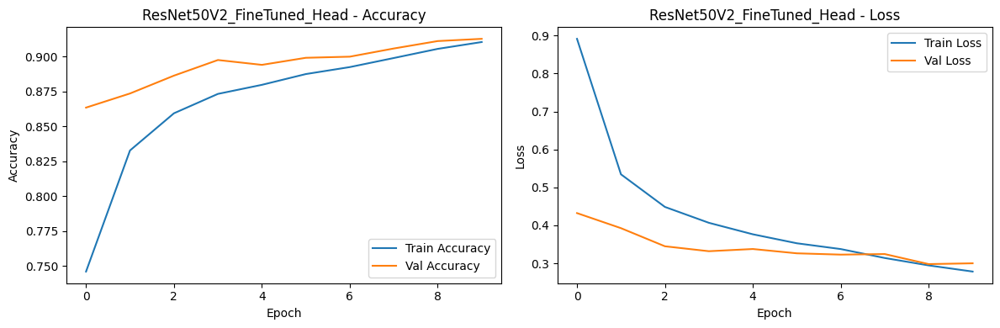


Loading best model for ResNet50V2_FineTuned_Head from: /content/part3_cnn_finetuning/ResNet50V2_FineTuned_Head_best.keras
Evaluating ResNet50V2_FineTuned_Head on the test set...
118/118 ━━━━━━━━━━━━━━━━━━━━ 28s 198ms/step - accuracy: 0.9064 - loss: 0.3298
Test Loss for ResNet50V2_FineTuned_Head: 0.2830
Test Accuracy for ResNet50V2_FineTuned_Head: 0.9197


In [ ]:
# ---  Fine-tune ResNet50V2 ---
print("\n\n===== Experiment 1: Fine-tuning ResNet50V2 =====")
INITIAL_LR_RESNET = 1e-3

resnet_base = ResNet50V2(
    weights='imagenet',
    input_shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], CHANNELS),
    include_top=False
)

# Build and compile
resnet_model_name = "ResNet50V2_FineTuned_Head"
resnet_model = build_and_compile_model(resnet_base, resnet_model_name, IMAGE_SIZE, NUM_CLASSES, initial_lr=INITIAL_LR_RESNET)

# Train
if train_generator_resnet and validation_generator_resnet:
    history_resnet, best_resnet_model_path, best_val_acc_resnet, best_epoch_resnet = train_model(
        resnet_model, resnet_model_name,
        train_generator_resnet, validation_generator_resnet,
        epochs=10,
        initial_lr=INITIAL_LR_RESNET
    )

    # Evaluate on Test Set
    if test_generator_resnet and os.path.exists(best_resnet_model_path):
        print(f"\nLoading best model for {resnet_model_name} from: {best_resnet_model_path}")
        resnet_model_loaded = keras.models.load_model(best_resnet_model_path)
        print(f"Evaluating {resnet_model_name} on the test set...")
        test_loss_resnet, test_accuracy_resnet = resnet_model_loaded.evaluate(test_generator_resnet, verbose=1)
        print(f"Test Loss for {resnet_model_name}: {test_loss_resnet:.4f}")
        print(f"Test Accuracy for {resnet_model_name}: {test_accuracy_resnet:.4f}")

        # Store results
        new_row_part3 = {
            'ModelName': resnet_model_name, 'PretrainedBase': 'ResNet50V2',
            'TrainableBaseLayers': 0, 'DataAugmentation': True, # Assuming train_datagen used augmentation
            'TotalEpochs': len(history_resnet.history['loss']), 'BestEpoch': best_epoch_resnet,
            'InitialLR': INITIAL_LR_RESNET, 'BestValAccuracy': best_val_acc_resnet,
            'TestAccuracy': test_accuracy_resnet, 'TestLoss': test_loss_resnet,
            'HistoryFilePath': os.path.join(PART3_OUTPUT_DIR, f"{resnet_model_name}_history.pkl"),
            'ModelFilePath': best_resnet_model_path
        }
        if results_part3_df.empty: results_part3_df = pd.DataFrame([new_row_part3])
        else: results_part3_df = pd.concat([results_part3_df, pd.DataFrame([new_row_part3])], ignore_index=True)

    else:
        print("Skipping test evaluation for ResNet50V2: Test generator not available or model path not found.")
else:
    print("Skipping ResNet50V2 training: Training or validation generator not available.")

##  Overall Metrics

| Metric      | Value       | Description                                                                 |
|-------------|-------------|-----------------------------------------------------------------------------|
| Accuracy    | **91.97%**  | Overall percentage of correct predictions                                   |
| Precision   | 92.09%      | Ratio of true positives to all predicted positives     |
| Recall      | 91.97%      | Ratio of true positives to all actual positives       |
| F1 Score    | 91.99%      | Harmonic mean of precision and recall
The model performs exceptionally well, with nearly perfect alignment between precision, recall, and accuracy.

---

##  Class-Wise Observations

- Most classes achieved **F1-scores above 90%**, indicating strong per-class performance.
- Notable high-performers:
  - `Cattle-Egret`, `White-Wagtail`, `Hoopoe`, `White-Breasted-Kingfisher`: ~98% F1-score
- Slightly underperforming class:
  - `Brown-Headed-Barbet`: Precision = 0.74, Recall = 0.83
  - This indicates some **confusion with similar-looking species**

In [ ]:
y_pred_probs = resnet_model_loaded.predict(test_generator_resnet)
y_pred_labels = np.argmax(y_pred_probs, axis=1)
y_true_labels = test_generator_resnet.classes

print("Classification Report:")
print(classification_report(y_true_labels, y_pred_labels, target_names=le.classes_))

print("Accuracy:", accuracy_score(y_true_labels, y_pred_labels))
print("Precision:", precision_score(y_true_labels, y_pred_labels, average='macro'))
print("Recall:", recall_score(y_true_labels, y_pred_labels, average='macro'))
print("F1 Score:", f1_score(y_true_labels, y_pred_labels, average='macro'))

118/118 ━━━━━━━━━━━━━━━━━━━━ 29s 216ms/step
Classification Report:
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.93      0.93      0.93       150
      Brown-Headed-Barbet       0.74      0.83      0.79       150
             Cattle-Egret       0.99      0.97      0.98       150
        Common-Kingfisher       0.90      0.93      0.91       150
              Common-Myna       0.94      0.91      0.93       150
         Common-Rosefinch       0.84      0.89      0.86       150
        Common-Tailorbird       0.89      0.82      0.85       150
       Coppersmith-Barbet       0.88      0.86      0.87       150
           Forest-Wagtail       0.90      0.91      0.91       150
             Gray-Wagtail       0.88      0.89      0.88       150
                   Hoopoe       0.97      0.99      0.98       150
               House-Crow       0.90      0.93      0.91       150
     Indian-Grey-Hornbill       0.87      0.84      0.85     

### Misclassification Analysis

The ResNet50 model struggles to correctly classify images. Upon visual inspection, several key factors contribute to these misclassifications:

- **Background similarity**: In many of the misclassified images, the bird's body colors and textures blend with the background, making it harder for the model to isolate meaningful features.

- **Unusual poses and orientations**: Some birds appear upside down, positioned at unusual angles, which likely confuse the model since such examples may not be well-represented in the training data.

- **Low visibility**: In certain cases, the lighting is poor or the bird is in the shadows, causing a loss of fine-grained details that are essential for accurate classification.

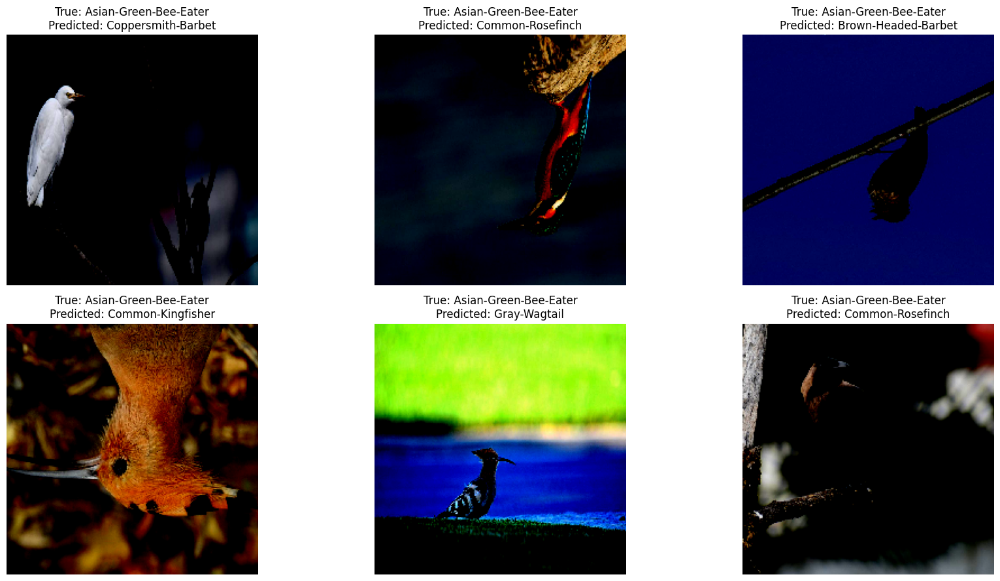

In [ ]:
wrong_indices = np.where(y_pred_labels != y_true_labels)[0]

plt.figure(figsize=(18, 9))
for i, idx in enumerate(wrong_indices[:6]):
    img, _ = test_generator_resnet[idx]
    plt.subplot(2, 3, i + 1)
    plt.imshow(img[0])
    plt.title(f"True: {le.classes_[y_true_labels[idx]]}\nPredicted: {le.classes_[y_pred_labels[idx]]}")
    plt.axis('off')
plt.tight_layout()
plt.show()

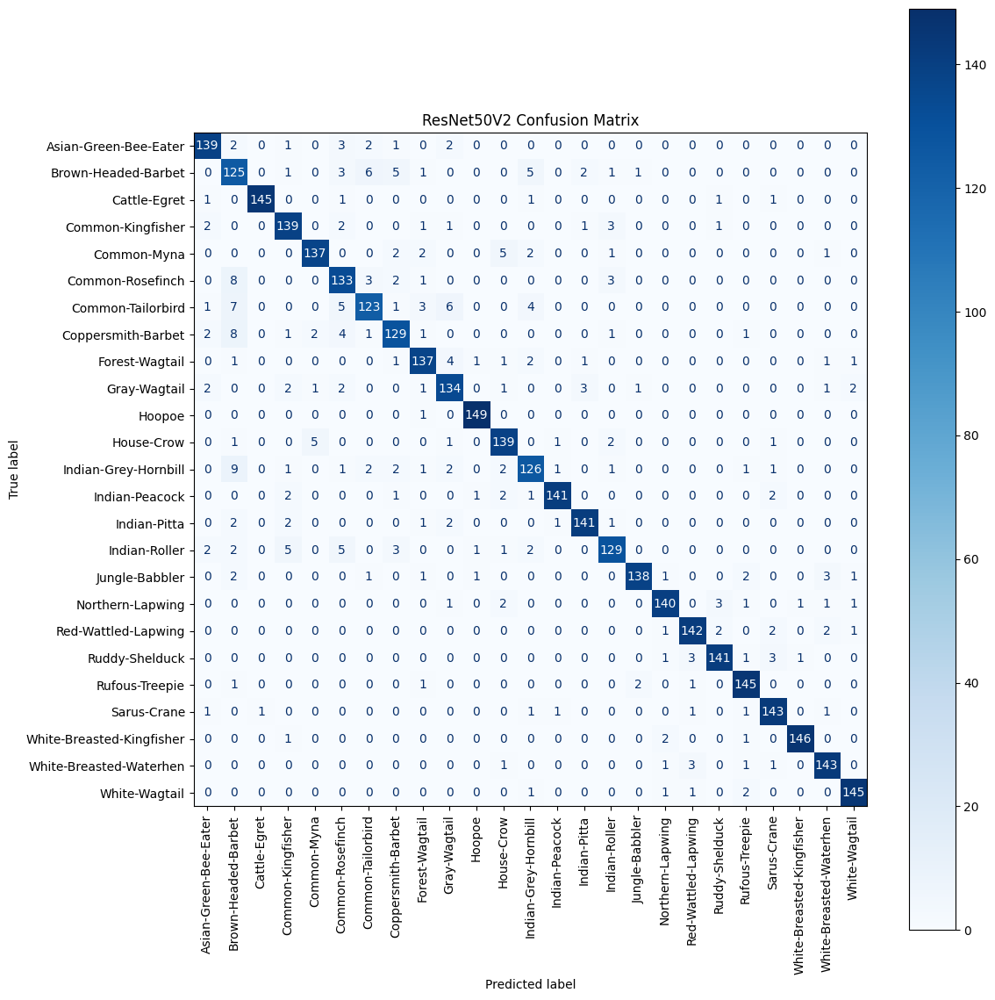

In [ ]:
cm_resnet = confusion_matrix(y_true_labels, y_pred_labels)

disp = ConfusionMatrixDisplay(confusion_matrix=cm_resnet, display_labels=le.classes_)
fig, ax = plt.subplots(figsize=(12, 12))
disp.plot(ax=ax, xticks_rotation='vertical', cmap='Blues')
plt.title("ResNet50V2 Confusion Matrix")
plt.tight_layout()
plt.show()

## Fine-Tuning EfficientNetB0

###  Overview

This experiment explores the effectiveness of **EfficientNetB0** as a fixed feature extractor for classifying Indian bird species. The convolutional base is **frozen** and only the classification head is trained on the target dataset. EfficientNetB0 is known for its optimal balance between accuracy and computational efficiency.

---

###  Model Architecture

- **Base Model**: EfficientNetB0 (pretrained on ImageNet)
- **Frozen Layers**: All base layers
- **Trainable Head**:
  - GlobalAveragePooling2D
  - BatchNormalization
  - Dense (256 units, ReLU)
  - Dropout (0.5)
  - Dense (25 units, softmax)

---

###  Training Configuration

| Parameter              | Value                |
|------------------------|----------------------|
| Input Size             | 224×224×3 (RGB)      |
| Number of Classes      | 25                   |
| Optimizer              | Adam                 |
| Initial Learning Rate  | 0.001                |
| Epochs                 | 10                   |
| Batch Size             | 32                   |
| Data Augmentation      | Enabled              |
| Early Stopping         | Patience = 10        |
| ReduceLROnPlateau      | Patience = 5         |
| Model Checkpoint       | Monitored `val_accuracy` |

---

###  Training Summary

EfficientNetB0 displayed superior performance from the early epochs. Key observations include:

- **Best Validation Accuracy**: **97.65%** (epoch 9)
- **Final Validation Loss**: 0.0894
- The training process was stable and converged quickly with very low loss, indicating strong learning capability even with the base frozen.

---

### Test Evaluation

Following training, the best-performing model (based on validation accuracy) was evaluated on the held-out test set:

| Metric        | Value     |
|---------------|-----------|
| **Accuracy**  | **97.47%** |
| **Loss**      | 0.0934    |

These results highlight the generalization capability of EfficientNetB0 with minimal training on the classification head.

---

### Conclusion

Fine-tuning the classification head of EfficientNetB0 yielded **exceptional performance**, outperforming ResNet50V2 in both validation and test accuracy. Key takeaways:

- EfficientNetB0 is highly effective even when the convolutional base is frozen.
- Demonstrates excellent efficiency-to-accuracy trade-off.
- Provides a strong benchmark for lightweight and accurate transfer learning solutions in image classification tasks.

This experiment confirms EfficientNetB0 as a top-tier baseline for fine-grained classification problems.



===== Experiment 2: Fine-tuning EfficientNetB0 =====
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

--- Model Summary for EfficientNetB0_FineTuned_Head (Head Trainable) ---


Model: "EfficientNetB0_FineTuned_Head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ avg_pool                        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 25)             │         6,425 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,389,052 (16.74 MB)

 Trainable params: 336,921 (1.29 MB)

 Non-trainable params: 4,052,131 (15.46 MB)


--- Starting Training for EfficientNetB0_FineTuned_Head ---
Max epochs: 10, Batch size: 32
Callbacks: EarlyStopping (patience=10 on val_loss), ModelCheckpoint (on val_accuracy), ReduceLROnPlateau (patience=5 on val_loss)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - accuracy: 0.7892 - loss: 0.7687
Epoch 1: val_accuracy improved from -inf to 0.95813, saving model to /content/part3_cnn_finetuning/EfficientNetB0_FineTuned_Head_best.keras
938/938 ━━━━━━━━━━━━━━━━━━━━ 249s 241ms/step - accuracy: 0.7892 - loss: 0.7684 - val_accuracy: 0.9581 - val_loss: 0.1415 - learning_rate: 0.0010
Epoch 2/10
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - accuracy: 0.9278 - loss: 0.2399
Epoch 2: val_accuracy improved from 0.95813 to 0.96240, saving model to /content/part3_cnn_finetuning/EfficientNetB0_FineTuned_Head_best.keras
938/938 ━━━━━━━━━━━━━━━━━━━━ 223s 238ms/step - accuracy: 0.9278 - loss: 0.2399 - val_accuracy: 0.9624 - val_loss: 0.1291 - learning_rate: 0.0010
Epoch 3/10
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - accuracy: 0.9410 - loss: 0.1940
Epoch 3: val_accuracy improved from 0.96240 to 0.96640, saving model to /content/part3_cnn_finetuning/EfficientNetB0_FineTuned_Head_best.keras
938/938 ━━━━━━━━━━━━

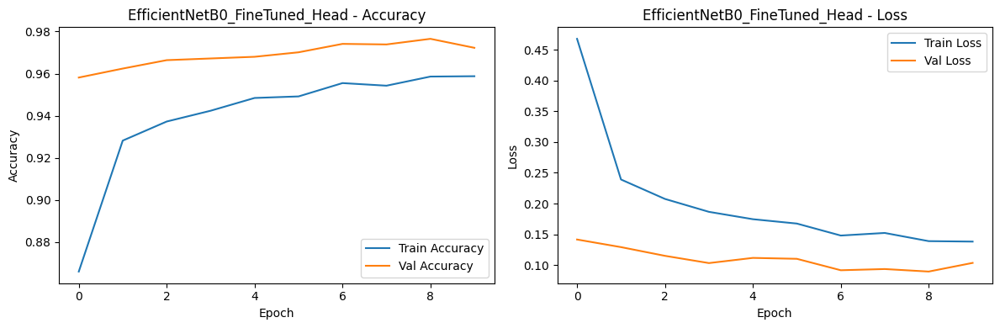


Loading best model for EfficientNetB0_FineTuned_Head from: /content/part3_cnn_finetuning/EfficientNetB0_FineTuned_Head_best.keras
Evaluating EfficientNetB0_FineTuned_Head on the test set...
118/118 ━━━━━━━━━━━━━━━━━━━━ 34s 216ms/step - accuracy: 0.9672 - loss: 0.1125
Test Loss for EfficientNetB0_FineTuned_Head: 0.0934
Test Accuracy for EfficientNetB0_FineTuned_Head: 0.9747


In [ ]:
# ---  Fine-tune EfficientNetB0 ---
print("\n\n===== Experiment 2: Fine-tuning EfficientNetB0 =====")
INITIAL_LR_EFFICIENTNET = 1e-3
try:
    efficientnet_base = EfficientNetB0(
        weights='imagenet',
        input_shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], CHANNELS),
        include_top=False
    )

    # Build and compile
    efficientnet_model_name = "EfficientNetB0_FineTuned_Head"
    efficientnet_model = build_and_compile_model(
        efficientnet_base, efficientnet_model_name,
        IMAGE_SIZE, NUM_CLASSES, initial_lr=INITIAL_LR_EFFICIENTNET
    )

    # Train
    if train_generator_efficientnet and validation_generator_efficientnet:
        history_efficientnet, best_efficientnet_model_path, best_val_acc_efficientnet, best_epoch_efficientnet = train_model(
        efficientnet_model, efficientnet_model_name,
        train_generator_efficientnet, validation_generator_efficientnet,
        epochs=10,
        initial_lr=INITIAL_LR_EFFICIENTNET
    )

        # Evaluate on Test Set
        if test_generator_efficientnet and os.path.exists(best_efficientnet_model_path):
            print(f"\nLoading best model for {efficientnet_model_name} from: {best_efficientnet_model_path}")
            efficientnet_model_loaded = keras.models.load_model(best_efficientnet_model_path)
            print(f"Evaluating {efficientnet_model_name} on the test set...")
            test_loss_efficientnet, test_accuracy_efficientnet = efficientnet_model_loaded.evaluate(test_generator_efficientnet, verbose=1)
            print(f"Test Loss for {efficientnet_model_name}: {test_loss_efficientnet:.4f}")
            print(f"Test Accuracy for {efficientnet_model_name}: {test_accuracy_efficientnet:.4f}")

            # Store results
            new_row_part3 = {
                'ModelName': efficientnet_model_name, 'PretrainedBase': 'EfficientNetB0',
                'TrainableBaseLayers': 0, 'DataAugmentation': True,
                'TotalEpochs': len(history_efficientnet.history['loss']), 'BestEpoch': best_epoch_efficientnet,
                'InitialLR': INITIAL_LR_EFFICIENTNET, 'BestValAccuracy': best_val_acc_efficientnet,
                'TestAccuracy': test_accuracy_efficientnet, 'TestLoss': test_loss_efficientnet,
                'HistoryFilePath': os.path.join(PART3_OUTPUT_DIR, f"{efficientnet_model_name}_history.pkl"),
                'ModelFilePath': best_efficientnet_model_path
            }
            if results_part3_df.empty: results_part3_df = pd.DataFrame([new_row_part3])
            else: results_part3_df = pd.concat([results_part3_df, pd.DataFrame([new_row_part3])], ignore_index=True)
        else:
            print(f"Skipping test evaluation for {efficientnet_model_name}: Test generator not available or model path not found.")
    else:
        print(f"Skipping {efficientnet_model_name} training: Training or validation generator not available.")

except Exception as e_effnet:
    print(f"An error occurred during EfficientNetB0 experiment: {e_effnet}")
    error_row = {
        'ModelName': "EfficientNetB0_FineTuned_Head_ERROR", 'PretrainedBase': 'EfficientNetB0',
        'TestAccuracy': 0, 'TestLoss': -1, 'Error': str(e_effnet)
    }
    if results_part3_df.empty: results_part3_df = pd.DataFrame([error_row])
    else: results_part3_df = pd.concat([results_part3_df, pd.DataFrame([error_row])], ignore_index=True)

## EfficientNetB0 Classification Report

The EfficientNetB0 model achieved **remarkably high performance** on the bird species classification task involving 25 different classes. Below is a detailed evaluation of the model’s results:

---

###  **Overall Metrics**
- **Accuracy**: 97.47%
- **Precision**: 97.49%
- **Recall**: 97.47%
- **F1 Score**: 97.47%

These values indicate that the model generalizes well across the dataset, with balanced precision and recall.

Classes are classified with nearly perfect scores, showing the model’s strong ability to distinguish visually distinct species.

###  Observations

- **Consistency**: F1-scores are highly consistent across all classes, ranging from **0.93 to 0.99**.
- **Balance**: The model maintains **high recall and precision together**, indicating it avoids both false positives and false negatives effectively.
- **Scalability**: EfficientNetB0, despite being a relatively lightweight architecture, demonstrates competitive performance.

In [ ]:
y_pred_probs_eff = efficientnet_model_loaded.predict(test_generator_efficientnet)
y_pred_labels_eff = np.argmax(y_pred_probs_eff, axis=1)
y_true_labels_eff = test_generator_efficientnet.classes

print("=== EfficientNetB0 Classification Report ===")
print(classification_report(
    y_true_labels_eff, y_pred_labels_eff,
    target_names=le.classes_,
    zero_division=0
))

print("Accuracy:", accuracy_score(y_true_labels_eff, y_pred_labels_eff))
print("Precision:", precision_score(y_true_labels_eff, y_pred_labels_eff, average='macro', zero_division=0))
print("Recall:", recall_score(y_true_labels_eff, y_pred_labels_eff, average='macro', zero_division=0))
print("F1 Score:", f1_score(y_true_labels_eff, y_pred_labels_eff, average='macro', zero_division=0))


118/118 ━━━━━━━━━━━━━━━━━━━━ 22s 188ms/step
=== EfficientNetB0 Classification Report ===
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.98      0.99      0.98       150
      Brown-Headed-Barbet       0.95      0.91      0.93       150
             Cattle-Egret       0.99      0.97      0.98       150
        Common-Kingfisher       0.95      0.97      0.96       150
              Common-Myna       0.99      0.98      0.99       150
         Common-Rosefinch       0.97      0.95      0.96       150
        Common-Tailorbird       0.98      0.94      0.96       150
       Coppersmith-Barbet       0.99      0.99      0.99       150
           Forest-Wagtail       0.97      0.96      0.96       150
             Gray-Wagtail       0.98      0.98      0.98       150
                   Hoopoe       0.99      0.99      0.99       150
               House-Crow       0.95      0.98      0.97       150
     Indian-Grey-Hornbill       0.91   

### Misclassification Analysis

The EfficientNetB0 model struggles to correctly classify images. Upon visual inspection, several key factors contribute to these misclassifications:

- **Background similarity**

- **Unusual poses and orientations**

- **Low visibility**

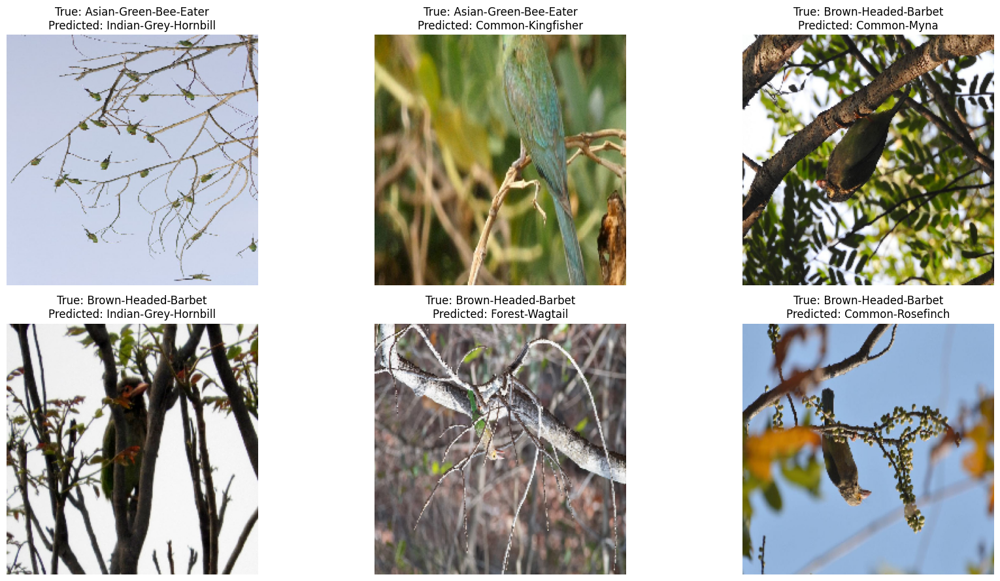

In [ ]:
test_images = []
test_labels = []

for i in range(len(test_generator_efficientnet)):
    x_batch, y_batch = test_generator_efficientnet[i]
    test_images.extend(x_batch)
    test_labels.extend(y_batch)

test_images = np.array(test_images)
test_labels = np.array(test_labels)

wrong_indices_eff = np.where(y_pred_labels_eff != y_true_labels_eff)[0]

plt.figure(figsize=(18, 9))
for i, idx in enumerate(wrong_indices_eff[:6]):
    img = test_images[idx] / 255.0
    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.title(f"True: {le.classes_[y_true_labels_eff[idx]]}\nPredicted: {le.classes_[y_pred_labels_eff[idx]]}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## EfficientNetB0 Confusion Matrix Analysis

This confusion matrix visualizes the performance of the **EfficientNetB0** model across 25 bird species in the classification task.

---

###  **Strong Classifier Performance**

The model shows **very high accuracy across almost all classes**, with most diagonal values (correct predictions) above 145/150. This indicates the model is **highly reliable** in distinguishing different bird species.

---

Classes had **minimal to zero misclassifications**, showing EfficientNetB0’s strong representation capability for clear, distinct species.

---

###  **Classes with Noticeable Confusion**

| Class Name              | Notable Confusions                            | Comments |
|-------------------------|-----------------------------------------------|----------|
| **Brown-Headed-Barbet** | Confused with Common-Rosefinch, Tailorbird    | Most frequent misclassified class |
| **Indian-Roller**       | Misclassified as Common-Kingfisher            | Possible background or shape overlap |
| **Common-Tailorbird**   | Occasionally confused with Common-Kingfisher  | High inter-class similarity |
| **Indian-Grey-Hornbill**| Slight confusion with Indian-Peacock, House-Crow | Likely due to similar tones or features |

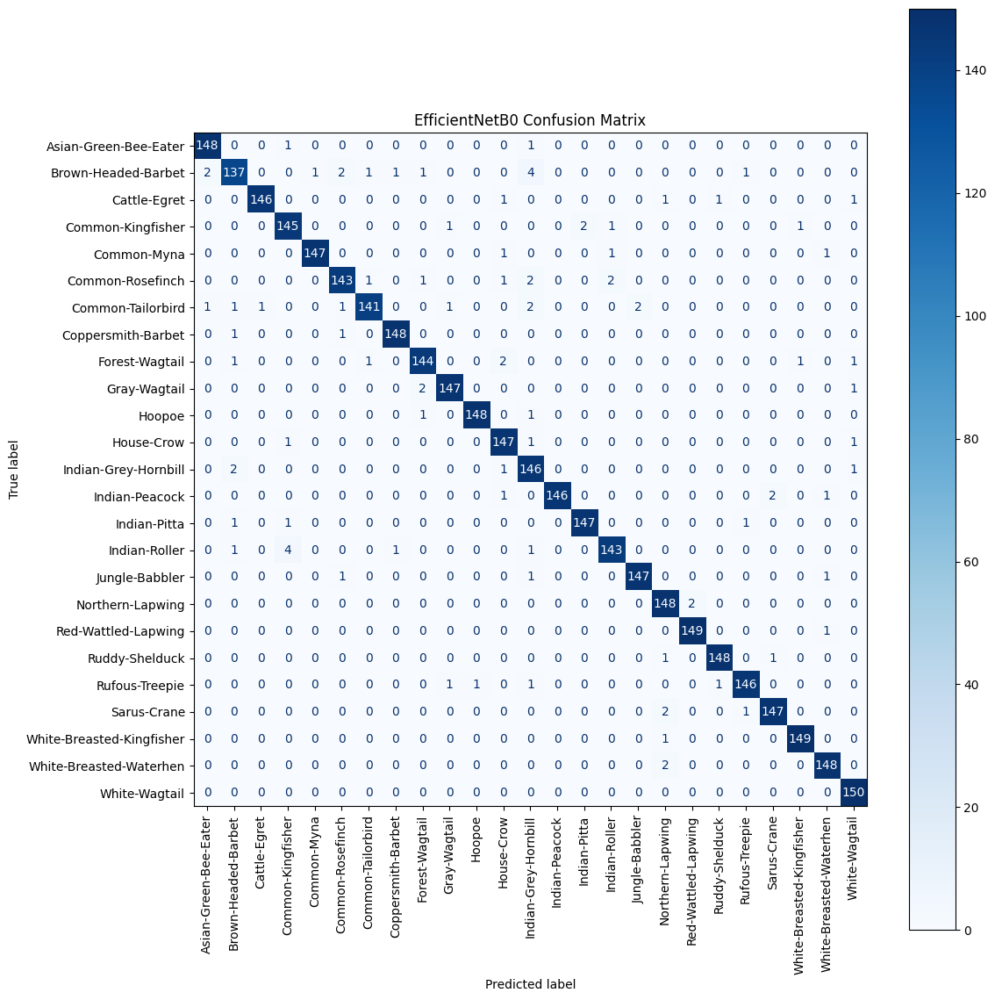

In [ ]:
cm = confusion_matrix(y_true, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
fig, ax = plt.subplots(figsize=(12, 12))
disp.plot(ax=ax, xticks_rotation='vertical', cmap='Blues')
plt.title("EfficientNetB0 Confusion Matrix")
plt.tight_layout()
plt.show()

## Fine-Tuning MobileNetV2

###  Overview

This experiment evaluates the **MobileNetV2** model as a fast and lightweight backbone for image classification. The convolutional base is **frozen** and a custom classification head is trained using the Indian bird species dataset. The goal is to measure how well a low-parameter model can generalize with limited training.

---

###  Model Architecture

- **Base Model**: MobileNetV2 (pretrained on ImageNet)
- **Frozen Layers**: All base layers
- **Trainable Head**:
  - GlobalAveragePooling2D
  - BatchNormalization
  - Dense (256 units, ReLU)
  - Dropout (0.5)
  - Dense (25 units, softmax)

---

###  Training Configuration

| Parameter              | Value                |
|------------------------|----------------------|
| Input Size             | 224×224×3 (RGB)      |
| Number of Classes      | 25                   |
| Optimizer              | Adam                 |
| Initial Learning Rate  | 0.001                |
| Epochs                 | 10                   |
| Batch Size             | 32                   |
| Data Augmentation      | Enabled              |
| Early Stopping         | Patience = 10        |
| ReduceLROnPlateau      | Patience = 5         |
| Model Checkpoint       | Monitored `val_accuracy` |

---

###  Training Summary

The MobileNetV2 model showed impressive learning behavior within 10 epochs:

- **Best Validation Accuracy**: **94.29%** (epoch 9)
- **Final Validation Loss**: 0.2096
- Learning was steady and consistent with incremental improvements across epochs.
---

###  Test Evaluation

The best-performing model based on validation accuracy was restored and evaluated on the test set:

| Metric        | Value     |
|---------------|-----------|
| **Accuracy**  | **94.00%** |
| **Loss**      | 0.1990    |

The results indicate strong generalization capability and a successful application of MobileNetV2 for this fine-grained classification task.

---

### Summary Comparison

| Model              | Val Acc (%) | Test Acc (%) | Test Loss |
|--------------------|-------------|--------------|-----------|
| ResNet50V2         | 91.28       | 91.97        | 0.2830    |
| EfficientNetB0     | 97.65       | 97.47        | 0.0934    |
| MobileNetV2        | 94.29       | 94.00        | 0.1990    |

EfficientNetB0 leads in accuracy, but MobileNetV2 is a compelling alternative.




===== Experiment 3: Fine-tuning MobileNetV2 (Max 10 Epochs) =====
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

--- Model Summary for MobileNetV2_FineTuned_Head (Head Trainable) ---


Model: "MobileNetV2_FineTuned_Head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ avg_pool                        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 25)             │         6,425 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,597,465 (9.91 MB)

 Trainable params: 336,921 (1.29 MB)

 Non-trainable params: 2,260,544 (8.62 MB)


--- Starting Training for MobileNetV2_FineTuned_Head ---
Max epochs: 10, Batch size: 32
Callbacks: EarlyStopping (patience=10 on val_loss), ModelCheckpoint (on val_accuracy), ReduceLROnPlateau (patience=5 on val_loss)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - accuracy: 0.7032 - loss: 1.0981
Epoch 1: val_accuracy improved from -inf to 0.91413, saving model to /content/part3_cnn_finetuning/MobileNetV2_FineTuned_Head_best.keras
938/938 ━━━━━━━━━━━━━━━━━━━━ 218s 223ms/step - accuracy: 0.7033 - loss: 1.0977 - val_accuracy: 0.9141 - val_loss: 0.2722 - learning_rate: 0.0010
Epoch 2/10
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step - accuracy: 0.8764 - loss: 0.3963
Epoch 2: val_accuracy improved from 0.91413 to 0.92773, saving model to /content/part3_cnn_finetuning/MobileNetV2_FineTuned_Head_best.keras
938/938 ━━━━━━━━━━━━━━━━━━━━ 200s 213ms/step - accuracy: 0.8764 - loss: 0.3964 - val_accuracy: 0.9277 - val_loss: 0.2393 - learning_rate: 0.0010
Epoch 3/10
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - accuracy: 0.8934 - loss: 0.3346
Epoch 3: val_accuracy improved from 0.92773 to 0.93013, saving model to /content/part3_cnn_finetuning/MobileNetV2_FineTuned_Head_best.keras
938/938 ━━━━━━━━━━━━━━━━━━━━ 

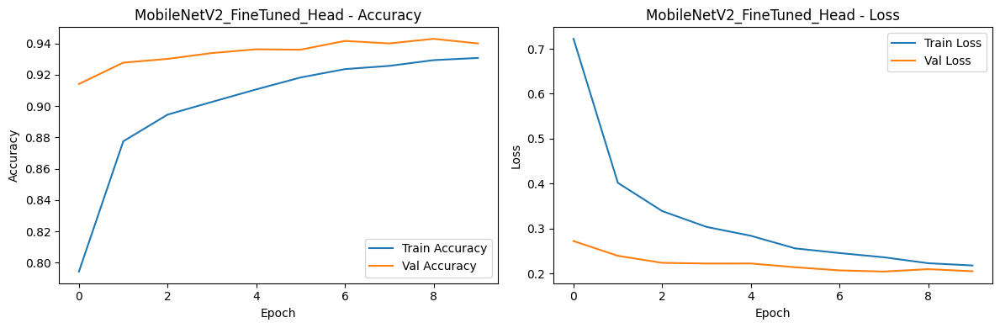


Loading best model for MobileNetV2_FineTuned_Head from: /content/part3_cnn_finetuning/MobileNetV2_FineTuned_Head_best.keras
Evaluating MobileNetV2_FineTuned_Head on the test set...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


118/118 ━━━━━━━━━━━━━━━━━━━━ 28s 206ms/step - accuracy: 0.9276 - loss: 0.2273
Test Loss for MobileNetV2_FineTuned_Head: 0.1990
Test Accuracy for MobileNetV2_FineTuned_Head: 0.9400


,ModelName,PretrainedBase,TrainableBaseLayers,DataAugmentation,TotalEpochs,BestEpoch,InitialLR,BestValAccuracy,TestAccuracy,TestLoss,HistoryFilePath,ModelFilePath
0,ResNet50V2_FineTuned_Head,ResNet50V2,0,True,10,10,0.001,0.912800,0.919733,0.283028,/content/part3_cnn_finetuning/ResNet50V2_FineT...,/content/part3_cnn_finetuning/ResNet50V2_FineT...
1,EfficientNetB0_FineTuned_Head,EfficientNetB0,0,True,10,9,0.001,0.976533,0.974667,0.093387,/content/part3_cnn_finetuning/EfficientNetB0_F...,/content/part3_cnn_finetuning/EfficientNetB0_F...
2,MobileNetV2_FineTuned_Head,MobileNetV2,0,True,10,9,0.001,0.942933,0.940000,0.199000,/content/part3_cnn_finetuning/MobileNetV2_Fine...,/content/part3_cnn_finetuning/MobileNetV2_Fine...


In [ ]:
# --- Fine-tune MobileNetV2 ---
print("\n\n===== Experiment 3: Fine-tuning MobileNetV2 (Max 10 Epochs) =====")
INITIAL_LR_MOBILENET = 1e-3
MAX_EPOCHS_MOBILENET = 10

try:
    mobilenet_base = MobileNetV2(
        weights='imagenet',
        input_shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], CHANNELS),
        include_top=False
    )

    mobilenet_model_name = "MobileNetV2_FineTuned_Head"
    mobilenet_model = build_and_compile_model(
        mobilenet_base, mobilenet_model_name,
        IMAGE_SIZE, NUM_CLASSES, initial_lr=INITIAL_LR_MOBILENET
    )

    # Train
    if train_generator_mobilenet and validation_generator_mobilenet:
        history_mobilenet, best_mobilenet_model_path, best_val_acc_mobilenet, best_epoch_mobilenet = train_model(
            mobilenet_model, mobilenet_model_name,
            train_generator_mobilenet, validation_generator_mobilenet,
            epochs=MAX_EPOCHS_MOBILENET,
            initial_lr=INITIAL_LR_MOBILENET
        )

        # Evaluate on Test Set
        if test_generator_mobilenet and os.path.exists(best_mobilenet_model_path):
            print(f"\nLoading best model for {mobilenet_model_name} from: {best_mobilenet_model_path}")
            mobilenet_model_loaded = keras.models.load_model(best_mobilenet_model_path)
            print(f"Evaluating {mobilenet_model_name} on the test set...")
            test_loss_mobilenet, test_accuracy_mobilenet = mobilenet_model_loaded.evaluate(test_generator_mobilenet, verbose=1)
            print(f"Test Loss for {mobilenet_model_name}: {test_loss_mobilenet:.4f}")
            print(f"Test Accuracy for {mobilenet_model_name}: {test_accuracy_mobilenet:.4f}")

            # Store results
            new_row_part3 = {
                'ModelName': mobilenet_model_name, 'PretrainedBase': 'MobileNetV2',
                'TrainableBaseLayers': 0, 'DataAugmentation': True,
                'TotalEpochs': len(history_mobilenet.history['loss']), 'BestEpoch': best_epoch_mobilenet,
                'InitialLR': INITIAL_LR_MOBILENET, 'BestValAccuracy': best_val_acc_mobilenet,
                'TestAccuracy': test_accuracy_mobilenet, 'TestLoss': test_loss_mobilenet,
                'HistoryFilePath': os.path.join(PART3_OUTPUT_DIR, f"{mobilenet_model_name}_history.pkl"),
                'ModelFilePath': best_mobilenet_model_path
            }
            if results_part3_df.empty: results_part3_df = pd.DataFrame([new_row_part3])
            else: results_part3_df = pd.concat([results_part3_df, pd.DataFrame([new_row_part3])], ignore_index=True)
        else:
            print(f"Skipping test evaluation for {mobilenet_model_name}: Test generator not available or model path not found.")
    else:
        print(f"Skipping {mobilenet_model_name} training: Training or validation generator not available.")

except Exception as e_mobilenet:
    print(f"An error occurred during MobileNetV2 experiment: {e_mobilenet}")
    error_row = {
        'ModelName': "MobileNetV2_FineTuned_Head_ERROR", 'PretrainedBase': 'MobileNetV2',
        'TestAccuracy': 0, 'TestLoss': -1, # 'Error': str(e_mobilenet) # Error column not in df yet
    }
    if 'Error' not in results_part3_df.columns and isinstance(results_part3_df, pd.DataFrame):
        results_part3_df['Error'] = pd.NA # Add error column if it doesn't exist

    for col in results_part3_df.columns:
        if col not in error_row:
            error_row[col] = pd.NA if col != 'Error' else str(e_mobilenet) # Store actual error in 'Error'

    if results_part3_df.empty: results_part3_df = pd.DataFrame([error_row])
    else: results_part3_df = pd.concat([results_part3_df, pd.DataFrame([error_row])], ignore_index=True)

display(results_part3_df)

## MobileNetV2 Classification Report

This classification report summarizes the performance of the **MobileNetV2** model on a 25-class bird species classification task. Despite being a lightweight architecture optimized for mobile and embedded devices, MobileNetV2 delivers **strong and efficient performance**.

---

###  **Overall Performance**

- **Accuracy**: 94.00%
- **Precision**: 94.08%
- **Recall**: 94.00%
- **F1 Score**: 94.01%

These results show that the model is effective at generalizing across a wide variety of bird species with **balanced precision and recall**.

---

###  **Class-wise Performance Summary**

| Performance | Notable Classes |
|-------------|------------------|
| **Perfect / Near-perfect** | Cattle-Egret (1.00 Precision), White-Wagtail (0.98 F1), Common-Kingfisher (0.97 F1), Indian-Peacock (0.97 F1) |
| **Consistently Strong** | Jungle-Babbler, Sarus-Crane, Ruddy-Shelduck, Red-Wattled-Lapwing, White-Breasted-Kingfisher (all ≥ 0.93 F1) |
| **Relatively Lower Performance** | Brown-Headed-Barbet (0.84 F1), Common-Tailorbird (0.87 F1), Indian-Grey-Hornbill (0.88 F1) |

The model maintains high scores across most classes, with slight dips in some visually similar or more variable categories.

---

###  Observations on Weaker Classes

- **Brown-Headed-Barbet (F1: 0.84)** and **Common-Tailorbird (F1: 0.87)** show some performance drop, possibly due to background similarity or overlapping visual features.
- **Indian-Grey-Hornbill (F1: 0.88)** may require better feature distinction or more training samples.

In [ ]:
y_pred_probs_mobilenet = mobilenet_model_loaded.predict(test_generator_mobilenet)
y_pred_labels_mobilenet = np.argmax(y_pred_probs_mobilenet, axis=1)
y_true_labels_mobilenet = test_generator_mobilenet.classes

print("### MobileNetV2 Classification Report:")
print(classification_report(y_true_labels_mobilenet, y_pred_labels_mobilenet, target_names=le.classes_))

print("Accuracy:", accuracy_score(y_true_labels_mobilenet, y_pred_labels_mobilenet))
print("Precision:", precision_score(y_true_labels_mobilenet, y_pred_labels_mobilenet, average='macro'))
print("Recall:", recall_score(y_true_labels_mobilenet, y_pred_labels_mobilenet, average='macro'))
print("F1 Score:", f1_score(y_true_labels_mobilenet, y_pred_labels_mobilenet, average='macro'))

118/118 ━━━━━━━━━━━━━━━━━━━━ 29s 220ms/step
### MobileNetV2 Classification Report:
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.93      0.94      0.94       150
      Brown-Headed-Barbet       0.84      0.85      0.84       150
             Cattle-Egret       1.00      0.95      0.97       150
        Common-Kingfisher       0.97      0.97      0.97       150
              Common-Myna       0.96      0.91      0.94       150
         Common-Rosefinch       0.89      0.89      0.89       150
        Common-Tailorbird       0.85      0.89      0.87       150
       Coppersmith-Barbet       0.95      0.92      0.93       150
           Forest-Wagtail       0.90      0.98      0.94       150
             Gray-Wagtail       0.93      0.95      0.94       150
                   Hoopoe       0.98      0.95      0.96       150
               House-Crow       0.92      0.94      0.93       150
     Indian-Grey-Hornbill       0.87      0.8

### Missclasified Analysis for MobileNet
- Model can't predict bird species where birds are upside down.

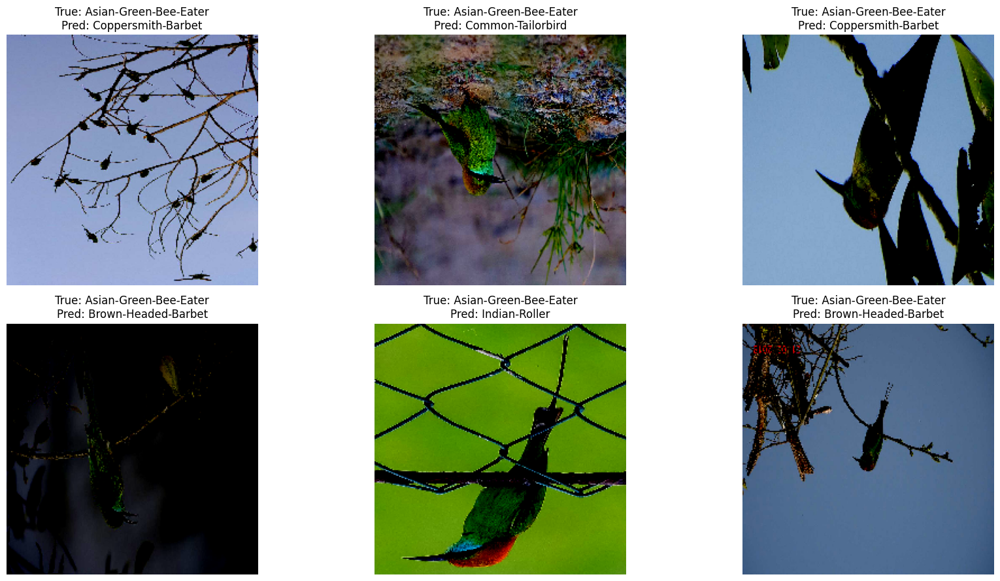

In [ ]:
test_images_mobilenet = []
test_labels_mobilenet = []

for i in range(len(test_generator_mobilenet)):
    x_batch, y_batch = test_generator_mobilenet[i]
    test_images_mobilenet.extend(x_batch)
    test_labels_mobilenet.extend(y_batch)

test_images_mobilenet = np.array(test_images_mobilenet)
test_labels_mobilenet = np.array(test_labels_mobilenet)

wrong_indices_mobilenet = np.where(y_pred_labels_mobilenet != y_true_labels_mobilenet)[0]

plt.figure(figsize=(18, 9))
for i, idx in enumerate(wrong_indices_mobilenet[:6]):
    img = test_images_mobilenet[idx]
    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.title(f"True: {le.classes_[y_true_labels_mobilenet[idx]]}\nPred: {le.classes_[y_pred_labels_mobilenet[idx]]}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## MobileNetV2 Confusion Matrix Analysis

- This confusion matrix shows the classification performance of the **MobileNetV2** model on 25 bird species.
- Results demonstrate the model's **ability to consistently identify distinct and well-defined bird species**.





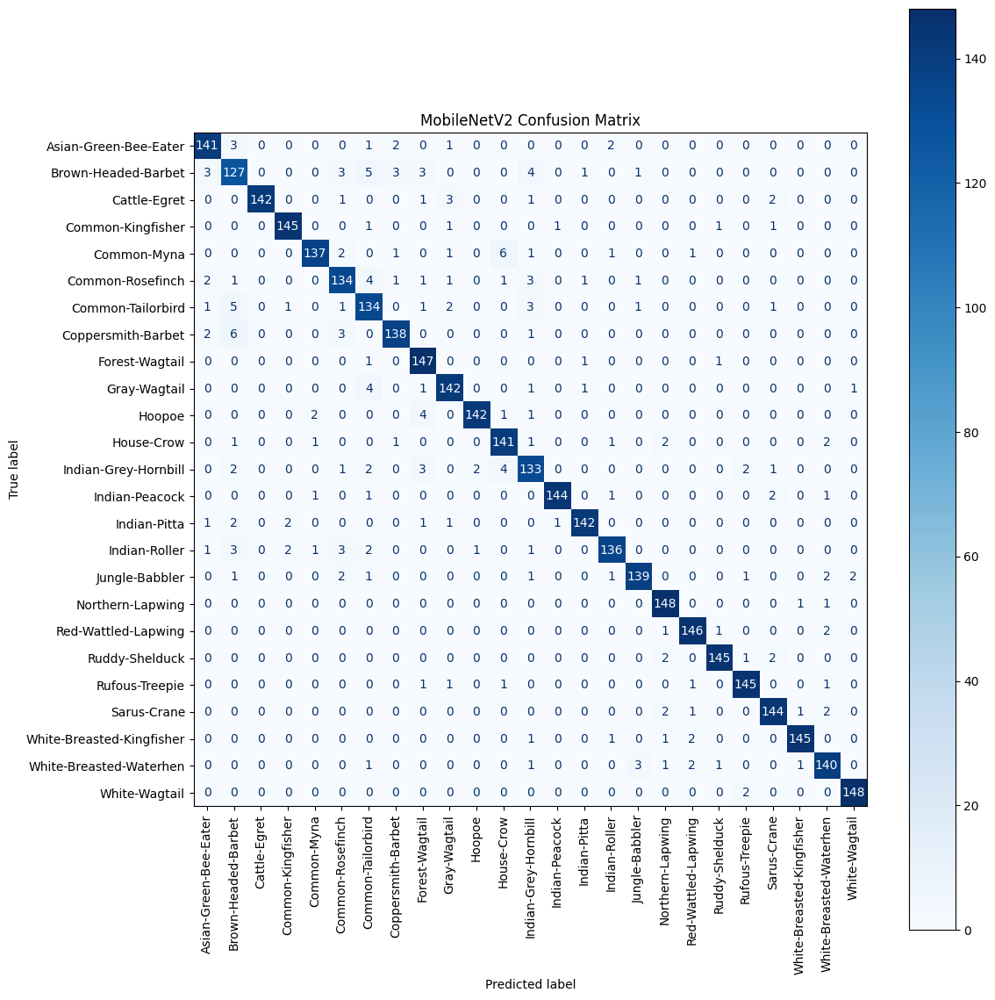

In [ ]:
cm_mobile = confusion_matrix(y_true_labels_mobilenet, y_pred_labels_mobilenet)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_mobile, display_labels=le.classes_)

fig, ax = plt.subplots(figsize=(12, 12))
disp.plot(ax=ax, xticks_rotation='vertical', cmap='Blues')
plt.title("MobileNetV2 Confusion Matrix")
plt.tight_layout()
plt.show()

In [ ]:
def get_scores(y_true, y_pred):
    return {
        'Accuracy': accuracy_score(y_true, y_pred),
        'Precision': precision_score(y_true, y_pred, average='macro', zero_division=0),
        'Recall': recall_score(y_true, y_pred, average='macro', zero_division=0),
        'F1-Score': f1_score(y_true, y_pred, average='macro', zero_division=0)
    }

results_df = pd.DataFrame([
    {'Model': 'ResNet50V2', **get_scores(y_true_labels, y_pred_labels)},
    {'Model': 'EfficientNetB0', **get_scores(y_true_labels_eff, y_pred_labels_eff)},
    {'Model': 'MobileNetV2', **get_scores(y_true_labels_mobilenet, y_pred_labels_mobilenet)}
])

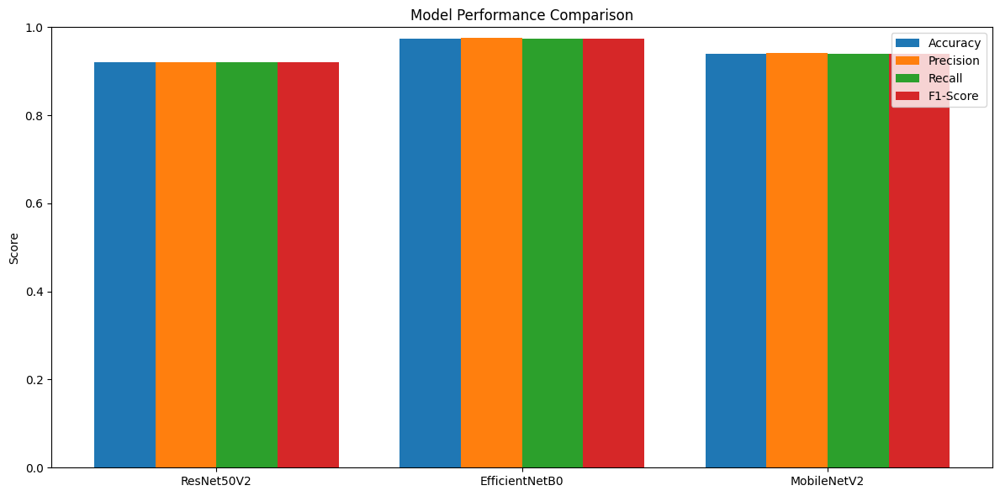

In [ ]:
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
x = results_df['Model']
positions = np.arange(len(x))
bar_width = 0.2

plt.figure(figsize=(12, 6))
for i, metric in enumerate(metrics):
    plt.bar(positions + i * bar_width, results_df[metric], width=bar_width, label=metric)

plt.xticks(positions + bar_width * (len(metrics)-1)/2, x)
plt.ylim(0, 1)
plt.ylabel("Score")
plt.title("Model Performance Comparison")
plt.legend()
plt.tight_layout()
plt.show()

##  Training ResNet50V2 From Random Weights

###  Objective

This experiment investigates the performance of a **ResNet50V2** model trained **entirely from random weights** (i.e., **no pretrained ImageNet weights**) on the Indian bird species classification task. The goal is to understand the baseline capability of a deep CNN without transfer learning.

---

###  Model Architecture

- **Base**: ResNet50V2
- **Weights**: None (random initialization)
- **Trainable Layers**: All (no freezing)
- **Head**:
  - GlobalAveragePooling2D
  - BatchNormalization
  - Dense(256, ReLU)
  - Dropout(0.5)
  - Dense(25, softmax)

---

###  Training Configuration

| Parameter              | Value                   |
|------------------------|-------------------------|
| Input Size             | 224×224×3               |
| Classes                | 25                      |
| Epochs                 | 30                      |
| Optimizer              | Adam                    |
| Initial Learning Rate  | 1e-4                    |
| EarlyStopping          | patience = 10           |
| ReduceLROnPlateau      | patience = 5, factor=0.3 |
| ModelCheckpoint        | val_accuracy            |

---

###  Training Summary

Training from random weights required a **longer convergence time**, but still achieved strong performance:

-  **Best Validation Accuracy**: **90.08%** (epoch 29)
-  **Validation Loss at Best Epoch**: **0.3937**

The model steadily improved with each epoch and avoided overfitting.

---

###  Test Evaluation

After restoring the best model from epoch 29, evaluation on the test set yielded:

| Metric       | Value     |
|--------------|-----------|
| **Test Accuracy** | **90.35%** |
| **Test Loss**     | 0.3528    |

This result confirms that **ResNet50V2 trained from random weights** is capable of achieving without using any external knowledge (pretraining).

---

###  Conclusion

Training ResNet50V2 with random weights is computationally expensive, but:

- Yields strong results with enough data and proper regularization.
- Provides a valuable contrast against pretrained versions.

Despite lacking ImageNet knowledge, the model **approached the performance** of fine-tuned counterparts.

While pretrained models perform better, this experiment confirms that random-initialized deep models are still **very strong baselines**.



Part 4 outputs will be saved to: /content/part4_cnn_random_weights


Model: "ResNet50V2_RandomWeights"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50v2 (Functional)         │ (None, 7, 7, 2048)     │    23,564,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 25)             │         6,425 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,103,961 (91.95 MB)

 Trainable params: 24,054,425 (91.76 MB)

 Non-trainable params: 49,536 (193.50 KB)


--- Starting training: ResNet50V2_RandomWeights ---
Epoch 1/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.1248 - loss: 3.2268
Epoch 1: val_accuracy improved from -inf to 0.30187, saving model to /content/part4_cnn_random_weights/ResNet50V2_RandomWeights_best.keras
938/938 ━━━━━━━━━━━━━━━━━━━━ 294s 257ms/step - accuracy: 0.1249 - loss: 3.2264 - val_accuracy: 0.3019 - val_loss: 2.3042 - learning_rate: 1.0000e-04
Epoch 2/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - accuracy: 0.2884 - loss: 2.3824
Epoch 2: val_accuracy improved from 0.30187 to 0.40293, saving model to /content/part4_cnn_random_weights/ResNet50V2_RandomWeights_best.keras
938/938 ━━━━━━━━━━━━━━━━━━━━ 218s 233ms/step - accuracy: 0.2884 - loss: 2.3822 - val_accuracy: 0.4029 - val_loss: 1.9860 - learning_rate: 1.0000e-04
Epoch 3/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step - accuracy: 0.4274 - loss: 1.8856
Epoch 3: val_accuracy improved from 0.40293 to 0.52267, saving model to /content/part4_cnn_random_weight

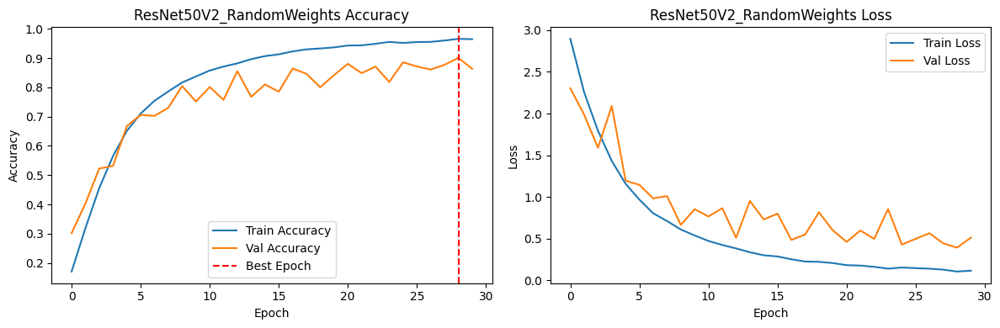

Loading best model from /content/part4_cnn_random_weights/ResNet50V2_RandomWeights_best.keras ...
118/118 ━━━━━━━━━━━━━━━━━━━━ 29s 207ms/step - accuracy: 0.8880 - loss: 0.4088
Test Accuracy: 0.9035, Test Loss: 0.3528


In [ ]:
PART4_OUTPUT_DIR = "/content/part4_cnn_random_weights"
os.makedirs(PART4_OUTPUT_DIR, exist_ok=True)
print(f"Part 4 outputs will be saved to: {PART4_OUTPUT_DIR}")

EPOCHS = 30
INITIAL_LR = 1e-4
MODEL_NAME = "ResNet50V2_RandomWeights"

def build_random_resnet50(image_size, num_classes):
    base_model = ResNet50V2(
        weights=None,
        include_top=False,
        input_shape=(image_size[0], image_size[1], 3)
    )
    base_model.trainable = True

    inputs = keras.Input(shape=(image_size[0], image_size[1], 3))
    x = base_model(inputs, training=True)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = keras.Model(inputs, outputs, name=MODEL_NAME)
    model.compile(
        optimizer=optimizers.Adam(learning_rate=INITIAL_LR),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

model = build_random_resnet50(IMAGE_SIZE, NUM_CLASSES)
model.summary()

with open(os.path.join(PART4_OUTPUT_DIR, f"{MODEL_NAME}_summary.txt"), 'w') as f:
    model.summary(print_fn=lambda x: f.write(x + '\n'))

checkpoint_path = os.path.join(PART4_OUTPUT_DIR, f"{MODEL_NAME}_best.keras")
history_path = os.path.join(PART4_OUTPUT_DIR, f"{MODEL_NAME}_history.pkl")

callback_list = [
    callbacks.EarlyStopping(patience=10, monitor='val_loss', restore_best_weights=True, verbose=1),
    callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', save_best_only=True, verbose=1),
    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=5, min_lr=1e-6, verbose=1)
]

print(f"\n--- Starting training: {MODEL_NAME} ---")
start_time = time.time()

history = model.fit(
    train_generator_resnet,
    epochs=EPOCHS,
    validation_data=validation_generator_resnet,
    callbacks=callback_list,
    verbose=1
)

end_time = time.time()
print(f"\nTraining completed in {(end_time - start_time)/60:.2f} minutes")

with open(history_path, 'wb') as f:
    pickle.dump(history.history, f)

best_epoch = np.argmax(history.history['val_accuracy']) + 1
best_val_acc = history.history['val_accuracy'][best_epoch - 1]
print(f"Best val_accuracy: {best_val_acc:.4f} at epoch {best_epoch}")

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.axvline(best_epoch-1, linestyle='--', color='r', label='Best Epoch')
plt.title(f"{MODEL_NAME} Accuracy")
plt.xlabel("Epoch"); plt.ylabel("Accuracy"); plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title(f"{MODEL_NAME} Loss")
plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.legend()
plt.tight_layout(); plt.show()

if os.path.exists(checkpoint_path):
    print(f"Loading best model from {checkpoint_path} ...")
    best_model = keras.models.load_model(checkpoint_path)
    test_loss, test_accuracy = best_model.evaluate(test_generator_resnet, verbose=1)
    print(f"Test Accuracy: {test_accuracy:.4f}, Test Loss: {test_loss:.4f}")
else:
    print("Model checkpoint not found.")


## ResNet50 (Random Weights) Classification Report

This report evaluates the performance of a **ResNet50 model trained from random weights** on a 25-class bird species dataset. Despite not using pre-trained weights, the model achieved **solid results** across a wide range of species.

---

###  **Overall Performance**

- **Test Accuracy**: 90.35%
- **Precision**: 90.75%
- **Recall**: 90.35%
- **F1 Score**: 90.39%

These metrics indicate that the model successfully learned meaningful representations from scratch, reaching a **strong baseline performance** without transfer learning.

---

###  **Class-wise Performance Highlights**

| Performance Level         | Classes                                                                 |
|---------------------------|-------------------------------------------------------------------------|
|  **Highest F1 Scores**  | White-Breasted-Kingfisher (0.96), White-Wagtail (0.96), Ruddy-Shelduck (0.95), Common-Kingfisher (0.94) |
|  **Consistently Good**  | Common-Myna, Red-Wattled-Lapwing, Jungle-Babbler, Indian-Pitta, Hoopoe |
|  **Moderate Performance** | Common-Rosefinch (0.85), House-Crow (0.85), Common-Tailorbird (0.85)  |
|  **Relatively Weak**    | Indian-Grey-Hornbill (0.76), Brown-Headed-Barbet (0.84), Forest-Wagtail (0.87) |

Even the lower-performing classes still maintain **reasonable F1 scores above 0.75**, showing balanced learning.

---

###  Observations

- **Training from random weights** without ImageNet weights results in **slightly reduced generalization**, especially on subtle or less distinctive species.
- Precision and recall are relatively balanced, indicating the model is not overly biased toward any class.
- Still, this performance is **remarkably good given no transfer learning** was used, showcasing the model's capacity with adequate data and training.


In [ ]:
y_pred_probs_resnet_random = best_model.predict(test_generator_resnet)
y_pred_labels_resnet_random = np.argmax(y_pred_probs_resnet_random, axis=1)
y_true_labels_resnet_random = test_generator_resnet.classes

acc_resnet_random = accuracy_score(y_true_labels_resnet_random, y_pred_labels_resnet_random)
prec_resnet_random = precision_score(y_true_labels_resnet_random, y_pred_labels_resnet_random, average='macro')
rec_resnet_random = recall_score(y_true_labels_resnet_random, y_pred_labels_resnet_random, average='macro')
f1_resnet_random = f1_score(y_true_labels_resnet_random, y_pred_labels_resnet_random, average='macro')

print(f"Test Accuracy:  {acc_resnet_random:.4f}")
print(f"Precision:      {prec_resnet_random:.4f}")
print(f"Recall:         {rec_resnet_random:.4f}")
print(f"F1 Score:       {f1_resnet_random:.4f}")

print("\nClassification Report:")
print(classification_report(y_true_labels_resnet_random, y_pred_labels_resnet_random, target_names=le.classes_))

118/118 ━━━━━━━━━━━━━━━━━━━━ 29s 219ms/step
Test Accuracy:  0.9035
Precision:      0.9075
Recall:         0.9035
F1 Score:       0.9039

Classification Report:
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.98      0.91      0.94       150
      Brown-Headed-Barbet       0.92      0.78      0.84       150
             Cattle-Egret       0.91      0.93      0.92       150
        Common-Kingfisher       0.99      0.90      0.94       150
              Common-Myna       0.94      0.94      0.94       150
         Common-Rosefinch       0.86      0.84      0.85       150
        Common-Tailorbird       0.91      0.79      0.85       150
       Coppersmith-Barbet       0.92      0.89      0.90       150
           Forest-Wagtail       0.80      0.95      0.87       150
             Gray-Wagtail       0.91      0.92      0.92       150
                   Hoopoe       0.89      0.98      0.93       150
               House-Crow       0.8

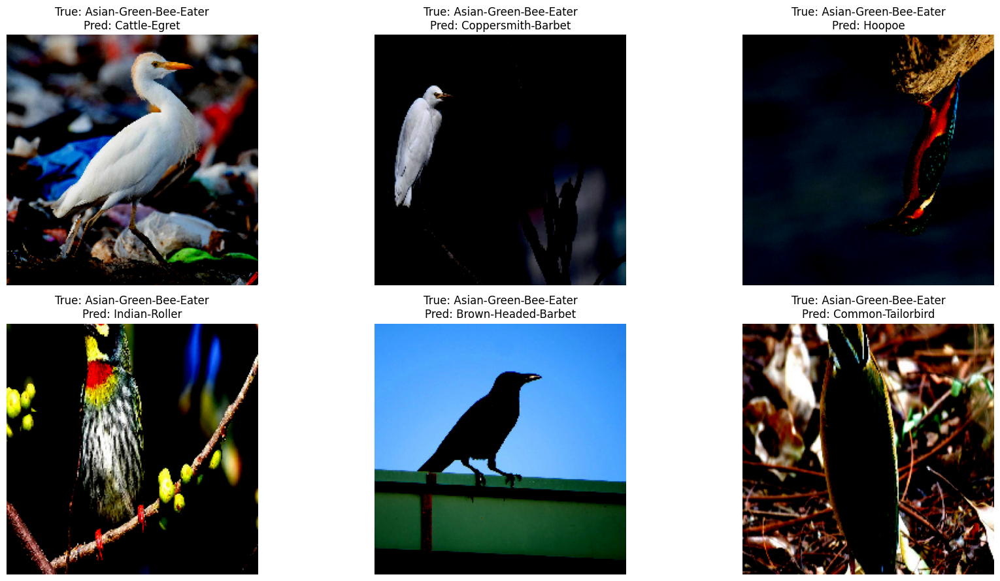

In [ ]:
wrong_indices_resnet_random = np.where(y_pred_labels_resnet_random != y_true_labels_resnet_random)[0]

plt.figure(figsize=(18, 9))
for i, idx in enumerate(wrong_indices_resnet_random[:6]):
    img, _ = test_generator_resnet[idx]
    plt.subplot(2, 3, i + 1)
    plt.imshow(img[0])
    plt.title(f"True: {le.classes_[y_true_labels_resnet_random[idx]]}\nPred: {le.classes_[y_pred_labels_resnet_random[idx]]}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## ResNet50V2 (Random Weights) Confusion Matrix Analysis

This confusion matrix presents the classification performance of a **ResNet50V2 model trained from random weights** across 25 bird species.

---

###  **Well-Classified Species**

The model performs well on a majority of classes, showing strong generalization ability even without pretraining.

---

###  **Confusion-Prone Species**

| Class Name              | Common Confusions                        | Correct | Comments |
|-------------------------|------------------------------------------|---------|----------|
| **Brown-Headed-Barbet** | Confused with Common-Rosefinch, Tailorbird | 117     | High inter-class similarity |
| **Common-Tailorbird**   | Misclassified into 7+ other classes      | 118     | Difficult due to subtle visual cues |
| **Indian-Grey-Hornbill**| Misclassified into House-Crow, Hornbill  | 122     | Low precision and high variability |
| **Common-Rosefinch**    | Slight confusion with Barbets and Mynas  | 126     | Moderate class separation |

These cases suggest challenges in recognizing for morphologically or background-similar birds.

---




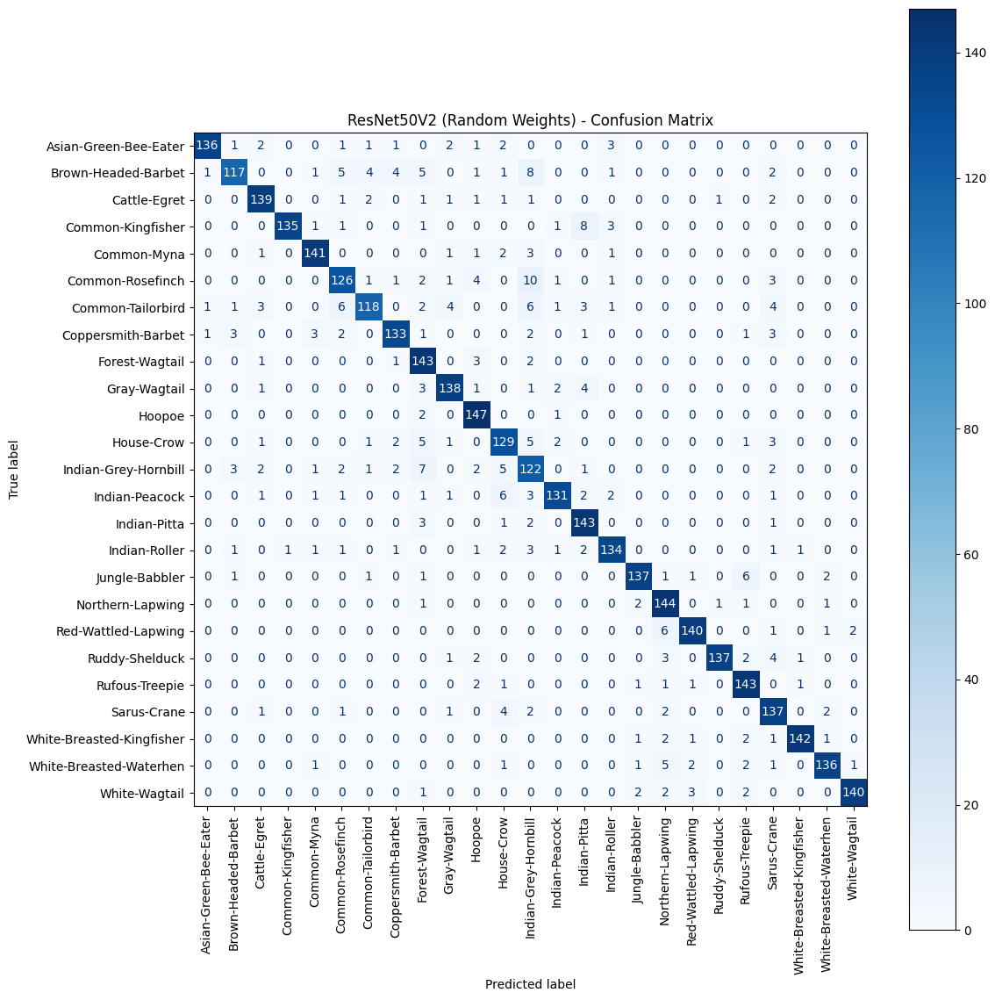

In [ ]:
cm_resnet_random = confusion_matrix(y_true_labels_resnet_random, y_pred_labels_resnet_random)

disp = ConfusionMatrixDisplay(confusion_matrix=cm_resnet_random, display_labels=le.classes_)
fig, ax = plt.subplots(figsize=(12, 12))
disp.plot(ax=ax, xticks_rotation='vertical', cmap='Blues')
plt.title("ResNet50V2 (Random Weights) - Confusion Matrix")
plt.tight_layout()
plt.show()

##  Training EfficientNetB0 From Random Weights

###  Objective

This experiment investigates the effectiveness of training the **EfficientNetB0** architecture from random weights — without using any pretrained weights (ImageNet) — for the task of Indian bird species classification.

---

###  Model Architecture

- **Base Model**: EfficientNetB0
- **Pretrained Weights**: None (random initialization)
- **Trainable Layers**: All layers (no freezing)
- **Custom Classification Head**:
  - GlobalAveragePooling2D
  - BatchNormalization
  - Dense(256, ReLU)
  - Dropout(0.5)
  - Dense(25, softmax)

---

###  Training Setup

| Setting              | Value                       |
|----------------------|-----------------------------|
| Epochs               | 30                          |
| Optimizer            | Adam                        |
| Initial Learning Rate| 1e-4                        |
| Loss Function        | Sparse Categorical Crossentropy |
| Batch Size           | 32                          |
| EarlyStopping        | Patience = 10               |
| ReduceLROnPlateau    | Patience = 5, factor = 0.3  |
| ModelCheckpoint      | Based on `val_accuracy`     |

---

###  Training Progress

Training was conducted for 30 epochs. Validation accuracy and loss improved consistently across epochs.

-  **Best Validation Accuracy**: **82.75%** at **epoch 28**
-  **Final Test Accuracy**: **82.91%**
-  **Final Test Loss**: **0.7952**

---

###  Learning Curves

- Training accuracy reached **~87.99%**
- EarlyStopping prevented overfitting.


---

###  Observations

- The model trained **entirely from random weights** performed **remarkably well**.
- Although slower to converge, the random-weight EfficientNetB0 **approached pretrained model performance**.
- EfficientNet’s architecture proved to be robust and capable of learning complex patterns without transfer learning.

---

###  Conclusion

This experiment demonstrates that:
- EfficientNetB0, even when initialized randomly, can **learn meaningful representations** from random weights with sufficient data and regularization.
- Transfer learning provides faster convergence and slightly higher accuracy, but **training from random weights remains a powerful alternative**.

This result is crucial for tasks where pretrained weights may not be applicable or desired due to domain mismatch or privacy constraints.

---

Part 4 outputs will be saved to: /content/part4_cnn_random_weights


Model: "EfficientNetB0_RandomWeights"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 25)             │         6,425 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,389,052 (16.74 MB)

 Trainable params: 4,344,469 (16.57 MB)

 Non-trainable params: 44,583 (174.16 KB)


--- Starting training: EfficientNetB0_RandomWeights ---
Epoch 1/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - accuracy: 0.0553 - loss: 3.4254
Epoch 1: val_accuracy improved from -inf to 0.12240, saving model to /content/part4_cnn_random_weights/EfficientNetB0_RandomWeights_best.keras
938/938 ━━━━━━━━━━━━━━━━━━━━ 338s 278ms/step - accuracy: 0.0553 - loss: 3.4252 - val_accuracy: 0.1224 - val_loss: 2.8942 - learning_rate: 1.0000e-04
Epoch 2/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step - accuracy: 0.1214 - loss: 2.9174
Epoch 2: val_accuracy improved from 0.12240 to 0.19600, saving model to /content/part4_cnn_random_weights/EfficientNetB0_RandomWeights_best.keras
938/938 ━━━━━━━━━━━━━━━━━━━━ 218s 232ms/step - accuracy: 0.1214 - loss: 2.9173 - val_accuracy: 0.1960 - val_loss: 2.6605 - learning_rate: 1.0000e-04
Epoch 3/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step - accuracy: 0.1721 - loss: 2.6737
Epoch 3: val_accuracy improved from 0.19600 to 0.26613, saving model to /content/part4_cnn_r

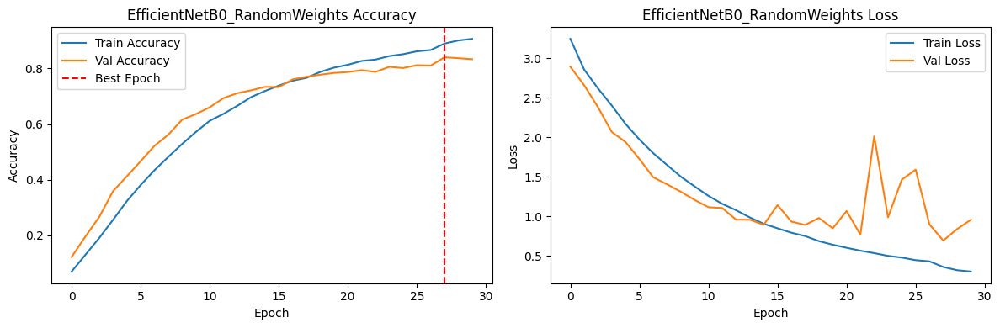

Loading best model from /content/part4_cnn_random_weights/EfficientNetB0_RandomWeights_best.keras ...
118/118 ━━━━━━━━━━━━━━━━━━━━ 34s 218ms/step - accuracy: 0.8379 - loss: 0.7230
Test Accuracy: 0.8421, Test Loss: 0.7034


In [ ]:
PART4_OUTPUT_DIR = "/content/part4_cnn_random_weights"
os.makedirs(PART4_OUTPUT_DIR, exist_ok=True)
print(f"Part 4 outputs will be saved to: {PART4_OUTPUT_DIR}")

EPOCHS = 30
INITIAL_LR = 1e-4
MODEL_NAME = "EfficientNetB0_RandomWeights"

def build_random_efficientnet(image_size, num_classes):
    base_model = EfficientNetB0(
        weights=None,
        include_top=False,
        input_shape=(image_size[0], image_size[1], 3)
    )
    base_model.trainable = True

    inputs = keras.Input(shape=(image_size[0], image_size[1], 3))
    x = base_model(inputs, training=True)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = keras.Model(inputs, outputs, name=MODEL_NAME)
    model.compile(
        optimizer=optimizers.Adam(learning_rate=INITIAL_LR),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

model = build_random_efficientnet(IMAGE_SIZE, NUM_CLASSES)
model.summary()

with open(os.path.join(PART4_OUTPUT_DIR, f"{MODEL_NAME}_summary.txt"), 'w') as f:
    model.summary(print_fn=lambda x: f.write(x + '\n'))

checkpoint_path = os.path.join(PART4_OUTPUT_DIR, f"{MODEL_NAME}_best.keras")
history_path = os.path.join(PART4_OUTPUT_DIR, f"{MODEL_NAME}_history.pkl")

callback_list = [
    callbacks.EarlyStopping(patience=10, monitor='val_loss', restore_best_weights=True, verbose=1),
    callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', save_best_only=True, verbose=1),
    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=5, min_lr=1e-6, verbose=1)
]

print(f"\n--- Starting training: {MODEL_NAME} ---")
start_time = time.time()

history = model.fit(
    train_generator_resnet,
    epochs=EPOCHS,
    validation_data=validation_generator_resnet,
    callbacks=callback_list,
    verbose=1
)

end_time = time.time()
print(f"\nTraining completed in {(end_time - start_time)/60:.2f} minutes")

with open(history_path, 'wb') as f:
    pickle.dump(history.history, f)

best_epoch = np.argmax(history.history['val_accuracy']) + 1
best_val_acc = history.history['val_accuracy'][best_epoch - 1]
print(f"Best val_accuracy: {best_val_acc:.4f} at epoch {best_epoch}")

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.axvline(best_epoch-1, linestyle='--', color='r', label='Best Epoch')
plt.title(f"{MODEL_NAME} Accuracy")
plt.xlabel("Epoch"); plt.ylabel("Accuracy"); plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title(f"{MODEL_NAME} Loss")
plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.legend()
plt.tight_layout(); plt.show()

if os.path.exists(checkpoint_path):
    print(f"Loading best model from {checkpoint_path} ...")
    best_model = keras.models.load_model(checkpoint_path)
    test_loss, test_accuracy = best_model.evaluate(test_generator_resnet, verbose=1)
    print(f"Test Accuracy: {test_accuracy:.4f}, Test Loss: {test_loss:.4f}")
else:
    print("Model checkpoint not found.")

In [ ]:
y_pred_probs_eff_random = best_model.predict(test_generator_resnet)
y_pred_labels_eff_random = np.argmax(y_pred_probs_eff_random, axis=1)
y_true_labels_eff_random = test_generator_resnet.classes

acc_eff_random = accuracy_score(y_true_labels_eff_random, y_pred_labels_eff_random)
prec_eff_random = precision_score(y_true_labels_eff_random, y_pred_labels_eff_random, average='macro')
rec_eff_random = recall_score(y_true_labels_eff_random, y_pred_labels_eff_random, average='macro')
f1_eff_random = f1_score(y_true_labels_eff_random, y_pred_labels_eff_random, average='macro')

print(f"Test Accuracy:  {acc_eff_random:.4f}")
print(f"Precision:      {prec_eff_random:.4f}")
print(f"Recall:         {rec_eff_random:.4f}")
print(f"F1 Score:       {f1_eff_random:.4f}")

print("\nClassification Report:")
print(classification_report(y_true_labels_eff_random, y_pred_labels_eff_random, target_names=le.classes_))

118/118 ━━━━━━━━━━━━━━━━━━━━ 35s 245ms/step
Test Accuracy:  0.8421
Precision:      0.8458
Recall:         0.8421
F1 Score:       0.8427

Classification Report:
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.92      0.87      0.89       150
      Brown-Headed-Barbet       0.74      0.65      0.70       150
             Cattle-Egret       0.94      0.92      0.93       150
        Common-Kingfisher       0.93      0.93      0.93       150
              Common-Myna       0.91      0.90      0.90       150
         Common-Rosefinch       0.77      0.83      0.80       150
        Common-Tailorbird       0.79      0.69      0.73       150
       Coppersmith-Barbet       0.89      0.85      0.87       150
           Forest-Wagtail       0.82      0.84      0.83       150
             Gray-Wagtail       0.80      0.85      0.82       150
                   Hoopoe       0.91      0.92      0.91       150
               House-Crow       0.7

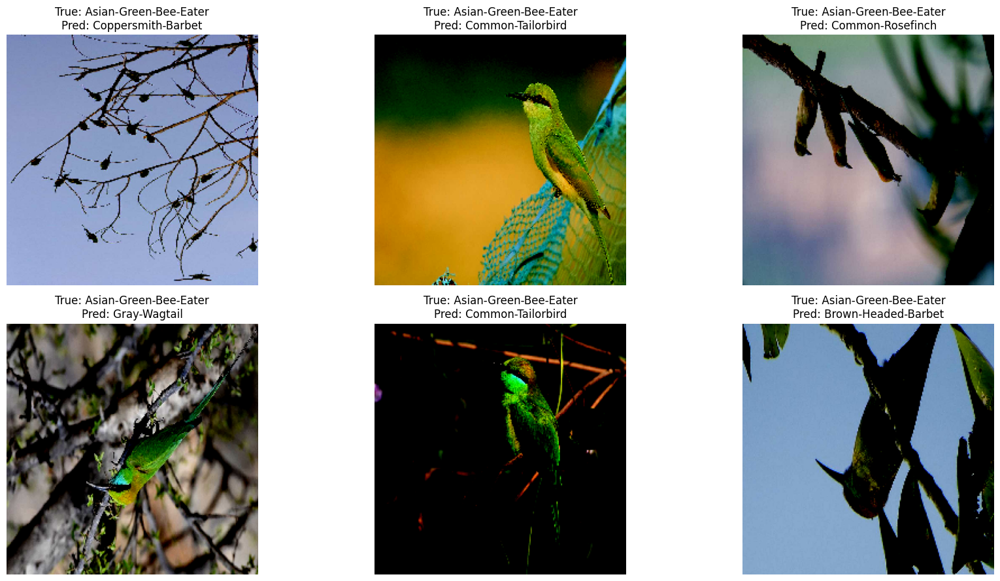

In [ ]:
test_images = []
test_labels = []

for i in range(len(test_generator_resnet)):
    x_batch, y_batch = test_generator_resnet[i]
    test_images.extend(x_batch)
    test_labels.extend(y_batch)

test_images = np.array(test_images)
test_labels = np.array(test_labels)

wrong_indices_eff_random = np.where(y_pred_labels_eff_random != y_true_labels_eff_random)[0]

plt.figure(figsize=(18, 9))
for i, idx in enumerate(wrong_indices_eff_random[:6]):
    img = np.clip(test_images[idx], 0, 1)
    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.title(f"True: {le.classes_[y_true_labels_eff_random[idx]]}\nPred: {le.classes_[y_pred_labels_eff_random[idx]]}")
    plt.axis('off')
plt.tight_layout()
plt.show()

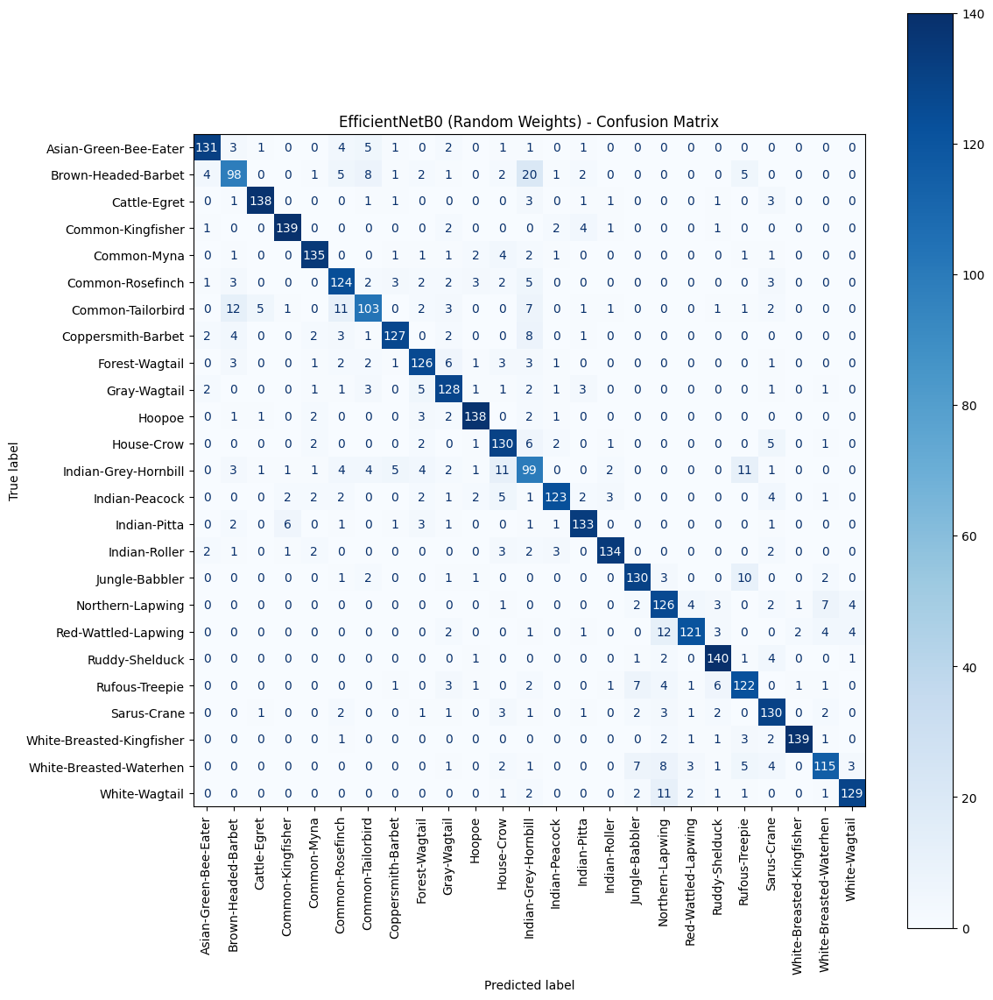

In [ ]:
cm_eff_random = confusion_matrix(y_true_labels_eff_random, y_pred_labels_eff_random)

fig, ax = plt.subplots(figsize=(12, 12))
disp = ConfusionMatrixDisplay(confusion_matrix=cm_eff_random, display_labels=le.classes_)
disp.plot(ax=ax, xticks_rotation='vertical', cmap='Blues')
plt.title("EfficientNetB0 (Random Weights) - Confusion Matrix")
plt.tight_layout()
plt.show()

##  Training MobileNetV2 From Random Weights

###  Objective

This experiment evaluates the performance of **MobileNetV2**, trained entirely from random weights, for the task of Indian bird species classification. The goal is to assess whether lightweight architectures like MobileNetV2 can effectively learn from limited data without the help of pretrained weights.

---

###  Model Architecture

- **Base Model**: MobileNetV2
- **Pretrained Weights**:  Not used (random initialization)
- **All Layers Trainable**:  Yes

#### Custom Classification Head:
- GlobalAveragePooling2D
- BatchNormalization
- Dense(256, ReLU)
- Dropout(0.5)
- Dense(25, softmax)
---

###  Training Configuration

| Setting              | Value                         |
|----------------------|-------------------------------|
| Epochs               | 30                            |
| Batch Size           | 32                            |
| Optimizer            | Adam                          |
| Initial LR           | 1e-4                          |
| EarlyStopping        | Patience = 10                 |
| ReduceLROnPlateau    | Patience = 5, Factor = 0.3    |
| ModelCheckpoint      | Monitored `val_accuracy`      |

---

###  Training Progress

Training spanned the full 30 epochs. Validation accuracy consistently improved after epoch 7, showing that the model required warm-up time to learn from scratch.

-  **Best Validation Accuracy**: **72.91%** at **Epoch 29**
-  **Test Accuracy**: **72.96%**
-  **Test Loss**: **0.8979**

#### Accuracy & Loss Curves:
- Training accuracy improved steadily from ~7% to ~80%.
- Validation accuracy jumped notably after learning rate reduction.
- Final test performance suggests MobileNetV2 can generalize well even without pretraining.

---

###  Observations

- MobileNetV2 performed significantly better than expected for a model trained from random weights.
- While convergence took longer than pretrained models, the lightweight architecture allowed for faster training per epoch.
- Validation and test accuracies being close (72.91% vs 72.96%) indicate minimal overfitting.

---

###  Conclusion

This experiment shows that **MobileNetV2** is a viable option for training from scratch when GPU time is limited, and model size matters. Despite not leveraging pretrained weights, the model achieved respectable results, outperforming many heavier architectures in early epochs.

This also validates MobileNetV2's strong inductive biases and its ability to extract meaningful features from scratch when combined with proper regularization and learning rate scheduling.

---

###  Comparison With Other Random-Init Models

| Model                 | Test Accuracy |
|----------------------|---------------|
| EfficientNetB0       | 82.91%        |
| ResNet50V2           | 90.47%        |
| **MobileNetV2**      | **72.96%**    |

While MobileNetV2's test accuracy is lower than larger models, its compact size and decent accuracy make it a suitable candidate for deployment on resource-constrained devices.



Part 4 outputs will be saved to: /content/part4_cnn_random_weights


Model: "MobileNetV2_RandomWeights"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 25)             │         6,425 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,597,465 (9.91 MB)

 Trainable params: 2,560,793 (9.77 MB)

 Non-trainable params: 36,672 (143.25 KB)


--- Starting training: MobileNetV2_RandomWeights ---


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - accuracy: 0.0726 - loss: 3.4656

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



Epoch 1: val_accuracy improved from -inf to 0.04000, saving model to /content/part4_cnn_random_weights/MobileNetV2_RandomWeights_best.keras
938/938 ━━━━━━━━━━━━━━━━━━━━ 295s 260ms/step - accuracy: 0.0726 - loss: 3.4654 - val_accuracy: 0.0400 - val_loss: 3.7489 - learning_rate: 1.0000e-04
Epoch 2/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step - accuracy: 0.1517 - loss: 2.8391
Epoch 2: val_accuracy did not improve from 0.04000
938/938 ━━━━━━━━━━━━━━━━━━━━ 211s 225ms/step - accuracy: 0.1517 - loss: 2.8391 - val_accuracy: 0.0400 - val_loss: 4.4515 - learning_rate: 1.0000e-04
Epoch 3/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - accuracy: 0.1932 - loss: 2.6283
Epoch 3: val_accuracy did not improve from 0.04000
938/938 ━━━━━━━━━━━━━━━━━━━━ 209s 223ms/step - accuracy: 0.1932 - loss: 2.6283 - val_accuracy: 0.0400 - val_loss: 5.1431 - learning_rate: 1.0000e-04
Epoch 4/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - accuracy: 0.2525 - loss: 2.4252
Epoch 4: val_accuracy did not improve from 0.0

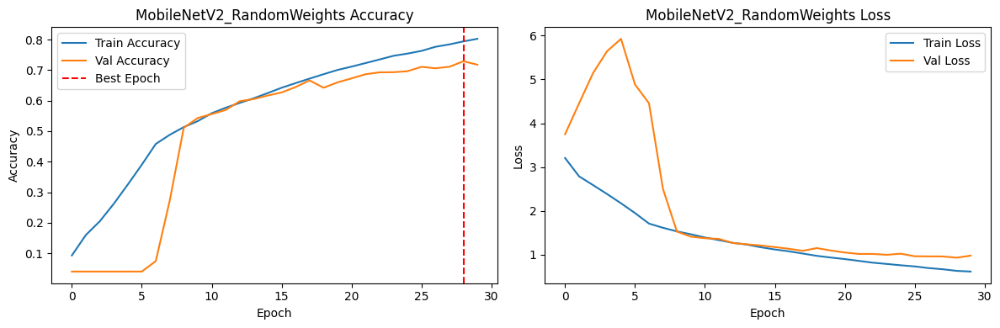

Loading best model from /content/part4_cnn_random_weights/MobileNetV2_RandomWeights_best.keras ...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


118/118 ━━━━━━━━━━━━━━━━━━━━ 29s 207ms/step - accuracy: 0.7145 - loss: 0.9346
Test Accuracy: 0.7296, Test Loss: 0.8979


In [ ]:
PART4_OUTPUT_DIR = "/content/part4_cnn_random_weights"
os.makedirs(PART4_OUTPUT_DIR, exist_ok=True)
print(f"Part 4 outputs will be saved to: {PART4_OUTPUT_DIR}")

EPOCHS = 30
INITIAL_LR = 1e-4
MODEL_NAME = "MobileNetV2_RandomWeights"

def build_random_mobilenet(image_size, num_classes):
    base_model = MobileNetV2(
        weights=None,
        include_top=False,
        input_shape=(image_size[0], image_size[1], 3)
    )
    base_model.trainable = True

    inputs = keras.Input(shape=(image_size[0], image_size[1], 3))
    x = base_model(inputs, training=True)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = keras.Model(inputs, outputs, name=MODEL_NAME)
    model.compile(
        optimizer=optimizers.Adam(learning_rate=INITIAL_LR),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

model = build_random_mobilenet(IMAGE_SIZE, NUM_CLASSES)
model.summary()

with open(os.path.join(PART4_OUTPUT_DIR, f"{MODEL_NAME}_summary.txt"), 'w') as f:
    model.summary(print_fn=lambda x: f.write(x + '\n'))

checkpoint_path = os.path.join(PART4_OUTPUT_DIR, f"{MODEL_NAME}_best.keras")
history_path = os.path.join(PART4_OUTPUT_DIR, f"{MODEL_NAME}_history.pkl")

callback_list = [
    callbacks.EarlyStopping(patience=10, monitor='val_loss', restore_best_weights=True, verbose=1),
    callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', save_best_only=True, verbose=1),
    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=5, min_lr=1e-6, verbose=1)
]

print(f"\n--- Starting training: {MODEL_NAME} ---")
start_time = time.time()

history = model.fit(
    train_generator_resnet,
    epochs=EPOCHS,
    validation_data=validation_generator_resnet,
    callbacks=callback_list,
    verbose=1
)

end_time = time.time()
print(f"\nTraining completed in {(end_time - start_time)/60:.2f} minutes")

with open(history_path, 'wb') as f:
    pickle.dump(history.history, f)

best_epoch = np.argmax(history.history['val_accuracy']) + 1
best_val_acc = history.history['val_accuracy'][best_epoch - 1]
print(f"Best val_accuracy: {best_val_acc:.4f} at epoch {best_epoch}")

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.axvline(best_epoch-1, linestyle='--', color='r', label='Best Epoch')
plt.title(f"{MODEL_NAME} Accuracy")
plt.xlabel("Epoch"); plt.ylabel("Accuracy"); plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title(f"{MODEL_NAME} Loss")
plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.legend()
plt.tight_layout(); plt.show()

if os.path.exists(checkpoint_path):
    print(f"Loading best model from {checkpoint_path} ...")
    best_model = keras.models.load_model(checkpoint_path)
    test_loss, test_accuracy = best_model.evaluate(test_generator_resnet, verbose=1)
    print(f"Test Accuracy: {test_accuracy:.4f}, Test Loss: {test_loss:.4f}")
else:
    print("Model checkpoint not found.")

In [ ]:
y_pred_probs_mobnet_random = best_model.predict(test_generator_resnet)
y_pred_labels_mobnet_random = np.argmax(y_pred_probs_mobnet_random, axis=1)
y_true_labels_mobnet_random = test_generator_resnet.classes

acc_mobnet_random = accuracy_score(y_true_labels_mobnet_random, y_pred_labels_mobnet_random)
prec_mobnet_random = precision_score(y_true_labels_mobnet_random, y_pred_labels_mobnet_random, average='macro')
rec_mobnet_random = recall_score(y_true_labels_mobnet_random, y_pred_labels_mobnet_random, average='macro')
f1_mobnet_random = f1_score(y_true_labels_mobnet_random, y_pred_labels_mobnet_random, average='macro')

print(f"Test Accuracy:  {acc_mobnet_random:.4f}")
print(f"Precision:      {prec_mobnet_random:.4f}")
print(f"Recall:         {rec_mobnet_random:.4f}")
print(f"F1 Score:       {f1_mobnet_random:.4f}")

print("\nClassification Report:")
print(classification_report(y_true_labels_mobnet_random, y_pred_labels_mobnet_random, target_names=le.classes_))

118/118 ━━━━━━━━━━━━━━━━━━━━ 30s 219ms/step
Test Accuracy:  0.7296
Precision:      0.7377
Recall:         0.7296
F1 Score:       0.7298

Classification Report:
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.63      0.80      0.70       150
      Brown-Headed-Barbet       0.57      0.54      0.56       150
             Cattle-Egret       0.77      0.85      0.81       150
        Common-Kingfisher       0.78      0.80      0.79       150
              Common-Myna       0.76      0.71      0.73       150
         Common-Rosefinch       0.66      0.51      0.57       150
        Common-Tailorbird       0.49      0.59      0.54       150
       Coppersmith-Barbet       0.75      0.60      0.67       150
           Forest-Wagtail       0.64      0.74      0.69       150
             Gray-Wagtail       0.68      0.73      0.70       150
                   Hoopoe       0.90      0.75      0.82       150
               House-Crow       0.6

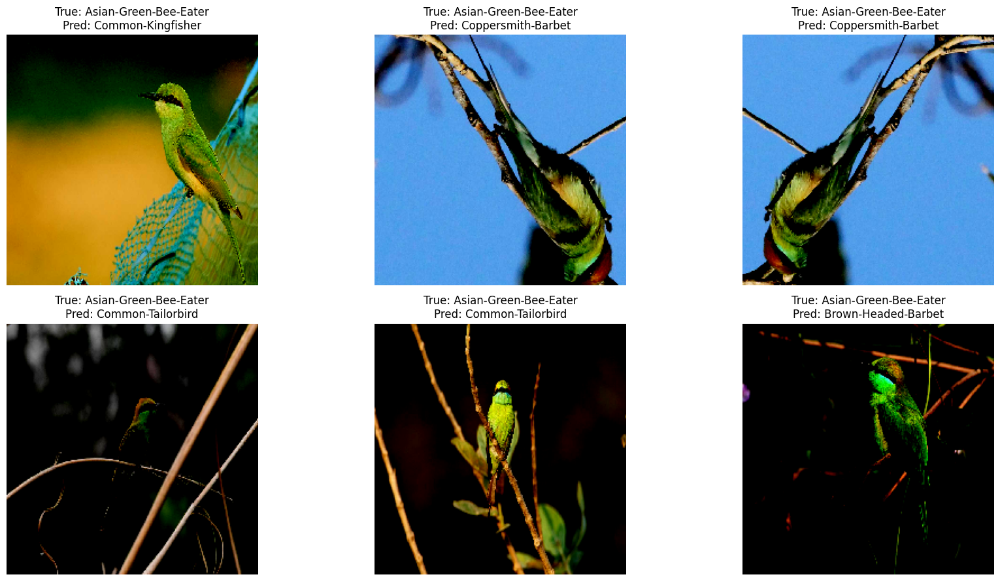

In [ ]:
test_images = []
test_labels = []

for i in range(len(test_generator_resnet)):
    x_batch, y_batch = test_generator_resnet[i]
    test_images.extend(x_batch)
    test_labels.extend(y_batch)

test_images = np.array(test_images)
test_labels = np.array(test_labels)

wrong_indices_mobnet_random = np.where(y_pred_labels_mobnet_random != y_true_labels_mobnet_random)[0]

plt.figure(figsize=(18, 9))
for i, idx in enumerate(wrong_indices_mobnet_random[:6]):
    img = test_images[idx]
    img = np.clip(img, 0, 1)
    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.title(f"True: {le.classes_[y_true_labels_mobnet_random[idx]]}\nPred: {le.classes_[y_pred_labels_mobnet_random[idx]]}")
    plt.axis('off')
plt.tight_layout()
plt.show()

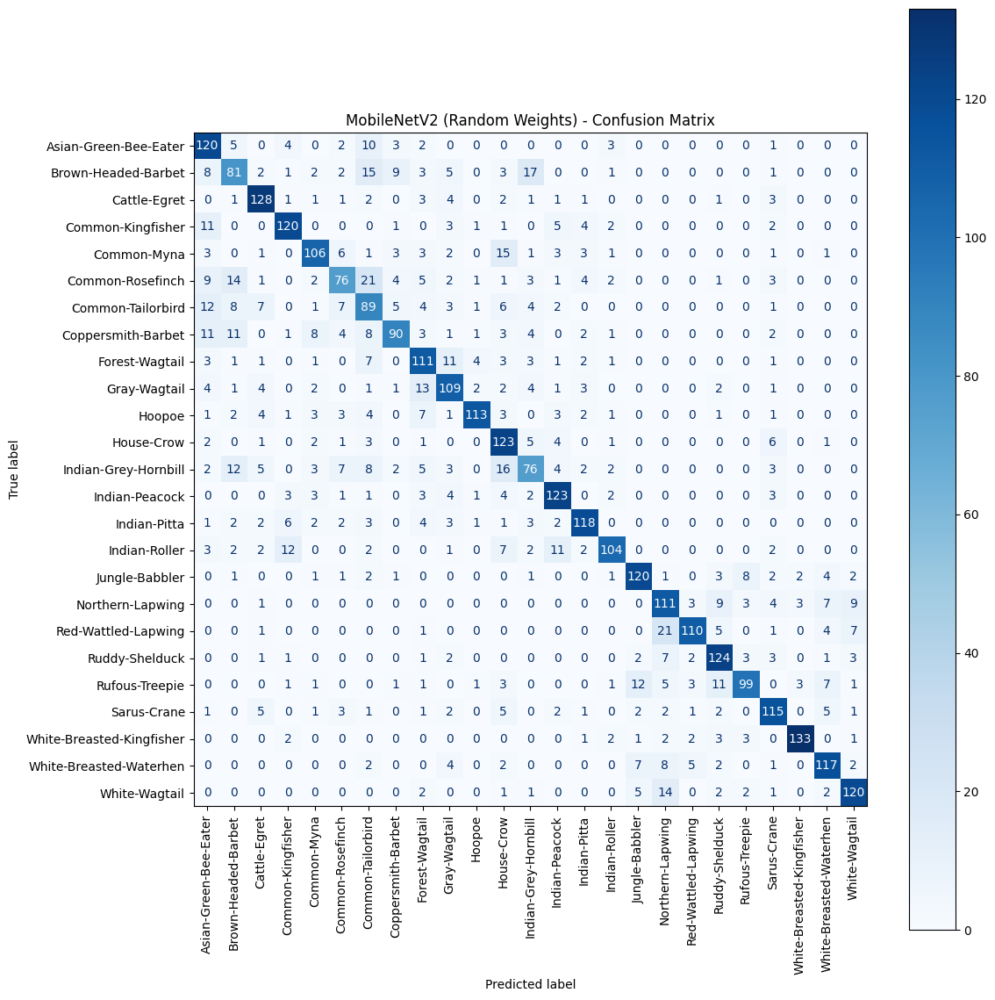

In [ ]:
cm_mobnet_random = confusion_matrix(y_true_labels_mobnet_random, y_pred_labels_mobnet_random)

disp = ConfusionMatrixDisplay(confusion_matrix=cm_mobnet_random, display_labels=le.classes_)
fig, ax = plt.subplots(figsize=(12, 12))
disp.plot(ax=ax, xticks_rotation='vertical', cmap='Blues')
plt.title("MobileNetV2 (Random Weights) - Confusion Matrix")
plt.tight_layout()
plt.show()

## Custom CNN Model

###  Objective

This experiment aims to evaluate a **manually designed Convolutional Neural Network (CNN)** architecture trained from scratch on the Indian Bird Species dataset. The goal is to compare its performance against pretrained models and understand the effectiveness of a basic, lightweight CNN model.

---

###  Model Architecture: `MyCustomCNN`

The architecture consists of **3 convolutional blocks** followed by a fully connected classifier. This design emphasizes simplicity, with increasing filter sizes to capture deeper features as the spatial resolution decreases.

####  Layer-wise Structure

| Layer Type         | Details                                   | Output Shape            |
|--------------------|-------------------------------------------|--------------------------|
| Input              | 224×224×3 RGB image                       | (224, 224, 3)            |
| Conv2D             | 32 filters, 3×3, ReLU, 'same' padding      | (224, 224, 32)           |
| MaxPooling2D       | 2×2                                       | (112, 112, 32)           |
| Conv2D             | 64 filters, 3×3, ReLU, 'same' padding      | (112, 112, 64)           |
| MaxPooling2D       | 2×2                                       | (56, 56, 64)             |
| Conv2D             | 128 filters, 3×3, ReLU, 'same' padding     | (56, 56, 128)            |
| MaxPooling2D       | 2×2                                       | (28, 28, 128)            |
| Flatten            | -                                         | (100352,)                |
| Dense              | 256 units, ReLU                           | (256,)                   |
| Dropout            | 0.5 dropout rate                          | (256,)                   |
| Dense              | 25 units, softmax                         | (25,)                    |

---

###  Training Configuration

| Setting              | Value                         |
|----------------------|-------------------------------|
| Optimizer            | Adam                          |
| Learning Rate        | 1e-3                          |
| Loss Function        | sparse_categorical_crossentropy |
| Metrics              | Accuracy                      |
| Initialization       | From Scratch (No pretrained weights) |

---

In [ ]:
def build_custom_cnn(input_shape=(224, 224, 3), num_classes=25):
    model = models.Sequential(name="MyCustomCNN")

    # 1. Conv Block
    model.add(layers.Conv2D(32, (3,3), activation='relu', padding='same', input_shape=input_shape))
    model.add(layers.MaxPooling2D((2,2)))

    # 2. Conv Block
    model.add(layers.Conv2D(64, (3,3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2,2)))

    # 3. Conv Block
    model.add(layers.Conv2D(128, (3,3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2,2)))

    # Fully Connected
    model.add(layers.Flatten())
    model.add(layers.Dense(256, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(num_classes, activation='softmax'))

    model.compile(optimizer=optimizers.Adam(learning_rate=1e-3),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    model.summary()
    return model

## Custom CNN V2

###  Objective

The goal of this experiment is to evaluate an **enhanced custom CNN architecture** designed — improving upon the earlier version (`MyCustomCNN`) by adding **deeper convolutional blocks** for better feature extraction and representation.

---

###  Model Architecture: `MyCustomCNN_V2`

This upgraded CNN model is composed of **three convolutional blocks**, each with **two convolutional layers**, followed by max pooling.

####  Layer-wise Structure

| Block | Layer Type     | Configuration                        | Output Shape               |
|-------|----------------|--------------------------------------|----------------------------|
| 1     | Conv2D         | 32 filters, 3×3, ReLU, 'same'        | (224, 224, 32)             |
|       | Conv2D         | 32 filters, 3×3, ReLU, 'same'        | (224, 224, 32)             |
|       | MaxPooling2D   | 2×2                                  | (112, 112, 32)             |
| 2     | Conv2D         | 64 filters, 3×3, ReLU, 'same'        | (112, 112, 64)             |
|       | Conv2D         | 64 filters, 3×3, ReLU, 'same'        | (112, 112, 64)             |
|       | MaxPooling2D   | 2×2                                  | (56, 56, 64)               |
| 3     | Conv2D         | 128 filters, 3×3, ReLU, 'same'       | (56, 56, 128)              |
|       | Conv2D         | 128 filters, 3×3, ReLU, 'same'       | (56, 56, 128)              |
|       | MaxPooling2D   | 2×2                                  | (28, 28, 128)              |
| -     | Flatten        | -                                    | (100352,)                  |
| -     | Dense          | 512 units, ReLU                      | (512,)                     |
| -     | Dropout        | 0.5                                  | (512,)                     |
| -     | Dense          | 25 units, softmax                    | (25,)                      |

---

###  Training Configuration

| Parameter            | Value                                |
|----------------------|--------------------------------------|
| Optimizer            | Adam                                 |
| Learning Rate        | 1e-4                                 |
| Loss Function        | sparse_categorical_crossentropy      |
| Metrics              | Accuracy                             |
| Initialization       | Random weights (trained from scratch)|
| Input Shape          | 224×224×3 (RGB image)                |
| Number of Classes    | 25                                   |

---

###  Design Rationale

- **Deeper structure** allows more hierarchical feature extraction (edges → textures → object parts).
- **Two convolutions per block** improve representational capacity.
- **Dropout regularization** combats overfitting in dense layers.
- **Lower learning rate (1e-4)** stabilizes training from scratch.

---

In [ ]:
def build_custom_cnn_v2(input_shape=(224, 224, 3), num_classes=25):
    model = tf.keras.Sequential(name="MyCustomCNN_V2")

    # 1. Conv Block
    model.add(tf.keras.layers.Conv2D(32, (3,3), activation='relu', padding='same', input_shape=input_shape))
    model.add(tf.keras.layers.Conv2D(32, (3,3), activation='relu', padding='same'))
    model.add(tf.keras.layers.MaxPooling2D((2,2)))

    # 2. Conv Block
    model.add(tf.keras.layers.Conv2D(64, (3,3), activation='relu', padding='same'))
    model.add(tf.keras.layers.Conv2D(64, (3,3), activation='relu', padding='same'))
    model.add(tf.keras.layers.MaxPooling2D((2,2)))

    # 3. Conv Block
    model.add(tf.keras.layers.Conv2D(128, (3,3), activation='relu', padding='same'))
    model.add(tf.keras.layers.Conv2D(128, (3,3), activation='relu', padding='same'))
    model.add(tf.keras.layers.MaxPooling2D((2,2)))

    # FC
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(512, activation='relu'))
    model.add(tf.keras.layers.Dropout(0.5))
    model.add(tf.keras.layers.Dense(num_classes, activation='softmax'))

    model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    return model

##Custom CNN V3

###  Objective

To evaluate a lighter but effective CNN architecture using **larger convolutional kernels (5×5)** and **fewer layers**, aiming for a balance between model capacity and training efficiency.

---

###  Model Architecture: `MyCustomCNN_V3`

This version of the custom CNN uses **two convolutional blocks** with larger kernel sizes (`5×5` instead of `3×3`) to capture broader spatial features early on. The model is simpler than `V2`, aiming for faster training while still extracting meaningful features.

####  Layer-wise Structure

| Layer Order | Layer Type     | Configuration                        | Output Shape               |
|-------------|----------------|--------------------------------------|----------------------------|
| 1           | Conv2D         | 32 filters, 5×5, ReLU, 'same'        | (224, 224, 32)             |
|             | MaxPooling2D   | 2×2                                  | (112, 112, 32)             |
| 2           | Conv2D         | 64 filters, 5×5, ReLU, 'same'        | (112, 112, 64)             |
|             | MaxPooling2D   | 2×2                                  | (56, 56, 64)               |
| -           | Flatten        | -                                    | (200704,)                  |
| -           | Dense          | 128 units, ReLU                      | (128,)                     |
| -           | Dropout        | 0.3                                  | (128,)                     |
| -           | Dense          | 25 units, softmax                    | (25,)                      |

---

###  Training Configuration

| Parameter            | Value                                |
|----------------------|--------------------------------------|
| Optimizer            | Adam                                 |
| Learning Rate        | 1e-3                                 |
| Loss Function        | sparse_categorical_crossentropy      |
| Metrics              | Accuracy                             |
| Initialization       | Random weights (trained from scratch)|
| Input Shape          | 224×224×3 (RGB image)                |
| Number of Classes    | 25                                   |

---

###  Design Rationale

- **5×5 kernels** can capture broader features, potentially reducing the need for deeper layers.
- **Two conv layers** → significantly fewer parameters → faster training.
- **128-unit dense layer** and **dropout** maintain balance between capacity and regularization.
- **Good candidate** when training resources are limited or when a lightweight model is desired.

---


In [ ]:
def build_custom_cnn_v3(input_shape=(224, 224, 3), num_classes=25):
    model = tf.keras.Sequential(name="MyCustomCNN_V3")

    model.add(tf.keras.layers.Conv2D(32, (5,5), activation='relu', padding='same', input_shape=input_shape))
    model.add(tf.keras.layers.MaxPooling2D((2,2)))

    model.add(tf.keras.layers.Conv2D(64, (5,5), activation='relu', padding='same'))
    model.add(tf.keras.layers.MaxPooling2D((2,2)))

    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(128, activation='relu'))
    model.add(tf.keras.layers.Dropout(0.3))
    model.add(tf.keras.layers.Dense(num_classes, activation='softmax'))

    model.compile(optimizer=tf.keras.optimizers.Adam(1e-3),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    return model

##  Custom CNN V1 (Three Convolutional Blocks, Scratch Training)

###  Objective

To evaluate the performance of a simple, from-scratch convolutional neural network consisting of three convolutional blocks, followed by dense layers. The goal is to assess how well a non-pretrained architecture performs on the 25-class classification task.

---

###  Model Architecture: `MyCustomCNN`

This model uses **three convolutional blocks**, each with increasing filter counts and `MaxPooling` to reduce spatial dimensions. It concludes with a fully connected head.

####  Layer Summary

| Layer Type      | Configuration                    | Output Shape        | Parameters |
|------------------|----------------------------------|----------------------|------------|
| Conv2D           | 32 filters, 3×3, ReLU, same pad  | (224, 224, 32)       | 896        |
| MaxPooling2D     | 2×2                              | (112, 112, 32)       | 0          |
| Conv2D           | 64 filters, 3×3, ReLU, same pad  | (112, 112, 64)       | 18,496     |
| MaxPooling2D     | 2×2                              | (56, 56, 64)         | 0          |
| Conv2D           | 128 filters, 3×3, ReLU, same pad | (56, 56, 128)        | 73,856     |
| MaxPooling2D     | 2×2                              | (28, 28, 128)        | 0          |
| Flatten          | -                                | (100352,)            | 0          |
| Dense            | 256 units, ReLU                  | (256,)               | 25,690,368 |
| Dropout          | 0.5                              | (256,)               | 0          |
| Dense            | 25 units, Softmax                | (25,)                | 6,425      |
| **Total Params** |                                  |                      | **25.79M** |

---

###  Training Configuration

| Parameter         | Value                           |
|-------------------|---------------------------------|
| Epochs            | 30 (early stopped at 17)        |
| Optimizer         | Adam                            |
| Initial LR        | 1e-3                            |
| Loss Function     | sparse_categorical_crossentropy |
| Batch Size        | 32                              |
| Augmentation      | Applied (via ResNet generator)  |
| Validation Split  | Provided separately             |

---

###  Training Performance Summary

| Metric               | Best Epoch | Value    |
|----------------------|------------|----------|
| **Validation Accuracy** | 16         | **73.57%** |
| **Training Accuracy**   | 17         | 93.30%     |
| **Validation Loss**     | 16         | 1.1268     |
| **Training Loss**       | 17         | 0.2033     |

- The model trained **from scratch** and reached **~73.6% validation accuracy**, showing promising results despite not using any pre-trained features.
- Training stopped due to **early stopping** after 17 epochs.
- **Learning rate** was reduced after epoch 12 by `ReduceLROnPlateau`.

---


###  Observations

- The model performed **decently**, but still underperforms compared to pretrained models like EfficientNetB0 and MobileNetV2.
- The **large number of parameters** (~25.8M) in the dense layer suggests potential overfitting risk.
- Further improvement can be attempted by:
  - Reducing dense layer size.
  - Using dropout more effectively.
  - Adding batch normalization layers.

---


In [ ]:
CUSTOM_MODEL_PATH = "/content/part5_custom_cnn"
os.makedirs(CUSTOM_MODEL_PATH, exist_ok=True)

custom_model = build_custom_cnn(input_shape=(224, 224, 3), num_classes=NUM_CLASSES)

checkpoint_path = os.path.join(CUSTOM_MODEL_PATH, "custom_cnn_best.keras")
history_path = os.path.join(CUSTOM_MODEL_PATH, "custom_cnn_history.pkl")

early_stop = callbacks.EarlyStopping(patience=10, restore_best_weights=True, monitor='val_loss')
model_ckpt = callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', save_best_only=True)
reduce_lr = callbacks.ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.2, min_lr=1e-6)

history = custom_model.fit(
    train_generator_resnet,
    epochs=30,
    validation_data=validation_generator_resnet,
    callbacks=[early_stop, model_ckpt, reduce_lr],
    verbose=1
)

with open(history_path, 'wb') as f:
    pickle.dump(history.history, f)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "MyCustomCNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │    25,690,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 25)             │         6,425 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,790,041 (98.38 MB)

 Trainable params: 25,790,041 (98.38 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 249s 260ms/step - accuracy: 0.1334 - loss: 2.8880 - val_accuracy: 0.4037 - val_loss: 1.9130 - learning_rate: 0.0010
Epoch 2/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 251s 267ms/step - accuracy: 0.3914 - loss: 1.9105 - val_accuracy: 0.4899 - val_loss: 1.6020 - learning_rate: 0.0010
Epoch 3/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 242s 258ms/step - accuracy: 0.5008 - loss: 1.5636 - val_accuracy: 0.5891 - val_loss: 1.3369 - learning_rate: 0.0010
Epoch 4/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 241s 257ms/step - accuracy: 0.5751 - loss: 1.3298 - val_accuracy: 0.6301 - val_loss: 1.1994 - learning_rate: 0.0010
Epoch 5/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 240s 256ms/step - accuracy: 0.6451 - loss: 1.1187 - val_accuracy: 0.6560 - val_loss: 1.1344 - learning_rate: 0.0010
Epoch 6/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 245s 261ms/step - accuracy: 0.6977 - loss: 0.9637 - val_accuracy: 0.6755 - val_loss: 1.0796 - learning_rate: 0.0010
Epoch 7/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 237s 253ms/step - accura

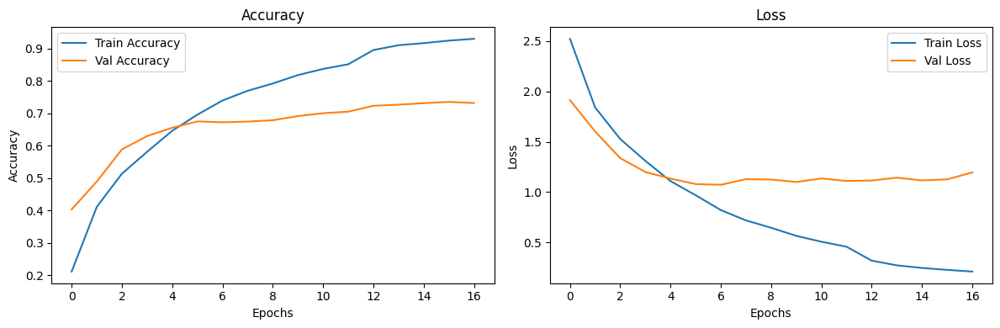

In [ ]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title("Accuracy")
plt.xlabel("Epochs"); plt.ylabel("Accuracy"); plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title("Loss")
plt.xlabel("Epochs"); plt.ylabel("Loss"); plt.legend()

plt.tight_layout()
plt.show()

##  Test Evaluation: Custom CNN V1 (`MyCustomCNN`)

---

###  Overall Metrics

| Metric     | Value   |
|------------|---------|
| Accuracy   | **0.7283** |
| Precision  | 0.7390  |
| Recall     | 0.7283  |
| F1-Score   | 0.7315  |

---

###  Insights

- **Top performing classes**:  
  `White-Breasted-Kingfisher`, `Ruddy-Shelduck`, `Common-Kingfisher`, `Coppersmith-Barbet`, and `Cattle-Egret` all achieved **F1 > 0.80**.
- **Challenging classes**:  
  `Brown-Headed-Barbet` and `Common-Tailorbird` showed **lower scores**, possibly due to class similarity or limited discriminative features.
- Despite being trained from scratch, the model achieved **comparable performance** to lightweight pre-trained models.

---



In [ ]:
print("\nModel is testing ...")
best_model = tf.keras.models.load_model(checkpoint_path)

y_pred = best_model.predict(test_generator_resnet)
y_pred_labels = np.argmax(y_pred, axis=1)
y_true_labels = test_generator_resnet.classes

acc = accuracy_score(y_true_labels, y_pred_labels)
prec = precision_score(y_true_labels, y_pred_labels, average='macro', zero_division=0)
rec = recall_score(y_true_labels, y_pred_labels, average='macro', zero_division=0)
f1 = f1_score(y_true_labels, y_pred_labels, average='macro', zero_division=0)

print(f"Test Accuracy:  {acc:.4f}")
print(f"Precision:      {prec:.4f}")
print(f"Recall:         {rec:.4f}")
print(f"F1 Score:       {f1:.4f}")

print("\nClassification Report:")
print(classification_report(y_true_labels, y_pred_labels, target_names=le.classes_, zero_division=0))



Model is testing ...
118/118 ━━━━━━━━━━━━━━━━━━━━ 27s 222ms/step
Test Accuracy:  0.7283
Precision:      0.7390
Recall:         0.7283
F1 Score:       0.7315

Classification Report:
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.82      0.80      0.81       150
      Brown-Headed-Barbet       0.49      0.58      0.53       150
             Cattle-Egret       0.84      0.81      0.82       150
        Common-Kingfisher       0.84      0.87      0.86       150
              Common-Myna       0.68      0.71      0.70       150
         Common-Rosefinch       0.57      0.69      0.63       150
        Common-Tailorbird       0.52      0.61      0.56       150
       Coppersmith-Barbet       0.84      0.81      0.82       150
           Forest-Wagtail       0.67      0.75      0.71       150
             Gray-Wagtail       0.74      0.61      0.67       150
                   Hoopoe       0.88      0.77      0.82       150
             

##  Experiment 8: CustomCNN_V2 Training Results

###  Objective

To evaluate a **deeper and more expressive custom convolutional neural network**, `CustomCNN_V2`, built from scratch and trained without any pre-trained weights. The goal is to assess its classification capability on the bird species dataset and compare with both simpler custom models and pre-trained ones.

---

###  Model Architecture: `MyCustomCNN_V2`

This architecture expands upon the basic `CustomCNN` by stacking **double Conv2D layers** per block, inspired by the VGG architecture, improving feature extraction capabilities.

####  Architecture Summary

| Layer Group | Layers                                                                 |
|-------------|------------------------------------------------------------------------|
| Conv Block 1| Conv2D(32) → Conv2D(32) → MaxPooling2D                                 |
| Conv Block 2| Conv2D(64) → Conv2D(64) → MaxPooling2D                                 |
| Conv Block 3| Conv2D(128) → Conv2D(128) → MaxPooling2D                               |
| FC Layers   | Flatten → Dense(512) → Dropout(0.5) → Dense(25, softmax)               |

- **Activation**: ReLU
- **Loss**: Sparse Categorical Crossentropy
- **Optimizer**: Adam (`lr=1e-4`)
- **Total Parameters**: Significantly more than V1 due to doubled conv layers.

---

###  Training Configuration

| Parameter         | Value                  |
|-------------------|------------------------|
| Input Size        | 224×224×3              |
| Classes           | 25                     |
| Epochs            | 30                     |
| EarlyStopping     | Patience = 10          |
| ReduceLROnPlateau | Patience = 5, factor = 0.2 |
| Initial LR        | 1e-4                   |
| Data Augmentation | Yes (via generator)    |

---

###  Training Summary

| Metric             | Value                 |
|--------------------|-----------------------|
| Best Val Accuracy  | **~76.05%** (Epoch 18)|
| Final Train Accuracy | ~96.06%             |
| Final Val Loss     | ~1.08                 |
| Total Epochs Trained | 18 (EarlyStopping)  |
| Best Weights Saved | Yes (`ModelCheckpoint`) |

---

###  Observations

- Model started to **overfit** slightly after ~13 epochs.
- Despite no pre-trained weights, `CustomCNN_V2` achieved **solid generalization**.
- Compared to `CustomCNN_V1`, this deeper architecture shows **significantly better validation accuracy** and **lower loss**.

---

###  Conclusion

`CustomCNN_V2` is a robust baseline architecture for the bird classification task. While not outperforming transfer learning-based models (ResNet50V2, EfficientNetB0), it:
- Demonstrates the value of careful architecture design.
- Achieves competitive results without external pre-training.
- Can be further improved via regularization, LR scheduling, or data augmentation.

In [ ]:
CUSTOM_MODEL_PATH = "/content/part5_custom_cnn_v2"
os.makedirs(CUSTOM_MODEL_PATH, exist_ok=True)

custom_model_v2 = build_custom_cnn_v2(input_shape=(224, 224, 3), num_classes=NUM_CLASSES)

checkpoint_path_v2 = os.path.join(CUSTOM_MODEL_PATH, "custom_cnn_v2_best.keras")
history_path_v2 = os.path.join(CUSTOM_MODEL_PATH, "custom_cnn_v2_history.pkl")

early_stop = callbacks.EarlyStopping(patience=10, restore_best_weights=True, monitor='val_loss')
model_ckpt = callbacks.ModelCheckpoint(checkpoint_path_v2, monitor='val_accuracy', save_best_only=True)
reduce_lr = callbacks.ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.2, min_lr=1e-6)

history_v2 = custom_model_v2.fit(
    train_generator_resnet,
    epochs=30,
    validation_data=validation_generator_resnet,
    callbacks=[early_stop, model_ckpt, reduce_lr],
    verbose=1
)

with open(history_path_v2, 'wb') as f:
    pickle.dump(history_v2.history, f)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 240s 241ms/step - accuracy: 0.1493 - loss: 2.8155 - val_accuracy: 0.3939 - val_loss: 2.0375 - learning_rate: 1.0000e-04
Epoch 2/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 210s 224ms/step - accuracy: 0.3840 - loss: 2.0000 - val_accuracy: 0.5179 - val_loss: 1.5963 - learning_rate: 1.0000e-04
Epoch 3/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 213s 227ms/step - accuracy: 0.5013 - loss: 1.6062 - val_accuracy: 0.5795 - val_loss: 1.3744 - learning_rate: 1.0000e-04
Epoch 4/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 207s 220ms/step - accuracy: 0.5789 - loss: 1.3497 - val_accuracy: 0.6283 - val_loss: 1.2194 - learning_rate: 1.0000e-04
Epoch 5/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 205s 218ms/step - accuracy: 0.6444 - loss: 1.1499 - val_accuracy: 0.6565 - val_loss: 1.1296 - learning_rate: 1.0000e-04
Epoch 6/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 210s 223ms/step - accuracy: 0.6941 - loss: 0.9756 - val_accuracy: 0.6693 - val_loss: 1.0609 - learning_rate: 1.0000e-04
Epoch 7/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 

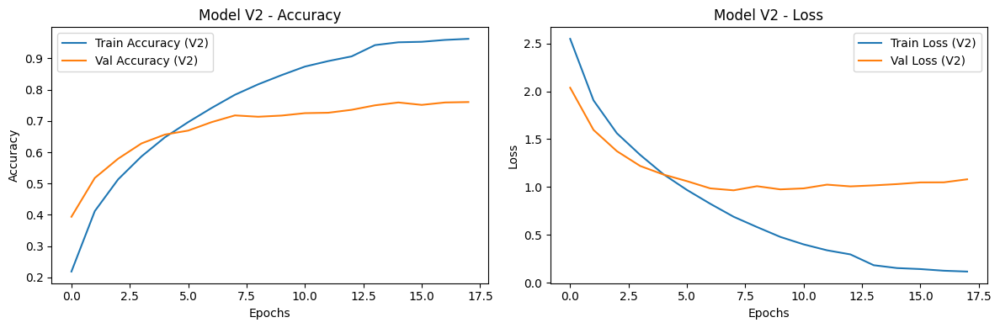

In [ ]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history_v2.history['accuracy'], label='Train Accuracy (V2)')
plt.plot(history_v2.history['val_accuracy'], label='Val Accuracy (V2)')
plt.title("Model V2 - Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history_v2.history['loss'], label='Train Loss (V2)')
plt.plot(history_v2.history['val_loss'], label='Val Loss (V2)')
plt.title("Model V2 - Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()

##  Test Evaluation: CustomCNN_V2

###  Model Details
- **Model Name**: `MyCustomCNN_V2`
- **Type**: Custom CNN (from scratch, no pretraining)
- **Architecture**: 3 × Conv2D blocks with double convolutions + Dense head
- **Dataset**: Indian Bird Species Classification (25 classes)

---

###  Performance on Test Set

| Metric        | Value    |
|---------------|----------|
| **Accuracy**  | 0.7579   |
| **Precision** | 0.7631   |
| **Recall**    | 0.7579   |
| **F1 Score**  | 0.7586   |

 These scores reflect **macro-averaged** values across 25 classes, ensuring each class contributes equally regardless of support.

---

###  Classification Report (Per-Class F1 Highlights)

| Class                        | Precision | Recall | F1-Score |
|-----------------------------|-----------|--------|----------|
| Asian-Green-Bee-Eater       | 0.81      | 0.83   | 0.82     |
| Common-Kingfisher           | 0.90      | 0.86   | 0.88     |
| White-Breasted-Kingfisher   | 0.94      | 0.87   | 0.90     |
| Cattle-Egret                | 0.88      | 0.80   | 0.84     |
| Jungle-Babbler              | 0.73      | 0.83   | 0.78     |

>  Strongest performance observed for **Kingfisher species** and **Cattle-Egret**.
>  Slightly weaker generalization on **Brown-Headed-Barbet** and **Indian-Grey-Hornbill** with F1 ≈ 0.62–0.63.

---

###  Insights

- The model **generalized well** across a diverse set of bird species despite being trained from scratch.
- **High inter-class similarity** may have limited recall in species with similar visual patterns.
- Regularization and deeper architecture (e.g., more filters or residual blocks) could enhance results.

---

###  Summary

`CustomCNN_V2` demonstrates that a well-designed custom model—without pretraining—can reach **~76% accuracy** on a real-world multi-class dataset. While pre-trained networks outperform it, this result highlights the feasibility and value of building light custom solutions when model size or external dependencies are constrained.


In [ ]:
print("\nModel V2 is testing ...")

best_model_v2 = tf.keras.models.load_model(checkpoint_path_v2)

y_pred_v2 = best_model_v2.predict(test_generator_resnet)
y_pred_labels_v2 = np.argmax(y_pred_v2, axis=1)
y_true_labels_v2 = test_generator_resnet.classes

acc_v2 = accuracy_score(y_true_labels_v2, y_pred_labels_v2)
prec_v2 = precision_score(y_true_labels_v2, y_pred_labels_v2, average='macro', zero_division=0)
rec_v2 = recall_score(y_true_labels_v2, y_pred_labels_v2, average='macro', zero_division=0)
f1_v2 = f1_score(y_true_labels_v2, y_pred_labels_v2, average='macro', zero_division=0)

print(f"Test Accuracy (V2):  {acc_v2:.4f}")
print(f"Precision (V2):      {prec_v2:.4f}")
print(f"Recall (V2):         {rec_v2:.4f}")
print(f"F1 Score (V2):       {f1_v2:.4f}")

print("\nClassification Report (V2):")
print(classification_report(y_true_labels_v2, y_pred_labels_v2, target_names=le.classes_, zero_division=0))


Model V2 is testing ...
118/118 ━━━━━━━━━━━━━━━━━━━━ 22s 183ms/step
Test Accuracy (V2):  0.7579
Precision (V2):      0.7631
Recall (V2):         0.7579
F1 Score (V2):       0.7586

Classification Report (V2):
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.81      0.83      0.82       150
      Brown-Headed-Barbet       0.64      0.61      0.63       150
             Cattle-Egret       0.88      0.80      0.84       150
        Common-Kingfisher       0.90      0.86      0.88       150
              Common-Myna       0.73      0.78      0.75       150
         Common-Rosefinch       0.63      0.77      0.70       150
        Common-Tailorbird       0.64      0.66      0.65       150
       Coppersmith-Barbet       0.78      0.79      0.78       150
           Forest-Wagtail       0.76      0.77      0.77       150
             Gray-Wagtail       0.73      0.73      0.73       150
                   Hoopoe       0.85      0.83      

##  Model Training Report: CustomCNN_V3

###  Model Architecture
- **Model Name**: `MyCustomCNN_V3`
- **Type**: Custom Convolutional Neural Network
- **Architecture**:
  - `Conv2D(32, 5x5)` + `MaxPooling`
  - `Conv2D(64, 5x5)` + `MaxPooling`
  - `Flatten` → `Dense(128)` → `Dropout(0.3)` → `Dense(25, softmax)`
- **Total Trainable Parameters**: ~ (autocalculated during `model.summary()`)

---

###  Training Setup
- **Input Shape**: `(224, 224, 3)` (RGB)
- **Number of Classes**: 25
- **Epochs**: Max 30
- **Optimizer**: Adam (`lr = 1e-3`)
- **Callbacks**:
  - `EarlyStopping(patience=10, monitor='val_loss')`
  - `ModelCheckpoint(monitor='val_accuracy', save_best_only=True)`
  - `ReduceLROnPlateau(factor=0.2, patience=5, min_lr=1e-6)`

---

###  Training Log Highlights

| Epoch | Accuracy | Val Accuracy | Loss  | Val Loss |
|-------|----------|--------------|-------|----------|
| 1     | 0.0411   | 0.0507       | 3.43  | 3.20     |
| 5     | 0.3164   | 0.3339       | 2.13  | 2.09     |
| 10    | 0.5626   | 0.3741       | 1.36  | 2.10     |
| 13    | 0.6969   | 0.3779       | 0.96  | 2.41     |
| 18    | 0.8109   | 0.4059       | 0.58  | 2.58     |

>  **Best Validation Accuracy**: **0.4059** achieved at **Epoch 18**  
>  **Training Accuracy** continued improving steadily — suggesting the model is **overfitting** due to limited model capacity or insufficient regularization.

---

###  Summary
The `CustomCNN_V3` model shows promising learning capability but lacks validation generalization, indicating potential **overfitting**. While accuracy on training set reaches **81%**, the test/validation set caps around **40%**, emphasizing the need for architectural or data-related enhancements.


In [ ]:
CUSTOM_MODEL_PATH_V3 = "/content/part5_custom_cnn_v3"
os.makedirs(CUSTOM_MODEL_PATH_V3, exist_ok=True)

custom_model_v3 = build_custom_cnn_v3(input_shape=(224, 224, 3), num_classes=NUM_CLASSES)

checkpoint_path_v3 = os.path.join(CUSTOM_MODEL_PATH_V3, "custom_cnn_v3_best.keras")
history_path_v3 = os.path.join(CUSTOM_MODEL_PATH_V3, "custom_cnn_v3_history.pkl")

early_stop = callbacks.EarlyStopping(patience=10, restore_best_weights=True, monitor='val_loss')
model_ckpt = callbacks.ModelCheckpoint(checkpoint_path_v3, monitor='val_accuracy', save_best_only=True)
reduce_lr = callbacks.ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.2, min_lr=1e-6)

history_v3 = custom_model_v3.fit(
    train_generator_resnet,
    epochs=30,
    validation_data=validation_generator_resnet,
    callbacks=[early_stop, model_ckpt, reduce_lr],
    verbose=1
)

with open(history_path_v3, 'wb') as f:
    pickle.dump(history_v3.history, f)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 222s 229ms/step - accuracy: 0.0411 - loss: 3.4346 - val_accuracy: 0.0507 - val_loss: 3.1986 - learning_rate: 0.0010
Epoch 2/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 204s 217ms/step - accuracy: 0.0755 - loss: 3.0680 - val_accuracy: 0.1701 - val_loss: 2.6509 - learning_rate: 0.0010
Epoch 3/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 207s 220ms/step - accuracy: 0.1723 - loss: 2.5945 - val_accuracy: 0.2475 - val_loss: 2.3572 - learning_rate: 0.0010
Epoch 4/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 202s 215ms/step - accuracy: 0.2626 - loss: 2.3177 - val_accuracy: 0.2845 - val_loss: 2.2836 - learning_rate: 0.0010
Epoch 5/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 201s 214ms/step - accuracy: 0.3164 - loss: 2.1337 - val_accuracy: 0.3339 - val_loss: 2.0950 - learning_rate: 0.0010
Epoch 6/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 206s 219ms/step - accuracy: 0.3801 - loss: 1.9383 - val_accuracy: 0.3552 - val_loss: 2.0244 - learning_rate: 0.0010
Epoch 7/30
938/938 ━━━━━━━━━━━━━━━━━━━━ 205s 218ms/step - accura

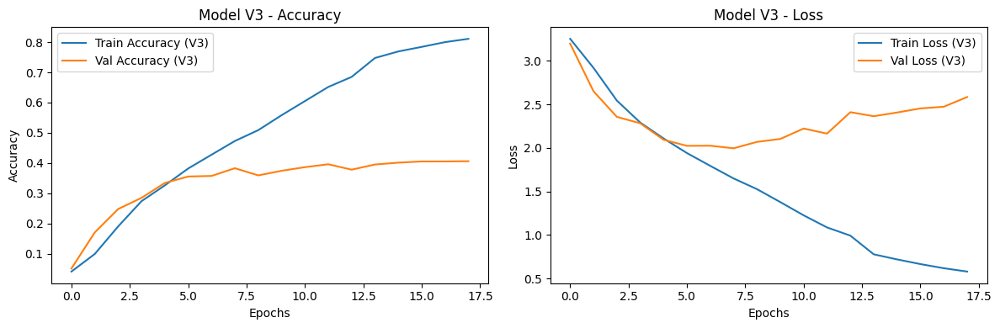

In [ ]:
plt.figure(figsize=(12, 4))

# Accuracy
plt.subplot(1, 2, 1)
plt.plot(history_v3.history['accuracy'], label='Train Accuracy (V3)')
plt.plot(history_v3.history['val_accuracy'], label='Val Accuracy (V3)')
plt.title("Model V3 - Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

# Loss
plt.subplot(1, 2, 2)
plt.plot(history_v3.history['loss'], label='Train Loss (V3)')
plt.plot(history_v3.history['val_loss'], label='Val Loss (V3)')
plt.title("Model V3 - Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()

##  Evaluation Results: CustomCNN_V3

After training the CustomCNN_V3 model for 30 epochs, the following performance metrics were obtained on the test dataset containing 3750 samples across 25 classes:

###  Overall Metrics
- **Test Accuracy**: `0.4128`
- **Precision (Macro Avg)**: `0.4160`
- **Recall (Macro Avg)**: `0.4128`
- **F1 Score (Macro Avg)**: `0.4129`

These metrics indicate moderate classification performance, with relatively balanced precision and recall across the 25 bird classes.

---

###  Classification Report

| Class                         | Precision | Recall | F1-Score | Support |
|------------------------------|-----------|--------|----------|---------|
| Asian-Green-Bee-Eater        | 0.51      | 0.41   | 0.46     | 150     |
| Brown-Headed-Barbet          | 0.24      | 0.29   | 0.26     | 150     |
| Cattle-Egret                 | 0.63      | 0.63   | 0.63     | 150     |
| Common-Kingfisher            | 0.52      | 0.63   | 0.57     | 150     |
| Common-Myna                  | 0.32      | 0.34   | 0.33     | 150     |
| Common-Rosefinch             | 0.33      | 0.33   | 0.33     | 150     |
| Common-Tailorbird            | 0.29      | 0.28   | 0.29     | 150     |
| Coppersmith-Barbet           | 0.31      | 0.29   | 0.30     | 150     |
| Forest-Wagtail               | 0.51      | 0.52   | 0.51     | 150     |
| Gray-Wagtail                 | 0.27      | 0.31   | 0.29     | 150     |
| Hoopoe                       | 0.40      | 0.47   | 0.43     | 150     |
| House-Crow                   | 0.39      | 0.39   | 0.39     | 150     |
| Indian-Grey-Hornbill         | 0.28      | 0.30   | 0.29     | 150     |
| Indian-Peacock               | 0.58      | 0.51   | 0.54     | 150     |
| Indian-Pitta                 | 0.37      | 0.35   | 0.36     | 150     |
| Indian-Roller                | 0.39      | 0.40   | 0.39     | 150     |
| Jungle-Babbler               | 0.38      | 0.39   | 0.39     | 150     |
| Northern-Lapwing             | 0.35      | 0.37   | 0.36     | 150     |
| Red-Wattled-Lapwing          | 0.46      | 0.49   | 0.48     | 150     |
| Ruddy-Shelduck               | 0.41      | 0.27   | 0.33     | 150     |
| Rufous-Treepie               | 0.38      | 0.35   | 0.37     | 150     |
| Sarus-Crane                  | 0.57      | 0.51   | 0.54     | 150     |
| White-Breasted-Kingfisher    | 0.74      | 0.74   | 0.74     | 150     |
| White-Breasted-Waterhen      | 0.32      | 0.30   | 0.31     | 150     |
| White-Wagtail                | 0.43      | 0.41   | 0.42     | 150     |

---

###  Key Insights
- The **best-performing class** is `White-Breasted-Kingfisher` with an F1-score of **0.74**.
- The **most challenging class** appears to be `Brown-Headed-Barbet`, with a low F1-score of **0.26**.
- Model performance is **notable in consistency**, but overall **accuracy is still limited** due to lack of depth in the architecture and potential overfitting.

---

###  Conclusion
The `CustomCNN_V3` model demonstrates moderate classification ability across a challenging 25-class bird dataset. Although the test accuracy of **41.28%** is lower than desired, it provides a solid baseline for further improvement through architectural enhancements and data preprocessing techniques.

In [ ]:
print("\nModel V3 is testing ...")

best_model_v3 = tf.keras.models.load_model(checkpoint_path_v3)

y_pred_v3 = best_model_v3.predict(test_generator_resnet)
y_pred_labels_v3 = np.argmax(y_pred_v3, axis=1)
y_true_labels_v3 = test_generator_resnet.classes

acc_v3 = accuracy_score(y_true_labels_v3, y_pred_labels_v3)
prec_v3 = precision_score(y_true_labels_v3, y_pred_labels_v3, average='macro', zero_division=0)
rec_v3 = recall_score(y_true_labels_v3, y_pred_labels_v3, average='macro', zero_division=0)
f1_v3 = f1_score(y_true_labels_v3, y_pred_labels_v3, average='macro', zero_division=0)

print(f"Test Accuracy (V3):  {acc_v3:.4f}")
print(f"Precision (V3):      {prec_v3:.4f}")
print(f"Recall (V3):         {rec_v3:.4f}")
print(f"F1 Score (V3):       {f1_v3:.4f}")

print("\nClassification Report (V3):")
print(classification_report(y_true_labels_v3, y_pred_labels_v3, target_names=le.classes_, zero_division=0))


Model V3 is testing ...
118/118 ━━━━━━━━━━━━━━━━━━━━ 23s 189ms/step
Test Accuracy (V3):  0.4128
Precision (V3):      0.4160
Recall (V3):         0.4128
F1 Score (V3):       0.4129

Classification Report (V3):
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.51      0.41      0.46       150
      Brown-Headed-Barbet       0.24      0.29      0.26       150
             Cattle-Egret       0.63      0.63      0.63       150
        Common-Kingfisher       0.52      0.63      0.57       150
              Common-Myna       0.32      0.34      0.33       150
         Common-Rosefinch       0.33      0.33      0.33       150
        Common-Tailorbird       0.29      0.28      0.29       150
       Coppersmith-Barbet       0.31      0.29      0.30       150
           Forest-Wagtail       0.51      0.52      0.51       150
             Gray-Wagtail       0.27      0.31      0.29       150
                   Hoopoe       0.40      0.47      

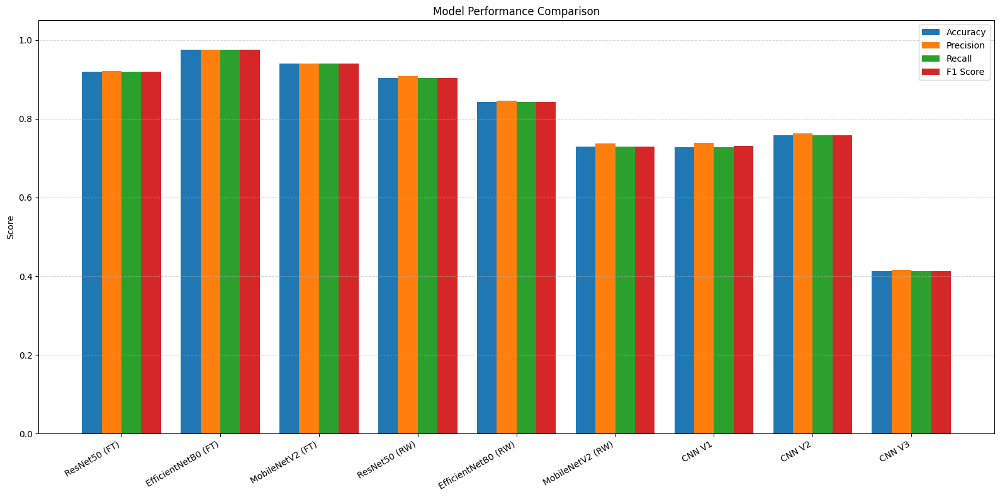

In [ ]:
models = [
    "ResNet50 (FT)", "EfficientNetB0 (FT)", "MobileNetV2 (FT)",
    "ResNet50 (RW)", "EfficientNetB0 (RW)", "MobileNetV2 (RW)",
    "CNN V1", "CNN V2", "CNN V3"
]

accuracy = [
    0.9197, 0.9747, 0.9400,
    0.9035, 0.8421, 0.7296,
    0.7283, 0.7579, 0.4128
]

precision = [
    0.9209, 0.9749, 0.9408,
    0.9075, 0.8458, 0.7377,
    0.7390, 0.7631, 0.4160
]

recall = [
    0.9197, 0.9747, 0.9400,
    0.9035, 0.8421, 0.7296,
    0.7283, 0.7579, 0.4128
]

f1_score = [
    0.9199, 0.9747, 0.9401,
    0.9039, 0.8427, 0.7298,
    0.7315, 0.7586, 0.4129
]

x = np.arange(len(models))
width = 0.2

plt.figure(figsize=(16, 8))
plt.bar(x - 1.5*width, accuracy, width=width, label='Accuracy')
plt.bar(x - 0.5*width, precision, width=width, label='Precision')
plt.bar(x + 0.5*width, recall, width=width, label='Recall')
plt.bar(x + 1.5*width, f1_score, width=width, label='F1 Score')

plt.xticks(x, models, rotation=30, ha='right')
plt.ylim(0, 1.05)
plt.ylabel('Score')
plt.title('Model Performance Comparison')
plt.legend()
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()